# Import required packages

In [1]:
import netCDF4
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
import pandas as pd
import xarray as xr
import gpflow
from netCDF4 import Dataset
import tensorflow as tf
import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler

import scipy.stats as stats
from scipy.stats import norm
from scipy.spatial.distance import pdist, squareform
from scipy.stats import pearsonr, spearmanr
from matplotlib.colors import BoundaryNorm
from matplotlib.ticker import MaxNLocator

from gpflow.utilities import print_summary, set_trainable, to_default_float
# Use the jupyter notebook format by default to display model parameters
gpflow.config.set_default_summary_fmt("notebook")

from sklearn.decomposition import PCA

from scipy.cluster.vq import kmeans

import tensorflow_probability as tfp
from tensorflow_probability import distributions as tfd
f64 = gpflow.utilities.to_default_float


In [2]:
pip install print-versions

In [3]:
# show versions of packages used in this notebook
from print_versions import print_versions
print_versions(globals())

netCDF4==1.6.5
numpy==1.26.4
pandas==1.5.0
xarray==2024.7.0
gpflow==2.10.0
tensorflow==2.18.1
sklearn==1.6.1
scipy==1.13.1
matplotlib==3.9.4
tensorflow_probability==0.25.0


# Functions for creating dataframes, implementing models, predicting, visualisations

## Creating dataframes

Get the depths for the NW-ATL region

In [ ]:
depths = xr.open_dataset('mean_cell_depth-thickness_CO5-CO6.nc')
# Get depths with depths.isel({'y': lat, 'x': lon}) etc. has the middle depth for each of the 51 vertical levels

Create dictionary with dataframe for selected grid-cells from a box-9 region. 

In [ ]:
import glob
import os

def merged_box9_dfs(xs = [1], ys= [1],
                     forecast_days=['-12', '012'],
                     vars=['CHL', 'N4n', 'Visib', 'N3n'],
                     depths=[0], 
                     loc = 'x116y156'):

    merged_dfs = {}

    # Folder contatining satellite and forecast .ncdf files for a region
    folder = str(f'{loc}box9_data')
    
    sat_path = glob.glob(os.path.join(folder,  # navigate to the location folder
                                           f'*satellite*.nc'))[0]  # Get the last file matching the pattern - 'corrected' satellite obs

    sat_ds = xr.open_dataset(sat_path)
    
    # Extract from 9x9 coordinates: satellite and listed variables/depths for each forecast day
    for x in xs:
        for y in ys:
            loc = f'x{x}y{y}'
            
            # Check that there is data for that location, i.e. it is not a land point, 
            # if so then create and add dataframe with values for that grid-cell, otherwise go to next location
            
            if not np.all(np.isnan(sat_ds['CHL'].isel(x=x, y=y).values.ravel())):    # At least one value is not NaN
                # Prepare DataFrame for satellite data
                sat_df = pd.DataFrame({
                                'Time': sat_ds['time'].values.ravel(),
                                'CHL-sat': sat_ds['CHL'].isel(x=x, y=y).values.ravel(),
                                'CHL_uncertainty': sat_ds['CHL_uncertainty'].isel(x=x, y=y).values.ravel()
                                })
                sat_df.Time = pd.to_datetime(sat_df['Time'][:,].values.ravel()).normalize()
                

                # Prepare forecast DataFrames for each forecast day
                forecast_dfs = []
                for day in forecast_days:
                    forecast_path = glob.glob(os.path.join(folder,  # navigate to the location folder
                                            f'*.{day}*.nc'))[0]  # Get the last file matching the pattern - 'corrected' satellite obs
                    ds = xr.open_dataset(forecast_path)
                    
                    data = {'Time': ds['time_counter'].values.ravel()}

                    for var in vars:
                        # If that variable is predicted for vertical depths this needs to be indexed as well
                        if len(ds[var].shape) == 4:
                            for depth in depths:
                                colname = f"{var}{day}_{depth}"
                                data[colname] = ds[var].isel({'deptht': depth, 'x': x, 'y':y}).values.ravel()
                        # Otherwise only the x/y within the box9 region needs to be indexed
                        elif len(ds[var].shape) == 3:
                            colname = f"{var}{day}"
                            data[colname] = ds[var].isel(x=x, y=y).values.ravel()
                    forecast_df = pd.DataFrame(data)
                    forecast_df['Time'] = pd.to_datetime(forecast_df['Time'][:,].values.ravel()).normalize()
                    
                    forecast_dfs.append(forecast_df)

                # Merge all forecast DataFrames on Time
                merged_df = forecast_dfs[0]
                
                for df in forecast_dfs[1:]:
                    merged_df = merged_df.merge(df, on='Time', how='outer')
                
                # Merge with satellite data
                merged_df = merged_df.merge(sat_df, on='Time', how='left')
                
                # Filter by date range and add columns
                merged_df = merged_df[(merged_df['Time'] > np.datetime64('2021-06-01')) &
                                    (merged_df['Time'] < np.datetime64('2024-05-13'))]
                merged_df['longitude'] = ds['nav_lon'].isel(x=x, y=y).values.ravel()[0]
                merged_df['latitude'] = ds['nav_lat'].isel(x=x, y=y).values.ravel()[0]
                
                merged_df['bias012'] = merged_df['CHL-sat'] - merged_df['CHL012_0']
                merged_df = merged_df.sort_values(by='Time')
                # Add dataframe for that grid cell to dictionary for the region
                merged_dfs[loc] = merged_df
                
                ds.close()
                sat_ds.close()
        for loc in list(merged_dfs.keys()):
            merged_dfs[loc]['Point'] = loc

    return merged_dfs

## Model Visualisation and Validation

In [ ]:
def validation_metrics(CHL_sat, bias_true,  bias_GP_pred= None, thresh = 2, return_values = False):
    # Convert true and predicted bias to true and predicted Chlorophyll 
    CHL_true = CHL_sat
    CHL_pred = CHL_sat - bias_true
    CHL_GP_pred = CHL_pred + bias_GP_pred
    print(f'% Days where bias-adjustment is more accurate than original forecast: {np.round(((np.abs(CHL_true - CHL_pred)-np.abs(CHL_true - CHL_GP_pred))>0).sum()/CHL_GP_pred.shape[0], 4) *100}%')
    print('\033[1m' + 'The original forecast:' + '\033[0m')


    CHL_true = np.asarray(CHL_true).ravel()
    CHL_pred = np.asarray(CHL_pred).ravel()
    mae = np.mean(np.abs(CHL_true - CHL_pred))
    rmse = np.sqrt(np.mean((CHL_true - CHL_pred) ** 2))
    rmedse = np.sqrt(np.median((CHL_true - CHL_pred) ** 2))
    r_squared = 1 - (np.sum((CHL_true - CHL_pred) ** 2) / np.sum((CHL_true - np.mean(CHL_true)) ** 2))
    print(f'MAE: {mae:.3f}, RMSE: {rmse:.3f}, RMedianSE: {rmedse:.3f},  R-squared: {r_squared:.3f}')

    """
    Calculates true and false positives and negatives values passing a given threshold - referred to as a 'spike'
    """
    threshold = thresh
    # Boolean arrays for event detection
    obs_event = CHL_true > threshold
    pred_event = CHL_pred > threshold

    # Calculate confusion matrix components
    TP = np.sum((pred_event == 1) & (obs_event == 1))
    FP = np.sum((pred_event == 1) & (obs_event == 0))
    TN = np.sum((pred_event == 0) & (obs_event == 0))
    FN = np.sum((pred_event == 0) & (obs_event == 1))

    # Create results table
    confusion_table = pd.DataFrame({
        '': ['Predicted Bloom', 'Predicted No Bloom'],
        'True Bloom': [TP, FN],
        'True No Bloom': [FP, TN] }).set_index('')
    precision = TP/(TP+FP)
    recall = TP/(TP+FN)
    print(confusion_table)
    print(f'Precision: {np.round(precision, 2)}')
    print(f'Recall: {np.round(recall, 2)}')
    if return_values == True:
        return_list = [mae, rmedse, precision, recall]
    ######
    if CHL_GP_pred is not None:
        
        print('\033[1m' + 'The GP forecast:' + '\033[0m')

        CHL_pred = CHL_GP_pred    
        mae = np.mean(np.abs(CHL_true - CHL_pred))
        rmse = np.sqrt(np.mean((CHL_true - CHL_pred) ** 2))
        rmedse = np.sqrt(np.median((CHL_true - CHL_pred) ** 2))
        r_squared = 1 - (np.sum((CHL_true - CHL_pred) ** 2) / np.sum((CHL_true - np.mean(CHL_true)) ** 2))
        print(f'MAE: {mae:.3f}, RMSE: {rmse:.3f}, RMedianSE: {rmedse:.3f}, R-squared: {r_squared:.3f}')
        
        """
        Calculates true and false positives and negatives values passing a given threshold - referred to as a 'spike'
        """
        threshold = thresh
        # Boolean arrays for bloom  event detection
        obs_event = CHL_true > threshold
        pred_event = CHL_pred > threshold

        # Calculate confusion matrix components
        TP = np.sum((pred_event == 1) & (obs_event == 1))
        FP = np.sum((pred_event == 1) & (obs_event == 0))
        TN = np.sum((pred_event == 0) & (obs_event == 0))
        FN = np.sum((pred_event == 0) & (obs_event == 1))

        # Create results table
        confusion_table = pd.DataFrame({      '': ['Predicted Bloom', 'Predicted No Bloom'],
            'True Bloom': [TP, FN],  'True No Bloom': [FP, TN]}).set_index('')
        precision = TP/(TP+FP)
        recall = TP/(TP+FN)
        print(confusion_table)
        print(f'Precision: {np.round(TP/(TP+FP), 2)}')
        print(f'Recall: {np.round(TP/(TP+FN), 2)}')
        
        if return_values == True:
            for val in [mae, rmedse, precision, recall]:
                return_list.append(val)
            return return_list

In [ ]:
def scatter_preds(y_test, y_m, y_CI, loc, title=None):
    '''
    Plot the true vs predicted bias with the 95% confidence intervals. 
    y_m, y_test, y_CI for the testing indices. 
    '''
    plt.figure(figsize=(6, 5))
    plt.errorbar(y_test, 
            y_m,
            yerr= y_CI, 
            fmt='o', 
            ecolor='gray', 
            alpha=0.7, 
            capsize=3, 
            label='Mean with 95% CI'
        )
    plt.xlabel('Actual bias')
    plt.ylabel('Predicted bias by GP')
    plt.title(title)
    error_range = np.linspace(np.min(y_m - y_CI)-0.3, np.max(y_m + y_CI)+0.3)
    plt.plot(error_range, error_range, alpha = 0.2, color = 'red')
    plt.axhline(0, color = 'green', alpha = 0.2)
    plt.axvline(0, color = 'green', alpha = 0.2)
    plt.legend()
    plt.show()

# Section 2: Data Exploration

Figure 2

(18993.0, 19723.0)

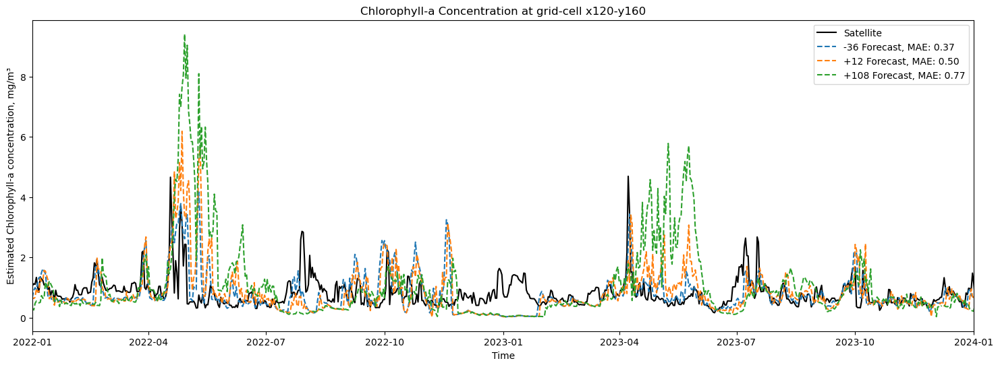

In [9]:
# Create Dataframe for x120y160 point with chl forecast for different lead times
x120y160 = merged_box9_dfs(xs = [4], ys= [4],
                     forecast_days=['-36', '-12', '012', '060', '108'],
                     vars=['CHL'],
                     depths=[0], 
                     loc = 'x116y156')['x4y4']

# Create figure showing chl forecasts over 2 years of time-series
plt.figure(figsize=(18, 6))
plt.plot(x120y160['Time'], x120y160['CHL-sat'], label='Satellite', linestyle='-', markersize=2, color='black')

MAE = np.format_float_positional(np.mean(np.abs(x120y160['CHL-sat'] -x120y160['CHL-36_0'])), 2)
plt.plot(x120y160['Time'], x120y160['CHL-36_0'], label=f'-36 Forecast, MAE: {MAE}', linestyle='--', markersize=2)
MAE = np.format_float_positional(np.mean(np.abs(x120y160['CHL-sat'] -x120y160['CHL012_0'])), 2)
plt.plot(x120y160['Time'], x120y160['CHL012_0'], label=f'+12 Forecast, MAE: {MAE}', linestyle='--', markersize=2)
MAE = np.format_float_positional(np.mean(np.abs(x120y160['CHL-sat'] -x120y160['CHL108_0'])), 2)
plt.plot(x120y160['Time'], x120y160['CHL108_0'], label=f'+108 Forecast, MAE: {MAE}', linestyle='--', markersize=2)

plt.xlabel('Time')
plt.ylabel('Estimated Chlorophyll-a concentration, mg/m³')
plt.title('Chlorophyll-a Concentration at grid-cell x120-y160')
plt.legend()
plt.xlim(pd.Timestamp('2022-01-01'), pd.Timestamp('2024-01-01'))

## Bias patterns

In [ ]:
# Create Dataframe for x60y80 point with chl forecast for different lead times
x60y80 = merged_box9_dfs(xs = [4], ys= [4],
                     forecast_days=[ '-12', '012', '060', '108'],
                     vars=['CHL'],
                     depths=[0], 
                     loc = 'x56y76')['x4y4']

# Create figure showing chl forecasts over 2 years of time-series
fig, ax = plt.subplots(2, 1, figsize=(18, 12))
MAE = np.format_float_positional(np.mean(np.abs(x120y160['CHL-sat'] -x120y160['CHL012_0'])), 2)
ax[0].plot(x120y160['Time'], x120y160['CHL-sat'] - x120y160['CHL012_0'], label=f'+12 Forecast, MAE: {MAE}', linestyle='--', markersize=2)

MAE = np.format_float_positional(np.mean(np.abs(x60y80['CHL-sat'] -x60y80['CHL012_0'])), 2)
ax[1].plot(x60y80['Time'], x60y80['CHL-sat'] - x60y80['CHL012_0'], label=f'+12 Forecast, MAE: {MAE}', linestyle='--', markersize=2)

for i, loc in enumerate(['x120y160', 'x60y80']):
    ax[i].set_xlabel('Time')
    ax[i].set_ylabel('Forecast bias, mg/m³')
    ax[i].set_title(f'Chlorophyll-a Concentration bias at grid-cell {loc}')
    ax[i].axhline(0, alpha = 0.5, color = 'grey')
    ax[i].legend()
    ax[i].set_xlim(pd.Timestamp('2022-01-01'), pd.Timestamp('2024-01-01'))

## Distributions of bias

Text(0.5, 1.0, 'Distribution of bias for different forecast lead times, at grid cell x120y160')

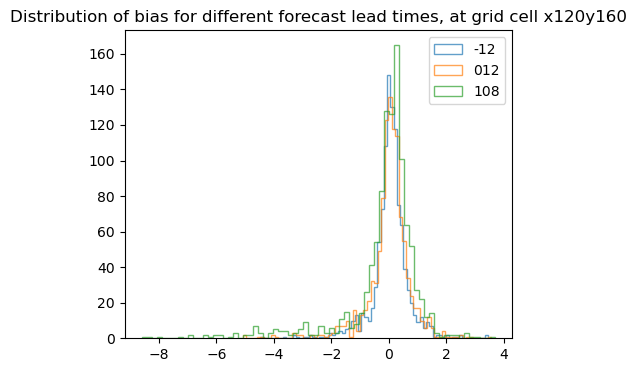

In [ ]:
x120y160['bias-12'] = x120y160['CHL-sat'] - x120y160['CHL-12_0']
x120y160['bias060'] = x120y160['CHL-sat'] - x120y160['CHL060_0']
x120y160['bias108'] = x120y160['CHL-sat'] - x120y160['CHL108_0']
plt.figure(figsize = (5, 4))
for forecast in ['-12', '012', '108']:
    plt.hist(x120y160[f'bias{forecast}'], bins = 70, alpha =0.7, label = f'{forecast}' ,histtype = 'step' )
plt.legend()
plt.title('Distribution of bias for different forecast lead times, at grid cell x120y160')

In [ ]:
x120y160[['bias-12', 'bias012', 'bias060', 'bias108']].describe()

,bias-12,bias012,bias060,bias108
count,1074.000000,1074.000000,1074.000000,1074.000000
mean,0.032890,-0.001698,-0.092668,-0.195631
std,0.673547,0.797194,1.069859,1.352524
min,-4.472445,-5.085835,-7.475314,-8.579401
25%,-0.179524,-0.227853,-0.306703,-0.335688
50%,0.064292,0.067397,0.089334,0.098619
75%,0.310107,0.341512,0.391677,0.416803
max,3.449564,3.563197,3.282003,3.683004


## CHL-uncertainty 

In [ ]:
x120y160['CHL_uncertainty_absolute'] = (x120y160['CHL_uncertainty']/100)*x120y160['CHL-sat']
print('Grid-cell x120y160')
display(x120y160[['CHL_uncertainty', 'CHL_uncertainty_absolute']].describe().iloc[1:, :])

print('Grid-cell x60y80')
x60y80['CHL_uncertainty_absolute'] = (x60y80['CHL_uncertainty']/100)*x60y80['CHL-sat']
x60y80[['CHL_uncertainty', 'CHL_uncertainty_absolute']].describe().iloc[1:, :]


grid-cell x120y160


,CHL_uncertainty,CHL_uncertainty_absolute
mean,31.922173,0.252971
std,8.201945,0.149592
min,16.020000,0.061202
25%,26.389999,0.166933
50%,30.124999,0.217778
75%,34.702500,0.289889
max,70.209999,1.850783


grid-cell x60y80


,CHL_uncertainty,CHL_uncertainty_absolute
mean,35.364861,0.078114
std,7.032537,0.040602
min,20.680000,0.027216
25%,30.467499,0.055213
50%,34.419998,0.066927
75%,38.397499,0.086677
max,69.639999,0.331315


## Spatio-Temporal structure of bias

In [219]:
# for bias 012 and 060
x116y156_bias_dfs = merged_box9_dfs(xs =np.arange(9), ys= np.arange(9),
                     forecast_days=[ '012', '060'],
                     vars=['CHL'],
                     depths=[0], 
                     loc = 'x116y156')
for loc, df in x116y156_bias_dfs.items():
    df['bias060'] = df['CHL-sat'] - df['CHL060_0']
    df.dropna(axis =0, inplace = True)

In [225]:
x116y156_bias = pd.concat(x116y156_bias_dfs, ignore_index = True)
n_locations = len(np.unique(x116y156_bias.Point))
corr_matrix = np.zeros((n_locations, n_locations))
value_dist_matrix = np.zeros((n_locations, n_locations))
lats = []
lons = []
for i, pi in enumerate(np.unique(x116y156_bias.Point)):
    lons.append(np.unique(x116y156_bias[x116y156_bias.Point == pi].longitude))
    lats.append(np.unique(x116y156_bias[x116y156_bias.Point == pi].latitude))
    for j , pj in enumerate(np.unique(x116y156_bias.Point)):
            corr_matrix[i, j] = pearsonr(x116y156_bias[x116y156_bias.Point == pi]['bias012'], x116y156_bias[x116y156_bias.Point == pj]['bias012'])[0]
            value_dist_matrix[i,j] = 0.5 * (np.mean(x116y156_bias[x116y156_bias.Point == pi]['bias012']) - np.mean(x116y156_bias[x116y156_bias.Point == pj]['bias012'])) ** 2
coords = np.column_stack([lats, lons])
distances = squareform(pdist(coords, metric='euclidean'))

# Flatten upper triangle for analysis
mask = np.triu(np.ones_like(distances, dtype=bool), k=1)
dist_flat = distances[mask]
corr_flat = corr_matrix[np.triu(np.ones_like(corr_matrix, dtype=bool), k=1)]
value_dist_matrix_flat = value_dist_matrix[np.triu(np.ones_like(value_dist_matrix, dtype=bool), k=1)]


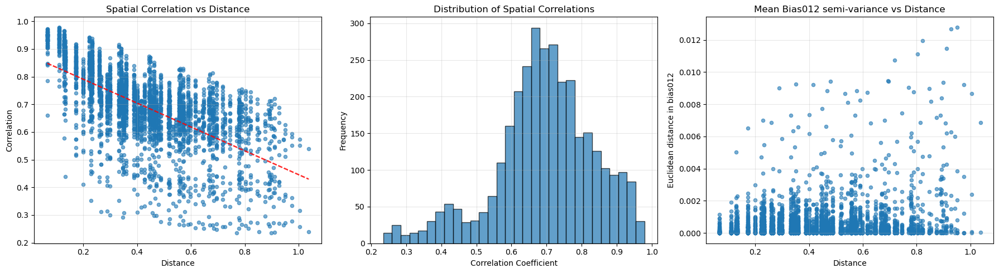

In [ ]:
# Plot the correlations
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

## Plot 1: Distance vs Correlation
axes[0].scatter(dist_flat, corr_flat,     alpha=0.6, s=20)
axes[0].set_xlabel('Distance')
axes[0].set_ylabel('Correlation')
axes[0].set_title('Spatial Correlation vs Distance')
axes[0].grid(True, alpha=0.3)
        
# Add trend line
z = np.polyfit(dist_flat, corr_flat, 1)
p = np.poly1d(z)
axes[0].plot(dist_flat, p(dist_flat), "r--", alpha=0.8)
    
## Plot 3: Correlation distribution
axes[1].hist(corr_flat, bins=30, alpha=0.7, edgecolor='black')
axes[1].set_xlabel('Correlation Coefficient')
axes[1].set_ylabel('Frequency')
axes[1].set_title('Distribution of Spatial Correlations')
axes[1].grid(True, alpha=0.3)

# This is more like a variogram
axes[2].scatter(dist_flat, value_dist_matrix_flat, alpha = 0.6, s= 20)
axes[2].set_xlabel('Distance')
axes[2].set_ylabel('Euclidean distance in bias012')
axes[2].set_title('Mean Bias012 semi-variance vs Distance')
axes[2].grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [239]:
# Temporal correlations
n_times = x116y156_bias_dfs['x0y0'].shape[0]
# Calculate autocorrelation for each location
autocorr_results = {}
lags = np.arange(0, 10)
    
for i, loc in enumerate(np.unique(x116y156_bias.Point)):
    ts = x116y156_bias[x116y156_bias.Point == loc]['bias012']
    autocorr = []
        
    for lag in lags:
        if lag == 0:
            autocorr.append(1.0)
        else:
            if len(ts) > lag:
                corr = pearsonr(ts[:-lag], ts[lag:])[0]
                autocorr.append(corr)
            else:
                autocorr.append(np.nan)
        
    autocorr_results[loc] = autocorr
    
    # Calculate mean autocorrelation across all locations
autocorr_matrix = np.array(list(autocorr_results.values()))
mean_autocorr = np.nanmean(autocorr_matrix, axis=0)
std_autocorr = np.nanstd(autocorr_matrix, axis=0)
    
# Calculate decorrelation timescale (e-folding time)
decorr_time = None
for i, corr in enumerate(mean_autocorr):
    if corr < np.exp(-1):  # e^(-1) ≈ 0.37
        decorr_time = lags[i]
        break
    
results = {
        'lags': lags,
        'autocorr_matrix': autocorr_matrix,
        'mean_autocorr': mean_autocorr,
        'std_autocorr': std_autocorr,
        'decorr_time': decorr_time    }
# plot_temporal_correlation(results, figsize=(12, 4))

C:\Users\giuli\AppData\Local\Temp\ipykernel_23124\115774431.py:16: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  corr = pearsonr(ts[:-lag], ts[lag:])[0]


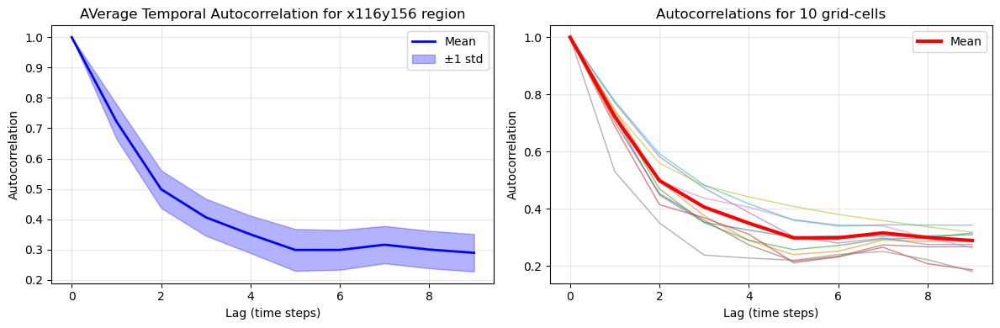

In [ ]:
# Plot temporal correlations
fig, axes = plt.subplots(1, 2, figsize=(12,4))
    
# Plot 1: Mean autocorrelation with confidence bands
lags = results['lags']
mean_autocorr = results['mean_autocorr']
std_autocorr = results['std_autocorr']

axes[0].plot(lags, mean_autocorr, 'b-', linewidth=2, label='Mean')
axes[0].fill_between(lags, 
                    mean_autocorr - std_autocorr, 
                    mean_autocorr + std_autocorr, 
                    alpha=0.3, color='blue', label='±1 std')

axes[0].set_xlabel('Lag (time steps)')
axes[0].set_ylabel('Autocorrelation')
axes[0].set_title('Average Temporal Autocorrelation for x116y156 region')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Plot 2: Autocorrelation for individual locations
autocorr_matrix = results['autocorr_matrix']
for i in np.random.choice(range(81), size = 10, replace = False):  # Show 9 random locations
    axes[1].plot(lags, autocorr_matrix[i, :], alpha=0.6, linewidth=1)

axes[1].plot(lags, mean_autocorr, 'r-', linewidth=3, label='Mean')
axes[1].set_xlabel('Lag (time steps)')
axes[1].set_ylabel('Autocorrelation')
axes[1].set_title('Autocorrelations for 10 grid-cells')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [66]:
x116y156_box9 =  merged_box9_dfs(xs =np.arange(9), ys= np.arange(9),
                     forecast_days=[ '012'],
                     vars=['CHL', 'N3n', 'Visib', 'O2o'],
                     depths=[0], 
                     loc = 'x116y156')

In [67]:
x201y175_box9 =  merged_box9_dfs(xs =np.arange(9), ys= np.arange(9),
                     forecast_days=[ '012'],
                     vars=['CHL', 'N3n', 'Visib', 'O2o'],
                     depths=[0], 
                     loc = 'x201y175')

### Figure 4: Spatial and Temporal correlations in +12 forecast bias

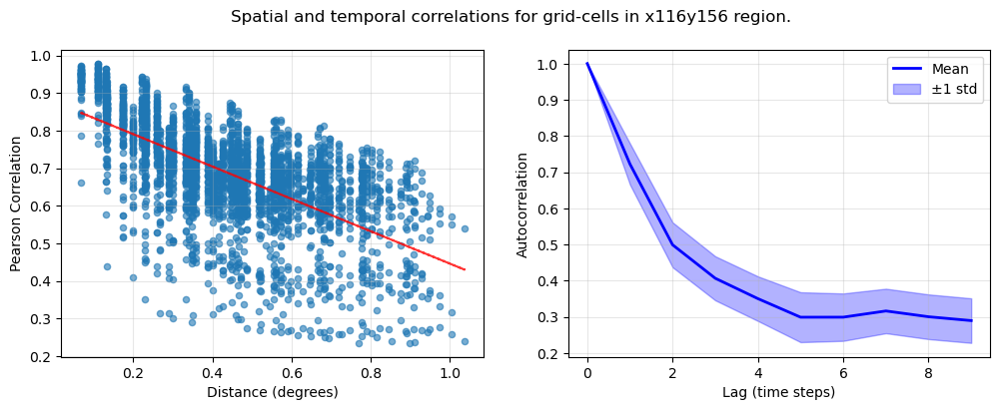

In [ ]:

fig, axes = plt.subplots(1, 2, figsize=(12,4))

## Plot 1: Distance vs Correlation
axes[0].scatter(dist_flat, corr_flat,     alpha=0.6, s=20)
axes[0].set_xlabel('Distance (degrees)')
axes[0].set_ylabel('Pearson Correlation')
fig.suptitle('Spatial and temporal correlations for grid-cells in x116y156 region.')
axes[0].grid(True, alpha=0.3)
        
# Add trend line
z = np.polyfit(dist_flat, corr_flat, 1)
p = np.poly1d(z)
axes[0].plot(dist_flat, p(dist_flat), "r--", alpha=0.8)

axes[1].plot(lags, mean_autocorr, 'b-', linewidth=2, label='Mean')
axes[1].fill_between(lags, 
                    mean_autocorr - std_autocorr, 
                    mean_autocorr + std_autocorr, 
                    alpha=0.3, color='blue', label='±1 std')

axes[1].set_xlabel('Lag (time steps)')
axes[1].set_ylabel('Autocorrelation')
# axes[1].set_title('Average Temporal Autocorrelation for x116y156 region')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

## Figure 6: Bias in region over consecutive days

In [ ]:
def region_vis(days = None, loc_dict = None, bias_var = None, title = None):
    coord_dict = {}

    for loc in loc_dict.keys():
        match = re.match(r'x(\d+)y(\d+)', loc)
        x, y = int(match.group(1)), int(match.group(2))
        coord_dict[loc] = (x, y)
    fig, ax = plt.subplots(1, len(days), figsize = (len(days)*4,3)) 
    for i, day in enumerate(days):
        truegrid = np.full((9,9), np.nan)

        for loc, (x, y) in coord_dict.items():
            if loc in loc_dict.keys():
                df = loc_dict[loc]
                truegrid[y,x] = df[df.Time == day][f'{bias_var}']

        # Plot the True bias
        vmax =  5# np.nanmax(np.abs(truegrid))
        im = ax[i].imshow(truegrid, cmap='RdBu_r', aspect='auto', origin='lower',
                    vmax =vmax, vmin = -vmax)
        
        
        ax[i].set_title(day.strftime("%Y-%m-%d"))
        cbar = fig.colorbar(im, ax=ax[i])
    fig.suptitle(title)
    plt.tight_layout()
    plt.show()

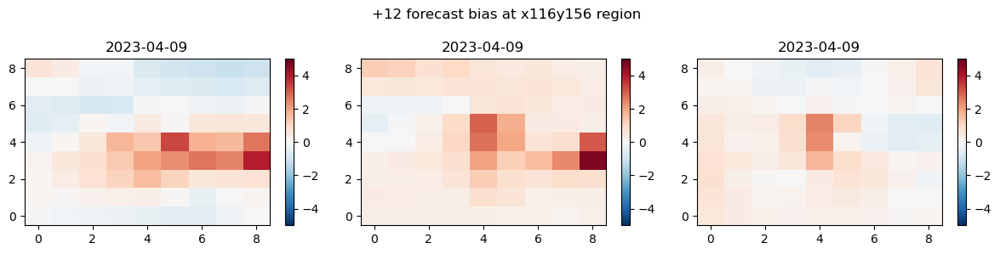

In [ ]:
days = [dt.datetime(2023, 4, 7) + dt.timedelta(days=x) for x in range(3)]
region_vis(days = days, loc_dict = x116y156_bias_dfs, bias_var = 'bias012', title = '+12 forecast bias at x116y156 region')

# Section 4 - Modelling single grid-cell

Initial modelling of a single grid cell was done with x120y160, this is the central cell (x4y4) of the x116y156 box9 region.

In [11]:
x120y160 = merged_box9_dfs(xs = [4], ys= [4],
                     forecast_days=['-36', '-12', '012'],
                     vars=['CHL', 'votemper', 'N1p', 'N3n','N4n', 'N5s', 'O2o', 'Visib', 
                           'pH','karamld', 'pCO2', 'vosaline'],
                     depths=[0], 
                     loc = 'x116y156')['x4y4']
# Merge the ERA5 satellite data
x120y160ERA5 = xr.open_dataset('Time series at x120-y160/ERA5_daily_solar_thermal_120-y160_2020-2024.nc')

x120y160ERA5_df = pd.DataFrame({'Time': pd.to_datetime(x120y160ERA5['time'][:,].values.ravel()).normalize(),
                                'SSRD':x120y160ERA5['SSRD'][:,].values.ravel(),
                                'STRD': x120y160ERA5['STRD'][:,].values.ravel()})

x120y160 = x120y160.merge(x120y160ERA5_df, on='Time', how='left') 

In [12]:
# Add lagged variables for previous timesteps, so that for each row only the variables that would be available are given
for var in ['bias012', 'CHL-sat', 'SSRD', 'STRD', 'CHL-36_0', 'votemper-36_0', 'N1p-36_0', 'N3n-36_0', 'N4n-36_0',
       'N5s-36_0', 'O2o-36_0', 'Visib-36_0', 'pH-36_0', 'karamld-36',
       'pCO2-36_0', 'vosaline-36_0']:
    x120y160[f'{var}-2days'] = x120y160[var].shift(2)

for var in ['CHL-sat', 'bias012']:
    x120y160[f'{var}-3days'] = x120y160[var].shift(3)
    
for var in ['CHL-sat', 'SSRD', 'STRD', 'CHL-12_0','votemper-12_0', 'N1p-12_0', 'N3n-12_0', 'N4n-12_0', 'N5s-12_0', 'O2o-12_0', 'Visib-12_0', 'pH-12_0',
       'karamld-12', 'pCO2-12_0', 'vosaline-12_0']:
    x120y160[f'{var}-1days'] = x120y160[var].shift(1)

columns_to_delete = [ 'votemper-36_0', 'N1p-36_0', 'N3n-36_0', 'N4n-36_0', 'N5s-36_0', 'O2o-36_0', 'Visib-36_0', 'pH-36_0', 'karamld-36',
       'pCO2-36_0', 'vosaline-36_0',  'N3n-12_0', 'Visib-12_0', 'pH-12_0', 'O2o-12_0', 'votemper-12_0', 'karamld-12', 'pCO2-12_0', 'vosaline-12_0', 'Point', 'longitude', 'latitude']
x120y160.drop(columns = columns_to_delete, axis = 1, inplace = True)
x120y160.head()

# Add bias of DA steps from 1/2 days previously
x120y160['bias-36'] = x120y160['CHL-sat-2days'] - x120y160['CHL-36_0-2days']
x120y160['bias-12'] = x120y160['CHL-sat-1days'] - x120y160['CHL-12_0-1days']

# Add difference in CHL in previous 
x120y160['dCHL-satday-2-3'] = np.diff(x120y160['CHL-sat-2days'], n=1, prepend= 0)
x120y160['dCHL-satday-1-2'] = np.diff(x120y160['CHL-sat-1days'], n=1, prepend= 0)
x120y160['dCHL-satday-2-4'] = np.diff(x120y160['CHL-sat-2days'], n=2, prepend= [0,0])

x120y160.dropna(axis = 0, inplace = True)


In [ ]:
cols = ['bias012'] + [col for col in x120y160.columns if col not in ['bias012']]
corr_df =x120y160[cols].drop(['Time'], axis =1)
corr = corr_df.corr(method = 'spearman') # as values are not normally distributed!
corr.style.background_gradient(cmap='coolwarm')

,bias012,CHL-36_0,CHL-12_0,N1p-12_0,N4n-12_0,N5s-12_0,CHL012_0,votemper012_0,N1p012_0,N3n012_0,N4n012_0,N5s012_0,O2o012_0,Visib012_0,pH012_0,karamld012,pCO2012_0,vosaline012_0,CHL-sat,CHL_uncertainty,SSRD,STRD,bias012-2days,CHL-sat-2days,SSRD-2days,STRD-2days,CHL-36_0-2days,votemper-36_0-2days,N1p-36_0-2days,N3n-36_0-2days,N4n-36_0-2days,N5s-36_0-2days,O2o-36_0-2days,Visib-36_0-2days,pH-36_0-2days,karamld-36-2days,pCO2-36_0-2days,vosaline-36_0-2days,CHL-sat-3days,bias012-3days,CHL-sat-1days,SSRD-1days,STRD-1days,CHL-12_0-1days,votemper-12_0-1days,N1p-12_0-1days,N3n-12_0-1days,N4n-12_0-1days,N5s-12_0-1days,O2o-12_0-1days,Visib-12_0-1days,pH-12_0-1days,karamld-12-1days,pCO2-12_0-1days,vosaline-12_0-1days,bias-36,bias-12,dCHL-satday-2-3,dCHL-satday-1-2,dCHL-satday-2-4
bias012,1.000000,-0.368533,-0.472167,0.016220,-0.042679,0.026244,-0.681216,0.041932,0.028707,0.074921,-0.026387,0.031671,-0.146302,0.406264,-0.032741,0.139532,0.063422,0.200499,0.499218,-0.168026,-0.140059,-0.056554,0.553221,0.195251,-0.163889,0.001855,-0.517855,0.052422,-0.008460,0.039794,-0.032980,0.012745,-0.112920,0.368319,-0.009281,0.133601,0.043650,0.205100,0.138641,0.483550,0.336818,-0.145755,-0.039623,-0.615488,0.047037,0.009149,0.057730,-0.031007,0.022653,-0.126476,0.403199,-0.021484,0.138412,0.053969,0.204631,0.617577,0.844193,0.089343,0.243476,0.035355
CHL-36_0,-0.368533,1.000000,0.931412,0.076555,0.295465,0.071125,0.779443,-0.124699,0.081524,0.059411,0.293962,0.072459,0.191974,-0.462578,-0.007114,0.019975,-0.128139,-0.257458,0.358795,-0.203308,0.140764,-0.047901,-0.230645,0.327207,0.119234,-0.014572,0.721779,-0.118587,0.104236,0.084994,0.261409,0.083831,0.154790,-0.417879,-0.035491,0.024406,-0.103598,-0.233517,0.287013,-0.204172,0.358189,0.133895,-0.034717,0.777608,-0.121178,0.092943,0.072735,0.280888,0.078291,0.173686,-0.451938,-0.021578,0.020557,-0.115765,-0.246095,-0.348933,-0.368589,0.068847,0.074519,0.004908
CHL-12_0,-0.472167,0.931412,1.000000,0.087496,0.251460,0.079756,0.832163,-0.147064,0.092161,0.064341,0.246708,0.080028,0.228543,-0.494490,-0.019672,0.002578,-0.106920,-0.280589,0.274258,-0.172217,0.152593,-0.041110,-0.281501,0.289766,0.146521,-0.026563,0.739039,-0.144102,0.119896,0.094865,0.226765,0.094665,0.186986,-0.443923,-0.049511,0.007963,-0.082062,-0.259105,0.254557,-0.266016,0.315601,0.163945,-0.053112,0.812912,-0.146057,0.106736,0.080548,0.239781,0.087526,0.208539,-0.482612,-0.034357,0.005356,-0.094549,-0.270295,-0.385834,-0.430816,0.063975,0.068222,0.011614
N1p-12_0,0.016220,0.076555,0.087496,1.000000,-0.164148,0.893438,0.091201,-0.925917,0.998518,0.942900,-0.165725,0.892395,0.257644,-0.559398,-0.868810,0.790342,0.309980,-0.050053,0.130817,0.046250,-0.522324,-0.602330,0.027527,0.131298,-0.549848,-0.594823,0.059519,-0.916887,0.991376,0.936712,-0.134534,0.885859,0.215826,-0.569632,-0.859425,0.796774,0.302304,-0.041474,0.128892,0.031472,0.130857,-0.538354,-0.596727,0.080711,-0.922196,0.996469,0.940910,-0.151176,0.889677,0.231900,-0.559825,-0.866160,0.794051,0.308031,-0.046038,0.047231,0.025075,0.019206,0.015133,0.009748
N4n-12_0,-0.042679,0.295465,0.251460,-0.164148,1.000000,-0.215892,0.210442,0.215877,-0.160904,-0.059793,0.989346,-0.217494,-0.082310,-0.071959,0.201768,-0.131652,-0.242174,0.169196,0.209661,-0.088081,0.123884,0.126516,-0.031112,0.240123,0.136553,0.131494,0.354491,0.231500,-0.193495,-0.082883,0.919479,-0.221421,-0.025045,-0.123462,0.202998,-0.147690,-0.243289,0.187806,0.255640,-0.008167,0.223751,0.127137,0.130847,0.282301,0.224774,-0.179941,-0.072328,0.966284,-0.220907,-0.049774,-0.105595,0.204905,-0.137854,-0.244725,0.177004,-0.118902,-0.071027,-0.038488,-0.042212,-0.003466
N5s-12_0,0.026244,0.071125,0.079756,0.893438,-0.215892,1.000000,0.074159,-0.889151,0.891320,0.885476,-0.215546,0.998751,0.295018,-0.494008,-0.921764,0.799727,0.295941,-0.093623,0.115747,0.074496,-0.548452,-0.578983,0.026489,0.105465,-0.574747,-0.575870,0.062063,-0.882481,0.892322,0.881507,-0.203197,0.991914,0.252062,-0.504175,-0.917859,0.803438,0.291903,

In [ ]:
cols = ['bias012'] + [col for col in x120y160.columns if col not in ['bias012']]
corr_df =x120y160[cols].drop(['Time'], axis =1)

corr_df = corr_df[corr_df['bias012']>1.5] 
corr = corr_df.corr(method = 'spearman') # as values are not normally distributed!
corr.style.background_gradient(cmap='coolwarm')

,bias012,CHL-36_0,CHL-12_0,N1p-12_0,N4n-12_0,N5s-12_0,CHL012_0,votemper012_0,N1p012_0,N3n012_0,N4n012_0,N5s012_0,O2o012_0,Visib012_0,pH012_0,karamld012,pCO2012_0,vosaline012_0,CHL-sat,CHL_uncertainty,SSRD,STRD,bias012-2days,CHL-sat-2days,SSRD-2days,STRD-2days,CHL-36_0-2days,votemper-36_0-2days,N1p-36_0-2days,N3n-36_0-2days,N4n-36_0-2days,N5s-36_0-2days,O2o-36_0-2days,Visib-36_0-2days,pH-36_0-2days,karamld-36-2days,pCO2-36_0-2days,vosaline-36_0-2days,CHL-sat-3days,bias012-3days,CHL-sat-1days,SSRD-1days,STRD-1days,CHL-12_0-1days,votemper-12_0-1days,N1p-12_0-1days,N3n-12_0-1days,N4n-12_0-1days,N5s-12_0-1days,O2o-12_0-1days,Visib-12_0-1days,pH-12_0-1days,karamld-12-1days,pCO2-12_0-1days,vosaline-12_0-1days,bias-36,bias-12,dCHL-satday-2-3,dCHL-satday-1-2,dCHL-satday-2-4
bias012,1.000000,0.491228,0.403509,-0.164912,0.357895,0.189474,0.208772,0.087719,-0.131579,-0.008772,0.312281,0.178947,0.575439,0.217544,-0.164912,-0.301754,0.157895,-0.119298,0.792982,-0.392982,0.180702,0.057895,0.149123,0.401754,0.442105,-0.294737,0.563158,0.087719,-0.171930,-0.059649,0.068421,0.245614,0.728070,0.085965,-0.096491,-0.310526,0.096491,-0.292982,0.442105,0.007018,0.307018,0.391228,-0.082456,0.375439,0.049123,-0.163158,-0.117544,0.215789,0.233333,0.617544,0.175439,-0.149123,-0.336842,0.156140,-0.210526,0.010526,-0.008772,0.122807,0.070175,-0.017544
CHL-36_0,0.491228,1.000000,0.926316,0.357895,-0.117544,0.110526,0.766667,-0.478947,0.370175,0.224561,-0.108772,0.115789,0.284211,-0.378947,-0.075439,0.152632,0.077193,-0.510526,0.736842,-0.482456,0.107018,0.043860,-0.078947,0.235088,0.124561,-0.145614,0.519298,-0.480702,0.435088,0.292982,-0.107018,0.100000,0.415789,-0.238596,-0.080702,-0.063158,0.080702,-0.505263,0.340351,-0.273684,0.470175,0.135088,0.003509,0.722807,-0.496491,0.359649,0.252632,-0.087719,0.114035,0.275439,-0.349123,-0.092982,0.082456,0.115789,-0.510526,-0.075439,0.001754,0.231579,0.417544,-0.029825
CHL-12_0,0.403509,0.926316,1.000000,0.280702,-0.084211,0.047368,0.735088,-0.442105,0.326316,0.187719,-0.057895,0.073684,0.228070,-0.338596,-0.001754,0.163158,0.008772,-0.556140,0.645614,-0.298246,0.173684,0.033333,-0.022807,0.254386,0.061404,-0.047368,0.459649,-0.405263,0.392982,0.231579,-0.105263,0.028070,0.366667,-0.200000,-0.035088,-0.114035,0.035088,-0.507018,0.254386,-0.359649,0.464912,0.180702,0.145614,0.670175,-0.442105,0.314035,0.207018,-0.064912,0.042105,0.224561,-0.308772,-0.036842,0.080702,0.054386,-0.522807,-0.035088,0.038596,0.264912,0.403509,0.026316
N1p-12_0,-0.164912,0.357895,0.280702,1.000000,-0.564912,0.459649,0.329825,-0.908772,0.977193,0.873684,-0.557895,0.466667,-0.084211,-0.810526,-0.440351,0.805263,0.435088,-0.054386,0.017544,-0.417544,-0.454386,-0.603509,-0.203509,-0.164912,-0.387719,-0.464912,-0.052632,-0.877193,0.968421,0.842105,-0.471930,0.417544,-0.077193,-0.621053,-0.426316,0.578947,0.426316,0.043860,0.028070,-0.103509,0.236842,-0.505263,-0.487719,0.171930,-0.889474,0.984211,0.870175,-0.543860,0.419298,-0.047368,-0.743860,-0.421053,0.752632,0.426316,0.003509,-0.124561,0.115789,-0.050877,0.510526,-0.136842
N4n-12_0,0.357895,-0.117544,-0.084211,-0.564912,1.000000,-0.401754,-0.233333,0.622807,-0.538596,-0.259649,0.984211,-0.378947,0.150877,0.836842,0.524561,-0.691228,-0.529825,0.131579,0.005263,0.043860,0.512281,0.340351,0.071930,0.159649,0.596491,0.119298,0.142105,0.617544,-0.650877,-0.354386,0.836842,-0.394737,0.294737,0.549123,0.592982,-0.426316,-0.592982,0.112281,0.328070,0.112281,0.085965,0.608772,0.119298,-0.147368,0.629825,-0.585965,-0.363158,0.950877,-0.407018,0.208772,0.738596,0.571930,-0.656140,-0.589474,0.136842,0.052632,0.191228,-0.219298,-0.192982,-0.152632
N5s-12_0,0.189474,0.110526,0.047368,0.459649,-0.401754,1.000000,0.200000,-0.475439,0.440351,0.505263,-0.419298,0.994737,0.094737,-0.492982,-0.771930,0.603509,0.773684,0.231579,0.238596,-0.489474,-0.570175,-0.635088,-0.208772,-0.201754,-0.287719,-0.621053,0.307018,-0.428070,0.445614,0.649123,-0.438596,0.975439,0.077193,-0.614035,-0.764912,0.543860,0.764912,

Variables that have $|R|>0.4$ with $\text{bias}^{+12}_{t}$ and would be operationally available are:
$\text{bias}^{-36}_{t-2}, \text{bias}^{+12}_{t-2}, \text{CHL}^{-36}_{t-2}, \text{CHL}^{-12}_{t-1}, \text{Visib}^{+12}_{t}, \text{CHL}^{+12}_{t}$.


When the data was subset for $\text{bias}^{+12}_{t} > 1.5$, these additional variables had $|R|>0.4$:
$\text{O2o}^{-36}_{t-2}, \text{O2o}^{+12}_{t}, \text{SSRD}_{t-2},\text{CHL}^{sat}_{t-2},\text{CHL}^{sat}_{t-3}$.

Removing variables which are highly correlated, we are left with:
$\text{bias}^{+12}_{t-2}, \text{Visib}^{+12}_{t}, \text{CHL}^{+12}_{t}, \text{O2o}^{+12}_{t}, \text{SSRD}_{t-2},\text{CHL}^{sat}_{t-2},\text{CHL}^{sat}_{t-3}$.

Fitting linear regression model with these as input variables, predicting $\text{bias}^{+12}_{t}$.

In [ ]:
from sklearn.model_selection import train_test_split
import statsmodels.api as sm

X = x120y160[['bias012-2days', 'Visib012_0', 'CHL012_0', 'O2o012_0', 'SSRD-2days', 'CHL-sat-2days', 'CHL-sat-3days',
              'N3n012_0', 'vosaline012_0']]
y = x120y160['bias012']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=1234)

X_train = sm.add_constant(X_train)  # Adds a constant term for intercept
ols_model = sm.OLS(y_train, X_train).fit()
print(ols_model.summary())

y_pred = ols_model.predict( sm.add_constant(X_test))

                            OLS Regression Results                            
Dep. Variable:                bias012   R-squared:                       0.714
Model:                            OLS   Adj. R-squared:                  0.710
Method:                 Least Squares   F-statistic:                     167.4
Date:                Fri, 22 Aug 2025   Prob (F-statistic):          1.88e-157
Time:                        14:08:27   Log-Likelihood:                -310.61
No. Observations:                 612   AIC:                             641.2
Df Residuals:                     602   BIC:                             685.4
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const             9.5612      5.470      1.748

In [ ]:
from sklearn.model_selection import train_test_split
import statsmodels.api as sm

X = x120y160[['bias012-2days', 'Visib012_0', 'CHL012_0', 'O2o012_0','CHL-sat-2days', 'N3n012_0']]
y = x120y160['bias012']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=1234)

X_train = sm.add_constant(X_train)  # Adds a constant term for intercept
ols_model = sm.OLS(y_train, X_train).fit()
print(ols_model.summary())

y_pred = ols_model.predict( sm.add_constant(X_test))

                            OLS Regression Results                            
Dep. Variable:                bias012   R-squared:                       0.712
Model:                            OLS   Adj. R-squared:                  0.709
Method:                 Least Squares   F-statistic:                     249.0
Date:                Fri, 22 Aug 2025   Prob (F-statistic):          8.93e-160
Time:                        14:08:28   Log-Likelihood:                -313.48
No. Observations:                 612   AIC:                             641.0
Df Residuals:                     605   BIC:                             671.9
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.1259      0.331     -0.380

## Section 4.2: Fit GP

We now fit a GP model for the bias, using the linear regression for the mean function.

In [ ]:
x120y160.reset_index(inplace = True)
input_df = x120y160[['bias012-2days', 'Visib012_0', 'CHL012_0', 'O2o012_0','CHL-sat-2days', 'N3n012_0']]
scaler = StandardScaler()
X = np.asarray(input_df,
               dtype = np.float64)

X = scaler.fit_transform(X)

y = pd.DataFrame( x120y160['bias012'] )
y = (np.asarray(y, dtype=np.float64))

# Set train/test with random subset of datset, 60% train 40% test
split_idx = int(0.6 * len(x120y160))
# train_indices = np.arange(0, split_idx, 1)
# Random train/test 
train_indices = np.random.choice(len(input_df), size=split_idx, replace=False)
test_indices = [i for i in np.arange(len(x120y160)) if i not in train_indices]

X_train, X_test = X[train_indices, ], X[test_indices, ]
y_train, y_test = y[train_indices], y[test_indices]
print(f'Training dataset dimensions: {X_train.shape}')
print(f'Testing set size: {y_test.shape[0]}')

# Adding linear regression mean function
reg_indices = np.random.choice(train_indices, size=300, replace=False).tolist() 
reg = LinearRegression().fit(X[reg_indices, ], y[reg_indices ])
A_array = reg.coef_.T

model_x120y160 = gpflow.models.GPR(
    (X_train, y_train),
    kernel = gpflow.kernels.SquaredExponential(lengthscales= 0.5),
    noise_variance=0.04,
    mean_function = gpflow.functions.Linear(A = A_array,
                            b = reg.intercept_)
    ) 
# Fix the linear regression coefficients for the mean function
gpflow.set_trainable(model_x120y160.mean_function.A, False) 
gpflow.set_trainable(model_x120y160.mean_function.b, False)

# Use the default BFGS optimizer
opt = gpflow.optimizers.Scipy()
opt.minimize(model_x120y160.training_loss, # loss function is pre-defined by GPflow's own models
             model_x120y160.trainable_variables)
# Display estimated parameters    

print(f"Log marginal likelihood: {model_x120y160.maximum_log_likelihood_objective().numpy()}")
print_summary(model_x120y160) 

Training dataset dimensions: (612, 6)
Testing set size: 408
Log marginal likelihood: -220.02645055966775


name,class,transform,prior,trainable,shape,dtype,value
GPR.mean_function.A,Parameter,Identity,,False,"(6, 1)",float64,[[-8.61840918e-02...
GPR.mean_function.b,Parameter,Identity,,False,"(1,)",float64,[0.01468434]
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,0.23086701887241962
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.4797759266323076
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,0.025409856353515337


In [ ]:
# Automatic Relevance Determination- ARD
model_x120y160B = gpflow.models.GPR(
    (X_train, y_train),
    kernel = gpflow.kernels.SquaredExponential(lengthscales= np.repeat(0.5, 6)),
    noise_variance=0.04,
    mean_function = gpflow.functions.Linear(A = A_array,
                            b = reg.intercept_)
    ) 
# Fix the linear regression coefficients for the mean function
gpflow.set_trainable(model_x120y160.mean_function.A, False) 
gpflow.set_trainable(model_x120y160.mean_function.b, False)

# Use the default BFGS optimizer
opt = gpflow.optimizers.Scipy()
opt.minimize(model_x120y160B.training_loss, # loss function is pre-defined by GPflow's own models
             model_x120y160B.trainable_variables)
# Display estimated parameters    

print(f"Log marginal likelihood: {model_x120y160B.maximum_log_likelihood_objective().numpy()}")
print_summary(model_x120y160B) 
lengthscales_df = pd.DataFrame(index= input_df.columns,data = model_x120y160B.kernel.lengthscales.numpy())
lengthscales_df.columns = ['Estimated Lengthscales']
display(lengthscales_df)

Log marginal likelihood: -191.90365714815243


name,class,transform,prior,trainable,shape,dtype,value
GPR.mean_function.A,Parameter,Identity,,True,"(6, 1)",float64,[[-0.07280418...
GPR.mean_function.b,Parameter,Identity,,True,"(1,)",float64,[0.03671771]
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,0.23122334981123105
GPR.kernel.lengthscales,Parameter,Softplus,,True,"(6,)",float64,"[0.88430869, 0.29923384, 0.72973343..."
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,0.016247195667248363


,Estimated Lengthscales
bias012-2days,0.884
Visib012_0,0.299
CHL012_0,0.73
O2o012_0,0.307
CHL-sat-2days,0.899
N3n012_0,0.156


## Section 4.3: Validation of initial GP for single grid-cell

Figure 6

% Days where bias-adjustment is more accurate than original forecast: 71.57%
The original forecast:
MAE: 0.475, RMSE: 0.731, RMedianSE: 0.294,  R-squared: -1.258
                    True Bloom  True No Bloom
                                             
Predicted Bloom              4             21
Predicted No Bloom           6            377
Precision: 0.16
Recall: 0.4
The GP forecast:
MAE: 0.237, RMSE: 0.411, RMedianSE: 0.149, R-squared: 0.287
                    True Bloom  True No Bloom
                                             
Predicted Bloom              1              3
Predicted No Bloom           9            395
Precision: 0.25
Recall: 0.1


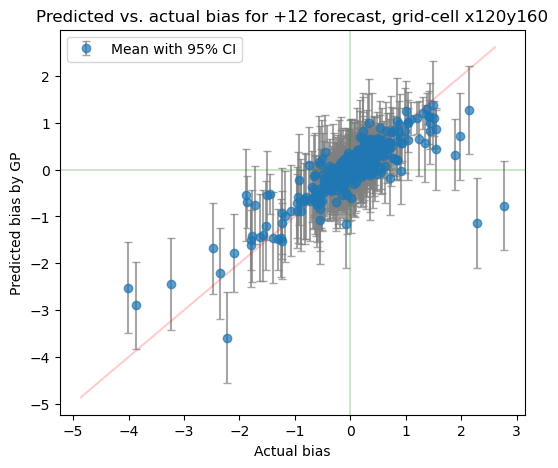

In [ ]:
CHL_sat = x120y160['CHL-sat'].iloc[test_indices]
y_m, y_var = model_x120y160B.predict_y(X_test)
y_CI = norm.ppf(0.975)*np.sqrt(y_var)

validation_metrics(CHL_sat, bias_true=y_test.ravel(),  bias_GP_pred= np.array(y_m).ravel(), thresh = 2, dchl_conf = False)
scatter_preds(y_test.ravel(), np.array(y_m).ravel(), np.array(y_CI).ravel(), loc = 'x120y160',
             title = 'Predicted vs. actual bias for +12 forecast, grid-cell x120y160')

The following code cell is to predict 1D 'slices' where all the input variables are held constant (at their mean value) apart from one. Evenly space values from the minimum to maximum value of the input variable are used instead of the observations. The left hand figures show the predicted bias (mean and confidence interval) over the input variable's range. The right hand figures show the distribution of values of that input variable. They show, for example that the confidence interval in narrower where more observations would have been present that that region of the input space.

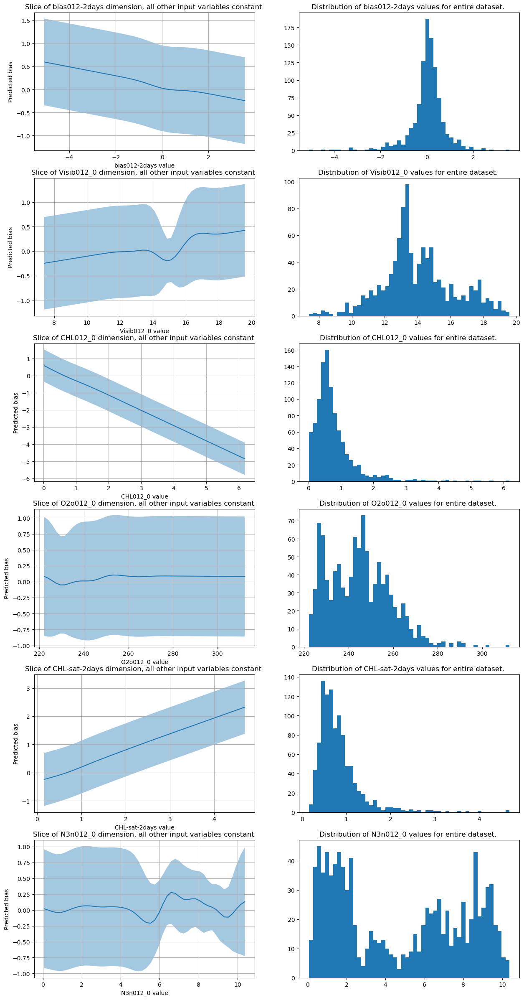

In [ ]:
def plotslices(m = None, D= None, X=None, preds = None, CI = None, df = None):
    '''
    Gives the y_preds and corresponding y_CI for a model prediction over train/test/full period of data.
    df refers to the merged_df with the columns dropped that are not included as inputs
    X is the array of df 
    D is the number of the input vars 0:D to plot 
    '''
    input_vars = df.columns
    
    n = 50
    if D == None:
        D = X.shape[1]

    fig, ax = plt.subplots(D, 2, figsize = (15,D*5))

    Xvar = np.zeros((n, D))

    for j in range(D):
        # Make one column a range of values over 
        
        for i in range(D):
            Xvar[:, i] = np.median(X[:, i])

        Xvar[:, j] = np.linspace(np.min(X[:, j]),np.max(X[:, j]), n)
        f_m, f_var = [np.array(x).ravel() for x in m.predict_f(Xvar, full_cov=False)]
        f_lower = f_m + norm.ppf(0.025) * np.sqrt(f_var)
        f_upper = f_m + norm.ppf(0.975) * np.sqrt(f_var)
        Xvar = scaler.inverse_transform(Xvar)
        ax[j, 0].set_title(f'Slice of {input_vars[j]} dimension, all other input variables constant ')
        ax[j,0].plot(Xvar[:,j], f_m, label = 'predicted mean')
        ax[j,0].fill_between(Xvar[:,j], f_lower, f_upper, label = '95% CI for f', alpha =0.4)
        ax[j,0].set_ylabel('Predicted bias')
        ax[j,0].grid()
        ax[j,0].set_xlabel(f'{input_vars[j]} value')
        # ax[j,0].set_ylim(-3, 3)
        ax[j, 1].hist(df[input_vars[j]], bins = 50)
        ax[j, 1].set_title(f'Distribution of {input_vars[j]} values for entire dataset. ')
        Xvar = np.zeros((n, D))
plotslices(m =model_x120y160B, X = X , df = input_df)

## Appendix 9.2: Applying single-grid cell  GP to other locations. 
Show the scatter plots and validation matrices

To create figures 23 and 24.

In [ ]:
def gridcell_GP(df, location):
    # df.reset_index(inplace = True)
    df.dropna(inplace = True, axis =0)
    input_df = df[['bias012-2days', 'Visib012_0', 'CHL012_0', 'O2o012_0','CHL-sat-2days', 'N3n012_0']]
    scaler = StandardScaler()
    X = np.asarray(input_df,
                   dtype = np.float64)

    X = scaler.fit_transform(X)

    y = pd.DataFrame( df['bias012'] )
    y = (np.asarray(y, dtype=np.float64))

    # Set train/test with random subset of datset, 60% train 40% test
    split_idx = int(0.6 * len(df))
    # train_indices = np.arange(0, split_idx, 1)
    # Random train/test 
    train_indices = np.random.choice(len(input_df), size=split_idx, replace=False)
    test_indices = [i for i in np.arange(len(df)) if i not in train_indices]

    X_train, X_test = X[train_indices, ], X[test_indices, ]
    y_train, y_test = y[train_indices], y[test_indices]
    print(f'Training dataset dimensions: {X_train.shape}')
    print(f'Testing set size: {y_test.shape[0]}')

    # Adding linear regression mean function
    reg_indices = np.random.choice(train_indices, size=300, replace=False).tolist() 
    reg = LinearRegression().fit(X[reg_indices, ], y[reg_indices ])
    A_array = reg.coef_.T

    # Automatic Relevance Determination- ARD
    model_x120y160B = gpflow.models.GPR(
        (X_train, y_train),
        kernel = gpflow.kernels.SquaredExponential(lengthscales= np.repeat(0.5, 6)),
        noise_variance=0.04,
        mean_function = gpflow.functions.Linear(A = A_array,
                                b = reg.intercept_)
        ) 
    # Fix the linear regression coefficients for the mean function
    gpflow.set_trainable(model_x120y160B.mean_function.A, False) 
    gpflow.set_trainable(model_x120y160B.mean_function.b, False)

    # Use the default BFGS optimizer
    opt = gpflow.optimizers.Scipy()
    opt.minimize(model_x120y160B.training_loss, # loss function is pre-defined by GPflow's own models
                 model_x120y160B.trainable_variables)
    # Display estimated parameters    

    print(f"Log marginal likelihood: {model_x120y160B.maximum_log_likelihood_objective().numpy()}")
    print_summary(model_x120y160B) 
    lengthscales_df = pd.DataFrame(index= input_df.columns,data = model_x120y160B.kernel.lengthscales.numpy())
    lengthscales_df.columns = ['Estimated Lengthscales']
    display(lengthscales_df)

    CHL_sat = df['CHL-sat'].iloc[test_indices]
    y_m, y_var = model_x120y160B.predict_y(X_test)
    y_CI = norm.ppf(0.975)*np.sqrt(y_var)

    validation_metrics(CHL_sat, bias_true=y_test.ravel(),  bias_GP_pred= np.array(y_m).ravel(), thresh = 2, dchl_conf = False)
    scatter_preds(y_test.ravel(), np.array(y_m).ravel(), np.array(y_CI).ravel(), loc = location,
                 title = f'Predicted vs. actual bias for +12 forecast, grid-cell {location}')

Training dataset dimensions: (643, 6)
Testing set size: 429
Log marginal likelihood: -857.4236376017216


name,class,transform,prior,trainable,shape,dtype,value
GPR.mean_function.A,Parameter,Identity,,False,"(6, 1)",float64,[[-0.17147604...
GPR.mean_function.b,Parameter,Identity,,False,"(1,)",float64,[0.72061618]
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.86991
GPR.kernel.lengthscales,Parameter,Softplus,,True,"(6,)",float64,"[1.09378, 1.1247, 0.6668302..."
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,0.08430597568376585


,Estimated Lengthscales
bias012-2days,1.093776
Visib012_0,1.124698
CHL012_0,0.666830
O2o012_0,0.563077
CHL-sat-2days,0.543424
N3n012_0,0.258841


% Days where bias-adjustment is more accurate than original forecast: 69.69999999999999%
The original forecast:
MAE: 0.957, RMSE: 1.466, RMedianSE: 0.635,  R-squared: 0.101
                    True Bloom  True No Bloom
                                             
Predicted Bloom             93             24
Predicted No Bloom         102            210
Precision: 0.79
Recall: 0.48
The GP forecast:
MAE: 0.630, RMSE: 1.113, RMedianSE: 0.355, R-squared: 0.482
                    True Bloom  True No Bloom
                                             
Predicted Bloom            135             43
Predicted No Bloom          60            191
Precision: 0.76
Recall: 0.69


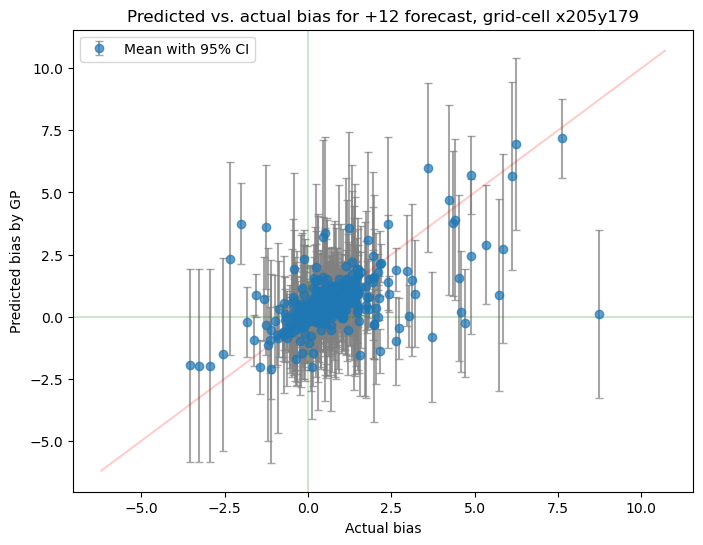

In [ ]:
gridcell_GP(x201y175_dfs['x4y4'],location = 'x205y179')

Training dataset dimensions: (643, 6)
Testing set size: 429
Log marginal likelihood: 935.1265110559041


name,class,transform,prior,trainable,shape,dtype,value
GPR.mean_function.A,Parameter,Identity,,False,"(6, 1)",float64,[[0.0032649...
GPR.mean_function.b,Parameter,Identity,,False,"(1,)",float64,[-0.28838215]
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,0.01632555451199542
GPR.kernel.lengthscales,Parameter,Softplus,,True,"(6,)",float64,"[8.24440075e-01, 5.77578000e+00, 2.55552745e-01..."
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,0.0008019610281344345


,Estimated Lengthscales
bias012-2days,0.824440
Visib012_0,5.775784
CHL012_0,0.255553
O2o012_0,5624.990311
CHL-sat-2days,0.358123
N3n012_0,0.297440


% Days where bias-adjustment is more accurate than original forecast: 83.91999999999999%
The original forecast:
MAE: 0.324, RMSE: 0.771, RMedianSE: 0.099,  R-squared: -26.050
                    True Bloom  True No Bloom
                                             
Predicted Bloom              0             21
Predicted No Bloom           0            408
Precision: 0.0
Recall: nan
The GP forecast:
MAE: 0.046, RMSE: 0.086, RMedianSE: 0.025, R-squared: 0.667
                    True Bloom  True No Bloom
                                             
Predicted Bloom              0              0
Predicted No Bloom           0            429
Precision: nan
Recall: nan


C:\Users\gg461\AppData\Local\Temp\ipykernel_7080\3041856427.py:49: RuntimeWarning: invalid value encountered in scalar divide
  print(f'Recall: {np.round(TP/(TP+FN), 2)}')
C:\Users\gg461\AppData\Local\Temp\ipykernel_7080\3041856427.py:83: RuntimeWarning: invalid value encountered in scalar divide
  print(f'Precision: {np.round(TP/(TP+FP), 2)}')
C:\Users\gg461\AppData\Local\Temp\ipykernel_7080\3041856427.py:84: RuntimeWarning: invalid value encountered in scalar divide
  print(f'Recall: {np.round(TP/(TP+FN), 2)}')


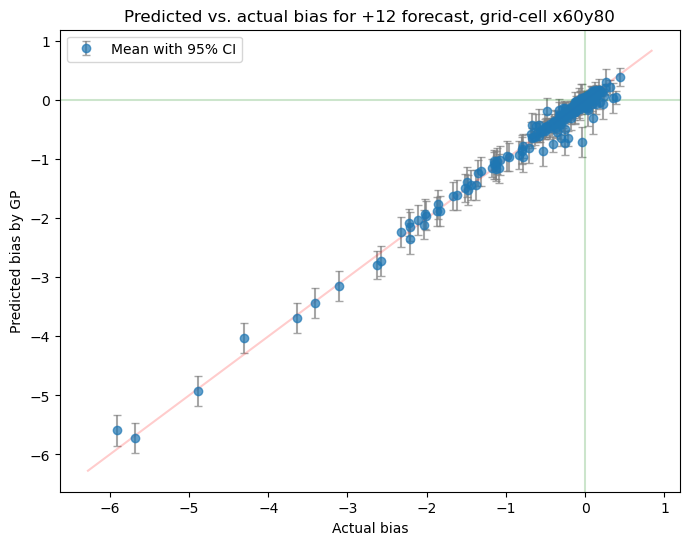

In [ ]:
gridcell_GP(x56y76_dfs['x4y4'],location = 'x60y80')

Training dataset dimensions: (540, 6)
Testing set size: 361
Log marginal likelihood: -268.7416594540549


name,class,transform,prior,trainable,shape,dtype,value
GPR.mean_function.A,Parameter,Identity,,False,"(6, 1)",float64,[[0.27639505...
GPR.mean_function.b,Parameter,Identity,,False,"(1,)",float64,[0.01945761]
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,1.01256
GPR.kernel.lengthscales,Parameter,Softplus,,True,"(6,)",float64,"[0.13695214, 0.19671611, 1.35803..."
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,0.002848793922961298


,Estimated Lengthscales
bias012-2days,0.136952
Visib012_0,0.196716
CHL012_0,1.358030
O2o012_0,20.067963
CHL-sat-2days,1.036425
N3n012_0,0.629510


% Days where bias-adjustment is more accurate than original forecast: 66.47999999999999%
The original forecast:
MAE: 0.390, RMSE: 0.945, RMedianSE: 0.203,  R-squared: -0.190
                    True Bloom  True No Bloom
                                             
Predicted Bloom              3              6
Predicted No Bloom           2            350
Precision: 0.33
Recall: 0.6
The GP forecast:
MAE: 0.327, RMSE: 0.913, RMedianSE: 0.127, R-squared: -0.111
                    True Bloom  True No Bloom
                                             
Predicted Bloom              4              8
Predicted No Bloom           1            348
Precision: 0.33
Recall: 0.8


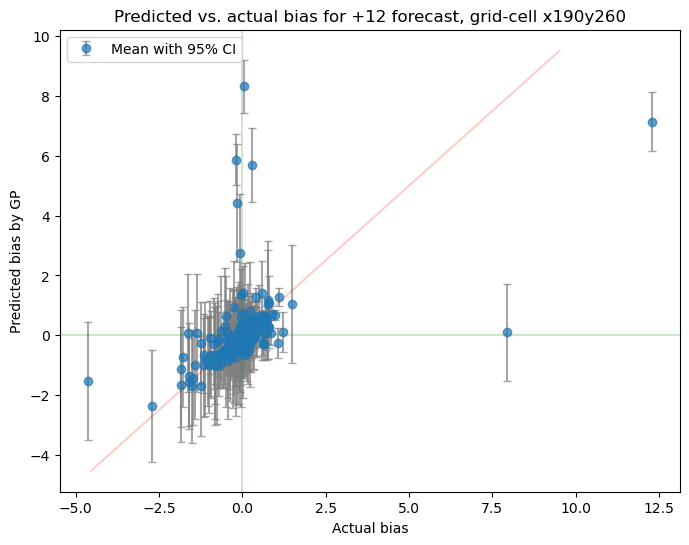

In [ ]:
gridcell_GP(x186y256_dfs['x4y4'],location = 'x190y260')

## Section 4.4: PCA for depths

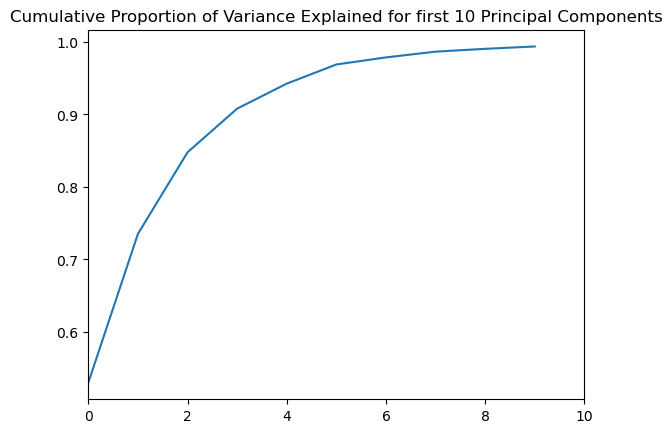

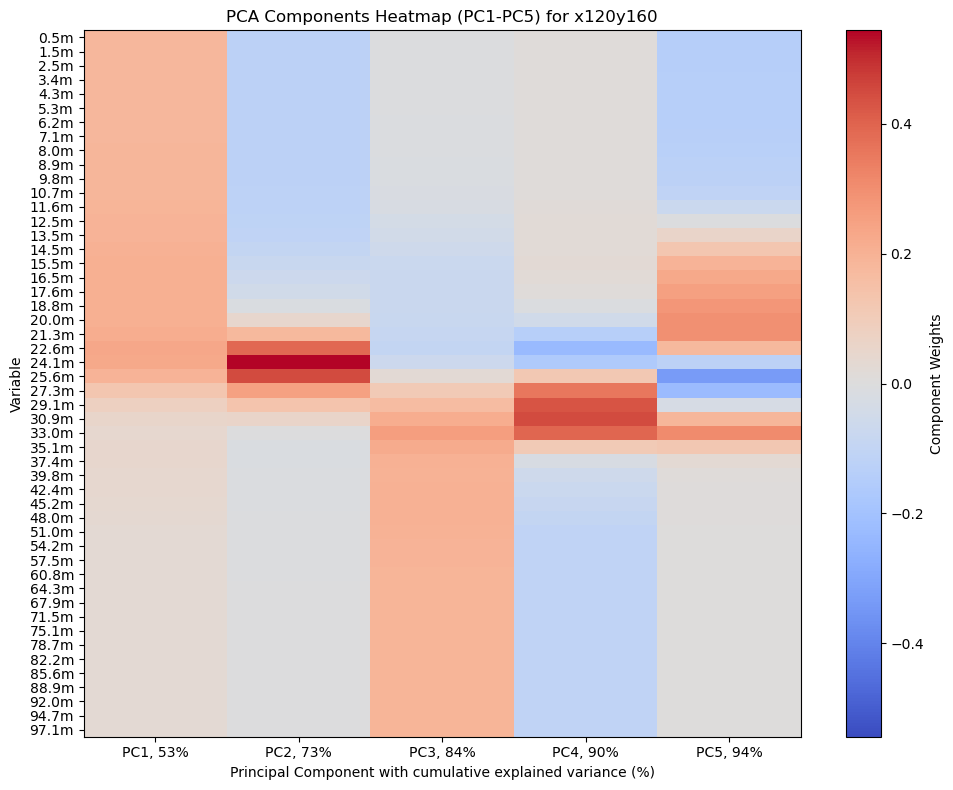

In [ ]:
x120y160_depths  = merged_box9_dfs(xs = [4], ys= [4],
                     forecast_days=['-12', '012'],
                     vars=['CHL'],
                     depths=np.arange(50), # the last depth doesn't have complete values so is excluded. 
                     loc = 'x116y156')['x4y4']
x120y160_depths.dropna(inplace = True)

def depths_col_list(colname = 'CHL-12'):
    col_list = [f'{colname}_{depth}' for depth in np.arange(50)]
    return col_list

x120y160_depthsCHL = x120y160_depths[['Time'] + depths_col_list('CHL-12')]

n = 10
pca = PCA(n_components = n)
fit = pca.fit(x120y160_depthsCHL.iloc[:, 1:], # vectors to reduce in dimension
              x120y160_depths['bias012'].shift(-1).dropna()) # output
pca_trans = pca.fit_transform(x120y160_depthsCHL.iloc[:, 1:])
explained_variance = pca.explained_variance_ratio_
# Proportion of variance explained plot
plt.plot(range(n), np.cumsum(explained_variance))
plt.title(f'Cumulative Proportion of Variance Explained for first {n} Principal Components')
plt.xlim(0,n) 


# Plotting colour map for component weights
# Create a DataFrame for PCA components
pca_components_df = pd.DataFrame(
    pca.components_.T,
    columns=[f'PC{i+1}' for i in range(pca.components_.shape[0])]
)

pca_components_df['Variable'] = [f'{d}m' for d in depths.isel({'y': 159, 'x': 119})['depth'].values[:-1].round(1)]

# Select the first 5 principal components (PC1 to PC5)
pca_values = pca_components_df.iloc[:, :5].values  # shape: (n_variables, 5)
variable_names = pca_components_df['Variable']

plt.figure(figsize=(10, 8))

# Set min/max scale so 0 is always middle of colourscale
vmax = np.abs(pca_values).max()
im = plt.imshow(pca_values, aspect='auto', cmap='coolwarm', vmin=-vmax, vmax=vmax)
plt.colorbar(im, label='Component Weights')
plt.yticks(range(len(variable_names)), variable_names)
plt.xticks(range(5), [f'PC{i+1}, {np.int32(np.cumsum(explained_variance)[i]*100)}%' for i in range(5)])
plt.xlabel('Principal Component with cumulative explained variance (%)')
plt.ylabel('Variable')
plt.title(f'PCA Components Heatmap (PC1-PC5) for x120y160')
plt.tight_layout()
plt.show()

Figure 8.

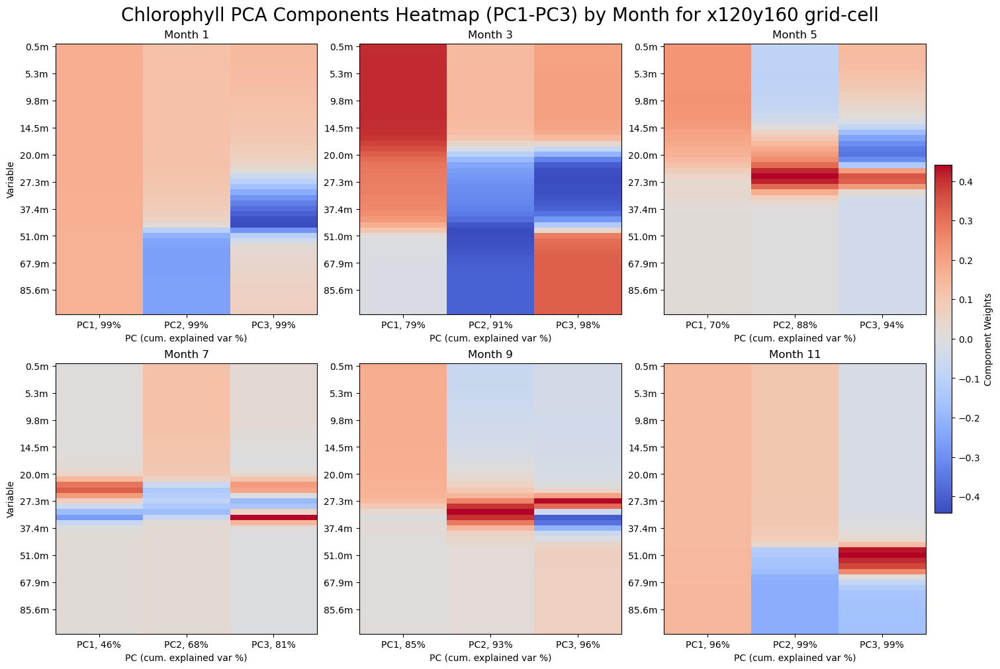

In [ ]:
# Perform the same PCA procedure, subsetting data by month first
fig, axes = plt.subplots(2, 3, figsize=(15, 10), constrained_layout=True)
for idx, m in enumerate(np.arange(1, 13)[::2]):
    x120y160_depthsCHL012_month = x120y160_depthsCHL[x120y160_depthsCHL['Time'].dt.month == m].iloc[:, 1:]

    # Perform PCA

    n = 10
    pca = PCA(n_components = n)
    fit = pca.fit(x120y160_depthsCHL012_month, # vectors to reduce in dimension
                x120y160_depths[x120y160_depths['Time'].dt.month == m]['bias012']) # output
    pca_trans = pca.fit_transform(x120y160_depthsCHL012_month)
    explained_variance = pca.explained_variance_ratio_

    # Prepare PCA components DataFrame
    pca_components_df = pd.DataFrame(
        pca.components_.T,
        columns=[f'PC{i+1}' for i in range(pca.components_.shape[0])]
    )
    
    # Select the first 5 principal components (PC1 to PC4)
    pca_values = pca_components_df.iloc[:, :3].values

    ax = axes[idx // 3, idx % 3]
    vmax = np.abs(pca_values).max()
    im = ax.imshow(pca_values, aspect='auto', cmap='coolwarm', vmin=-vmax, vmax=vmax)
    ax.set_yticks(range(len(variable_names))[::5])
    ax.set_yticklabels(variable_names[::5])
    ax.set_xticks(range(3))
    ax.set_xticklabels([f'PC{i+1}, {int(np.cumsum(explained_variance)[i]*100)}%' for i in range(3)])
    ax.set_xlabel('PC (cum. explained var %)')
    ax.set_title(f'Month {m}')
    if idx % 3 == 0:
        ax.set_ylabel('Variable')
    else:
        ax.set_yticklabels([])
        ax.set_yticklabels(variable_names[::5])

# Add a single colorbar for all subplots
fig.colorbar(im, ax=axes, orientation='vertical', fraction=0.02, pad=0.01, label='Component Weights')
plt.suptitle('Chlorophyll PCA Components Heatmap (PC1-PC3) by Month for x120y160 grid-cell', fontsize=20)
plt.show()

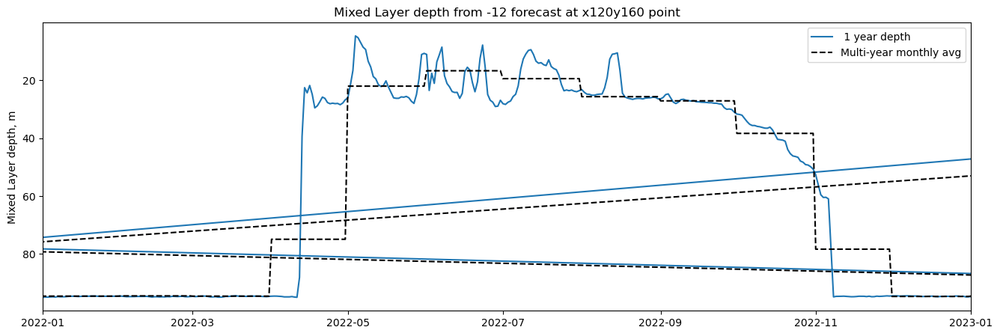

In [ ]:
# Plot of mixed layer depth
x120y160_karamld  = merged_box9_dfs(xs = [4], ys= [4],
                     forecast_days=['012', '-12'],
                     vars=['CHL', 'karamld'],
                     depths=[0], # the last depth doesn't have complete values so is excluded. 
                     loc = 'x120y160')['x4y4']
plt.figure(figsize=(16, 5))


plt.plot(x120y160_karamld['Time'], x120y160_karamld['karamld-12'], label=' 1 year depth')

# Calculate multi-year monthly average
x120y160_karamld['month'] = x120y160_karamld['Time'].dt.month
monthly_avg = x120y160_karamld.groupby('month')['karamld-12'].mean()

# Map monthly average back to each time step
monthly_avg_line = x120y160_karamld['month'].map(monthly_avg)
plt.plot(x120y160_karamld['Time'], monthly_avg_line, color='black', linestyle='--', label='Multi-year monthly avg')

plt.title('Mixed Layer depth from -12 forecast at x120y160 point')
plt.xlim(dt.date(2022, 1, 1), dt.date(2023, 1, 1))
plt.gca().invert_yaxis()  # Depth increases downward
plt.ylabel('Mixed Layer depth, m')
plt.legend()

In [ ]:
# Subsetting data by 'seasons', do PCA on selected input variables, use these as input variables in GP. 
x120y160_depths  = merged_box9_dfs(xs = [4], ys= [4],
                     forecast_days=['-12', '012'],
                     vars=['CHL', 'Visib', 'O2o', 'N3n'],
                     depths=np.arange(50), # the last depth doesn't have complete values so is excluded. 
                     loc = 'x120y160')['x4y4']

x120y160_depths['bias012-2days'] = x120y160_depths['bias012'].shift(2)
x120y160_depths['CHL-sat-2days'] = x120y160_depths['CHL-sat'].shift(2)
x120y160_depths.dropna(inplace = True)

def depths_col_list(colname):
    col_list = [f'{colname}_{depth}' for depth in np.arange(50)]
    return col_list

month_groups = {'winter': [1, 2, 3, 11, 12],
    'spring': [4, 5],
    'summer': [6, 7],
    'autumn': [8, 9, 10]}

vars_with_depths = ['Visib012', 'CHL012', 'O2o012', 'N3n012']
vars_without_depths = ['bias012', 'bias012-2days', 'CHL-sat-2days']

grouped_pc_dfs = {}

for group_name, months in month_groups.items():
    df_group = x120y160_depths[x120y160_depths['Time'].dt.month.isin(months)].copy()

    pc_dict = {'Time': df_group['Time'].values, 'month_group': [group_name]*len(df_group)}
    
    # For each variable with depths, do PCA and keep first 2 PCs
    for var in vars_with_depths:
        depth_cols = depths_col_list(var)
        if len(depth_cols) > 1:
            X_depth = df_group[depth_cols].values
            scaler = StandardScaler()
            X_depth = scaler.fit_transform(X_depth)
            pca = PCA(n_components=2)
            pcs = pca.fit_transform(X_depth)
            pc_dict[f'{var}_PC1'] = pcs[:, 0]
            pc_dict[f'{var}_PC2'] = pcs[:, 1]

        else:
            pc_dict[f'{var}_PC1'] = np.nan
            pc_dict[f'{var}_PC2'] = np.nan

    # For variables without depths, just copy them
    for var in vars_without_depths:
        if var in df_group.columns:
            pc_dict[var] = df_group[var].values
        else:
            pc_dict[var] = np.nan

    # Add target columns if needed (e.g., CHL-sat, CHL012_0, etc.)
    for col in ['CHL-sat', 'CHL012_0']:
        if col in df_group.columns:
            pc_dict[col] = df_group[col].values

    grouped_pc_dfs[group_name] = pd.DataFrame(pc_dict)

In [ ]:
for season in month_groups.keys():
    print(f'Season: {season}')
    print(grouped_pc_dfs[season].shape)

Season: winter
(448, 15)
Season: spring
(164, 15)
Season: summer
(180, 15)
Season: autumn
(276, 15)


### Fit GP with PCs as inputs for each 'season'

Season: winter
Training dataset dimensions: (268, 10)
Testing set size: 180
Log marginal likelihood: 64.43097039689559


name,class,transform,prior,trainable,shape,dtype,value
GPR.mean_function.A,Parameter,Identity,,False,"(10, 1)",float64,[[0.0957072...
GPR.mean_function.b,Parameter,Identity,,False,"(1,)",float64,[0.09562092]
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,0.09895124120255573
GPR.kernel.lengthscales,Parameter,Softplus,,True,"(10,)",float64,"[0.54357001, 10.55309, 6.0075..."
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,0.006852918090797805


% Days where bias-adjustment is more accurate than original forecast: 55.559999999999995%
The original forecast:
MAE: 0.247, RMSE: 0.355, RMedianSE: 0.167,  R-squared: -0.325
                    True Bloom  True No Bloom
                                             
Predicted Bloom              0              3
Predicted No Bloom           1            176
Precision: 0.0
Recall: 0.0
The GP forecast:
MAE: 0.235, RMSE: 0.366, RMedianSE: 0.151, R-squared: -0.407
                    True Bloom  True No Bloom
                                             
Predicted Bloom              0              0
Predicted No Bloom           1            179
Precision: nan
Recall: 0.0


C:\Users\gg461\AppData\Local\Temp\ipykernel_7080\3041856427.py:83: RuntimeWarning: invalid value encountered in scalar divide
  print(f'Precision: {np.round(TP/(TP+FP), 2)}')


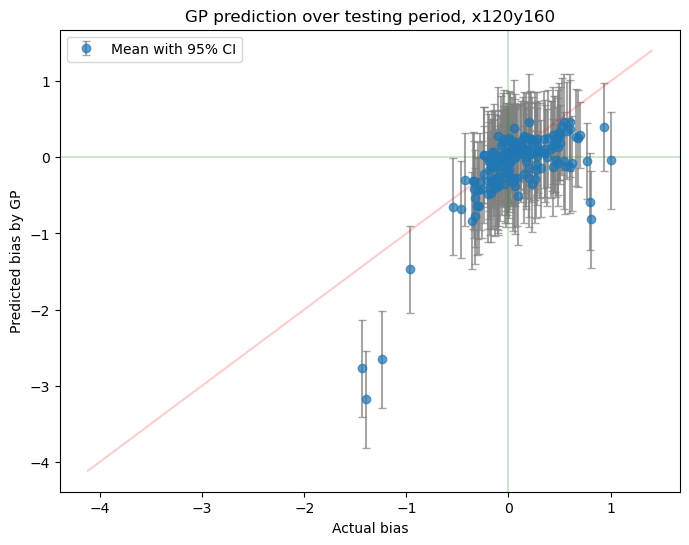

Season: spring
Training dataset dimensions: (98, 10)
Testing set size: 66
Log marginal likelihood: -70.62436275239703


name,class,transform,prior,trainable,shape,dtype,value
GPR.mean_function.A,Parameter,Identity,,False,"(10, 1)",float64,[[0.09587469...
GPR.mean_function.b,Parameter,Identity,,False,"(1,)",float64,[-0.9905575]
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,1.14068
GPR.kernel.lengthscales,Parameter,Softplus,,True,"(10,)",float64,"[1.45612000e+00, 4.66043195e+03, 2.29737000e+00..."
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,0.004138480755617026


% Days where bias-adjustment is more accurate than original forecast: 57.58%
The original forecast:
MAE: 0.962, RMSE: 1.392, RMedianSE: 0.667,  R-squared: -2.936
                    True Bloom  True No Bloom
                                             
Predicted Bloom              2             14
Predicted No Bloom           2             48
Precision: 0.12
Recall: 0.5
The GP forecast:
MAE: 0.792, RMSE: 1.136, RMedianSE: 0.487, R-squared: -1.621
                    True Bloom  True No Bloom
                                             
Predicted Bloom              1              5
Predicted No Bloom           3             57
Precision: 0.17
Recall: 0.25


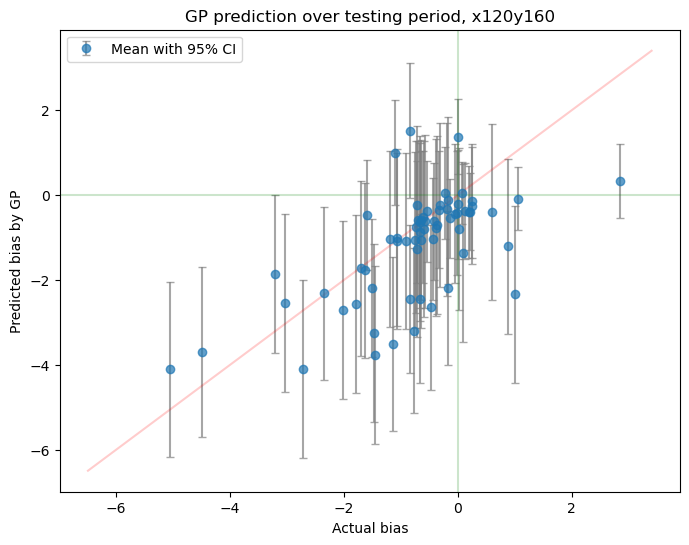

Season: summer
Training dataset dimensions: (108, 10)
Testing set size: 72
Log marginal likelihood: -6.463844913723392


name,class,transform,prior,trainable,shape,dtype,value
GPR.mean_function.A,Parameter,Identity,,False,"(10, 1)",float64,[[-0.09839078...
GPR.mean_function.b,Parameter,Identity,,False,"(1,)",float64,[0.32386045]
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,0.5476084303032556
GPR.kernel.lengthscales,Parameter,Softplus,,True,"(10,)",float64,"[1.48198532e+04, 1.06625000e+00, 2.24078000e+00..."
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,0.007992875038956253


% Days where bias-adjustment is more accurate than original forecast: 33.33%
The original forecast:
MAE: 0.514, RMSE: 0.793, RMedianSE: 0.239,  R-squared: -0.302
                    True Bloom  True No Bloom
                                             
Predicted Bloom              0              0
Predicted No Bloom           9             63
Precision: nan
Recall: 0.0
The GP forecast:
MAE: 0.603, RMSE: 0.724, RMedianSE: 0.488, R-squared: -0.085
                    True Bloom  True No Bloom
                                             
Predicted Bloom              3              7
Predicted No Bloom           6             56
Precision: 0.3
Recall: 0.33


C:\Users\gg461\AppData\Local\Temp\ipykernel_7080\3041856427.py:48: RuntimeWarning: invalid value encountered in scalar divide
  print(f'Precision: {np.round(TP/(TP+FP), 2)}')


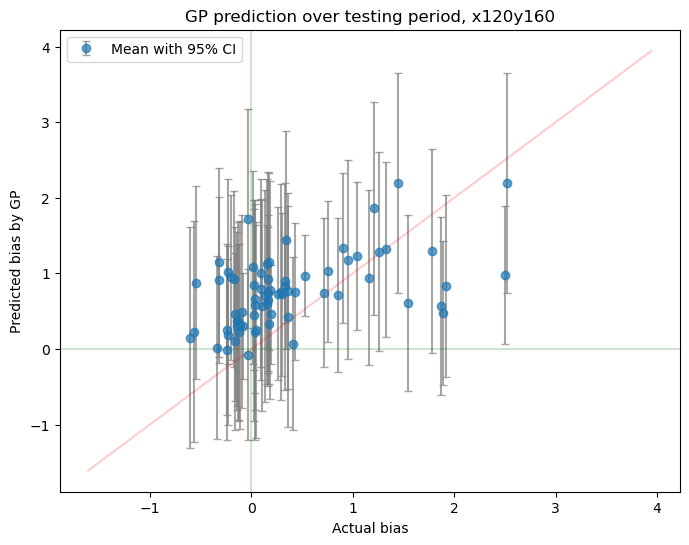

Season: autumn
Training dataset dimensions: (165, 10)
Testing set size: 111
Log marginal likelihood: -48.765902113047986


name,class,transform,prior,trainable,shape,dtype,value
GPR.mean_function.A,Parameter,Identity,,False,"(10, 1)",float64,[[-0.17414017...
GPR.mean_function.b,Parameter,Identity,,False,"(1,)",float64,[-0.20025817]
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,0.20454018318414155
GPR.kernel.lengthscales,Parameter,Softplus,,True,"(10,)",float64,"[1.83456115e+03, 1.09470486e+04, 1.00386429e+04..."
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,0.028403542648215145


% Days where bias-adjustment is more accurate than original forecast: 41.44%
The original forecast:
MAE: 0.363, RMSE: 0.532, RMedianSE: 0.234,  R-squared: -1.923
                    True Bloom  True No Bloom
                                             
Predicted Bloom              0              5
Predicted No Bloom           0            106
Precision: 0.0
Recall: nan
The GP forecast:
MAE: 0.680, RMSE: 0.880, RMedianSE: 0.606, R-squared: -6.979
                    True Bloom  True No Bloom
                                             
Predicted Bloom              0              0
Predicted No Bloom           0            111
Precision: nan
Recall: nan


C:\Users\gg461\AppData\Local\Temp\ipykernel_7080\3041856427.py:49: RuntimeWarning: invalid value encountered in scalar divide
  print(f'Recall: {np.round(TP/(TP+FN), 2)}')
C:\Users\gg461\AppData\Local\Temp\ipykernel_7080\3041856427.py:83: RuntimeWarning: invalid value encountered in scalar divide
  print(f'Precision: {np.round(TP/(TP+FP), 2)}')
C:\Users\gg461\AppData\Local\Temp\ipykernel_7080\3041856427.py:84: RuntimeWarning: invalid value encountered in scalar divide
  print(f'Recall: {np.round(TP/(TP+FN), 2)}')


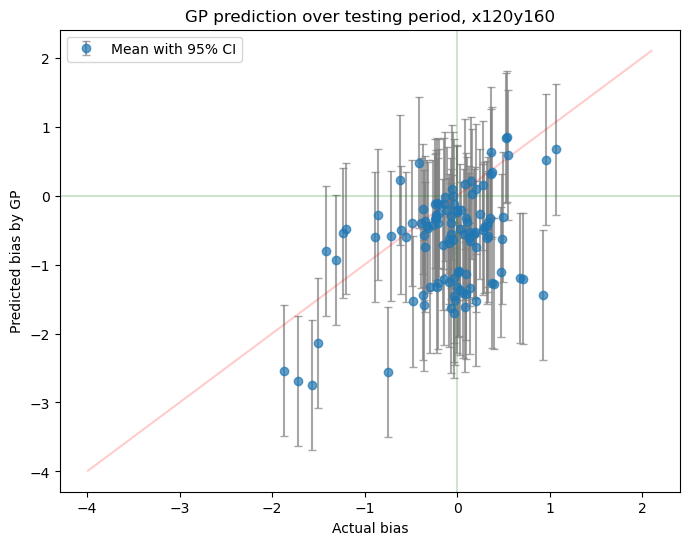

In [ ]:
# Repeat cell to fit GP for single grid-cell with ARD
for season in month_groups.keys():
    print(f'Season: {season}')
    PC_df = grouped_pc_dfs[season]
    # PC_df.reset_index(inplace = True)
    input_df = PC_df[['Visib012_PC1', 'Visib012_PC2', 'CHL012_PC1',
        'CHL012_PC2', 'O2o012_PC1', 'O2o012_PC2', 'N3n012_PC1', 'N3n012_PC2',
        'bias012-2days', 'CHL-sat-2days']]
    scaler = StandardScaler()
    X = np.asarray(input_df,
                dtype = np.float64)

    X = scaler.fit_transform(X)

    y = pd.DataFrame( PC_df['bias012'] )
    y = (np.asarray(y, dtype=np.float64))

    # Set train/test with random subset of datset, 60% train 40% test
    split_idx = int(0.6 * len(PC_df))
    train_indices = np.arange(0, split_idx, 1)
    test_indices = [i for i in np.arange(len(PC_df)) if i not in train_indices]

    X_train, X_test = X[train_indices, ], X[test_indices, ]
    y_train, y_test = y[train_indices], y[test_indices]
    print(f'Training dataset dimensions: {X_train.shape}')
    print(f'Testing set size: {y_test.shape[0]}')

    # Adding linear regression mean function
    reg_indices = np.random.choice(train_indices, size=int(split_idx*0.5), replace=False).tolist() 
    reg = LinearRegression().fit(X[reg_indices, ], y[reg_indices ])
    A_array = reg.coef_.T

    model_x120y160C = gpflow.models.GPR(
        (X_train, y_train),
        kernel = gpflow.kernels.SquaredExponential(lengthscales= np.repeat(0.5, X.shape[1])),
        noise_variance=0.04,
        mean_function = gpflow.functions.Linear(A = A_array,
                                b = reg.intercept_)
        ) 
    # Fix the linear regression coefficients for the mean function
    gpflow.set_trainable(model_x120y160C.mean_function.A, False) 
    gpflow.set_trainable(model_x120y160C.mean_function.b, False)

    # Use the default BFGS optimizer
    opt = gpflow.optimizers.Scipy()
    opt.minimize(model_x120y160C.training_loss, # loss function is pre-defined by GPflow's own models
                model_x120y160C.trainable_variables)
    # Display estimated parameters    

    print(f"Log marginal likelihood: {model_x120y160C.maximum_log_likelihood_objective().numpy()}")
    print_summary(model_x120y160C) 
    CHL_sat = PC_df['CHL-sat'].iloc[test_indices]
    y_m, y_var = model_x120y160C.predict_y(X_test)
    y_CI = norm.ppf(0.975)*np.sqrt(y_var)

    validation_metrics(CHL_sat, bias_true=y_test.ravel(),  bias_GP_pred= np.array(y_m).ravel(), thresh = 2, dchl_conf = False)
    scatter_preds(y_test.ravel(), np.array(y_m).ravel(), np.array(y_CI).ravel(), loc = 'x120y160')

### Compare to using only surface variables, GP applied to individual grid cell for each season 

In [264]:
# Compare to using only surface variables for original single grid-cell GP on each 'season'
for group_name, months in month_groups.items():
    print(f'Season: {group_name}')
    df_group = x120y160[x120y160['Time'].dt.month.isin(months)].copy()
    input_df = df_group[['bias012-2days', 'Visib012_0', 'CHL012_0', 'O2o012_0','CHL-sat-2days', 'N3n012_0']]
            
    scaler = StandardScaler()
    X = np.asarray(input_df,
                dtype = np.float64)

    X = scaler.fit_transform(X)

    y = pd.DataFrame( df_group['bias012'] )
    y = (np.asarray(y, dtype=np.float64))

    # Set train/test with random subset of datset, 60% train 40% test
    split_idx = int(0.6 * len(input_df))
    train_indices = np.arange(0, split_idx, 1)
    # Random train/test 
    # train_indices = np.random.choice(len(input_df), size=split_idx, replace=False)
    test_indices = [i for i in np.arange(len(input_df)) if i not in train_indices]

    X_train, X_test = X[train_indices, ], X[test_indices, ]
    y_train, y_test = y[train_indices], y[test_indices]
    print(f'Training dataset dimensions: {X_train.shape}')
    print(f'Testing set size: {y_test.shape[0]}')

    # Adding linear regression mean function
    reg_indices = np.random.choice(train_indices, size=int(split_idx*0.5), replace=False).tolist() 
    reg = LinearRegression().fit(X[reg_indices, ], y[reg_indices ])
    A_array = reg.coef_.T

    model_x120y160D = gpflow.models.GPR(
        (X_train, y_train),
        kernel = gpflow.kernels.SquaredExponential(lengthscales= np.repeat(0.5, X.shape[1])),
        noise_variance=0.04,
        mean_function = gpflow.functions.Linear(A = A_array,
                                b = reg.intercept_)
        ) 
    # Fix the linear regression coefficients for the mean function
    gpflow.set_trainable(model_x120y160D.mean_function.A, False) 
    gpflow.set_trainable(model_x120y160D.mean_function.b, False)

    # Use the default BFGS optimizer
    opt = gpflow.optimizers.Scipy()
    opt.minimize(model_x120y160D.training_loss, # loss function is pre-defined by GPflow's own models
                model_x120y160D.trainable_variables)
    # Display estimated parameters    

    print(f"Log marginal likelihood: {model_x120y160D.maximum_log_likelihood_objective().numpy()}")
    print_summary(model_x120y160D) 
    
    CHL_sat = df_group['CHL-sat'].iloc[test_indices]
    y_m, y_var = model_x120y160D.predict_y(X_test)
    y_CI = norm.ppf(0.975)*np.sqrt(y_var)

    validation_metrics(CHL_sat, bias_true=y_test.ravel(),  
                       bias_GP_pred= np.array(y_m).ravel(), thresh = 2, dchl_conf = False)
    scatter_preds(y_test.ravel(), np.array(y_m).ravel(), 
                  np.array(y_CI).ravel(), loc = 'x120y160')

NameError: name 'month_groups' is not defined

## Section 4.5: current velocity information 

This was done for x116y156 region only.

In [ ]:
# Import east and north velocities
east_12 = xr.open_dataset('velocity_data/prodm_op_am-dm.gridU_x116-y156-box9_2021-2024.-12.nc')
north_12 = xr.open_dataset('velocity_data/prodm_op_am-dm.gridV_x116-y156-box9_2021-2024.-12.nc')

# Create dataframe, using only values for central x120y160 grid-cell
x120y160_vel = pd.DataFrame({'Time': east_12['time_counter'].values,
                             'east_vel': east_12.isel(depthu = 0, 
                                                       x=4, y =4)['vozocrtx']}).merge(
                                pd.DataFrame({'Time': north_12['time_counter'].values.ravel(),
                                                'north_vel': north_12.isel(depthv = 0, x = 4, y = 4)['vomecrty']}), on = 'Time', how = 'right')
x120y160_vel.Time = x120y160_vel['Time'].dt.normalize()  
. 
# Calculate flow magnitude (speed) and direction (angle in degrees) 
x120y160_vel['speed'] = np.sqrt(x120y160_vel['east_vel']**2 + x120y160_vel['north_vel']**2)
x120y160_vel['direction'] =( 90 - np.degrees(np.arctan2(x120y160_vel['north_vel'], x120y160_vel['east_vel']))) % 360
for var in ['speed', 'direction']:
    x120y160_vel[f'{var}-2days'] = x120y160_vel[var].shift(2)
x120y160_vel.dropna(inplace = True, axis = 0)

# Merge with other x120y160 df to add bias012 column
x120y160_vel = x120y160.merge(x120y160_vel, on= 'Time', how = 'left')

In [14]:
# What was the flow speed?
display(x120y160_vel.speed.describe()) # around 0.06 m/s
print(f'avg daily water movement: {np.floor(np.mean(x120y160_vel.speed)*60*60*24)}m') 
# which is over half a grid cell, so would expect water to move into adjacent grid cell every 2/3 days

count    1020.000000
mean        0.062541
std         0.026765
min         0.004621
25%         0.043997
50%         0.062117
75%         0.080049
max         0.152197
Name: speed, dtype: float64

avg daily water movement: 5403.0m


In [55]:
cols = ['Time', 'bias012', 'east_vel', 'north_vel', 'speed', 'direction', 'speed-2days',
       'direction-2days'] #+ [col for col in x120y160_vel.columns if col not in ['Time', 'bias012', 'east_vel', 'north_vel', 'speed', 'direction', 'speed-2days',
    #    'direction-2days']]
x120y160_vel = x120y160_vel[cols]

for month in np.arange(1, 12)[::3]:
    corr_df = x120y160_vel[cols]
    print(f'Month {month}')
    corr_df = corr_df[(corr_df['Time']).dt.month == month].drop(columns = 
                                                                        ['Time'], axis = 1)
    corr = corr_df.corr()
    display(corr.iloc[:, 0:1].style.background_gradient(cmap='coolwarm'))

Month 1


,bias012
bias012,1.000000
east_vel,0.180705
north_vel,0.094422
speed,0.187978
direction,-0.050815
speed-2days,0.035341
direction-2days,-0.214407


Month 4


,bias012
bias012,1.000000
east_vel,0.261366
north_vel,-0.136622
speed,0.099691
direction,-0.320044
speed-2days,-0.020691
direction-2days,-0.413245


Month 7


,bias012
bias012,1.000000
east_vel,-0.079885
north_vel,0.211152
speed,-0.088976
direction,-0.015948
speed-2days,-0.119221
direction-2days,0.036662


Month 10


,bias012
bias012,1.000000
east_vel,0.113522
north_vel,0.218487
speed,0.123932
direction,0.023578
speed-2days,-0.017811
direction-2days,0.086612


In [56]:
x120y160_vel['bias012-2days'] = x120y160_vel.bias012.shift(2)
x120y160_vel['bias012-3days'] = x120y160_vel.bias012.shift(3)
for loc in ['x6y6', 'x7y7', 'x6y2', 'x7y1', 'x2y2', 'x1y1', 'x2y6', 'x1y7']:
    # Create shifted series with Time as index
    shifted_data = x116y156_dfs[loc]['bias012'].shift(2)
    shifted_df = pd.DataFrame({
        'Time': x116y156_dfs[loc]['Time'],
        f'bias012-2days_{loc}': shifted_data,
        f'bias012-3days_{loc}':x116y156_dfs[loc]['bias012'].shift(3)
    })
    
    # Merge on Time column
    x120y160_vel = x120y160_vel.merge(
        shifted_df, 
        on='Time', 
        how='left'
    )

In [57]:
# Create subsets of days when the flow 2 days ago was coming from each direction. 
SW = x120y160_vel[(x120y160_vel['direction-2days'] > 0) & (x120y160_vel['direction-2days'] < 90)].copy() # flow going to 0-90 degrees, ie.towards NE,from the SW
NW = x120y160_vel[(x120y160_vel['direction-2days'] > 90) & (x120y160_vel['direction-2days'] < 180)].copy()
NE = x120y160_vel[(x120y160_vel['direction-2days'] > 180) & (x120y160_vel['direction-2days'] < 270)].copy()
SE = x120y160_vel[(x120y160_vel['direction-2days'] > 270) & (x120y160_vel['direction-2days'] < 360)].copy()

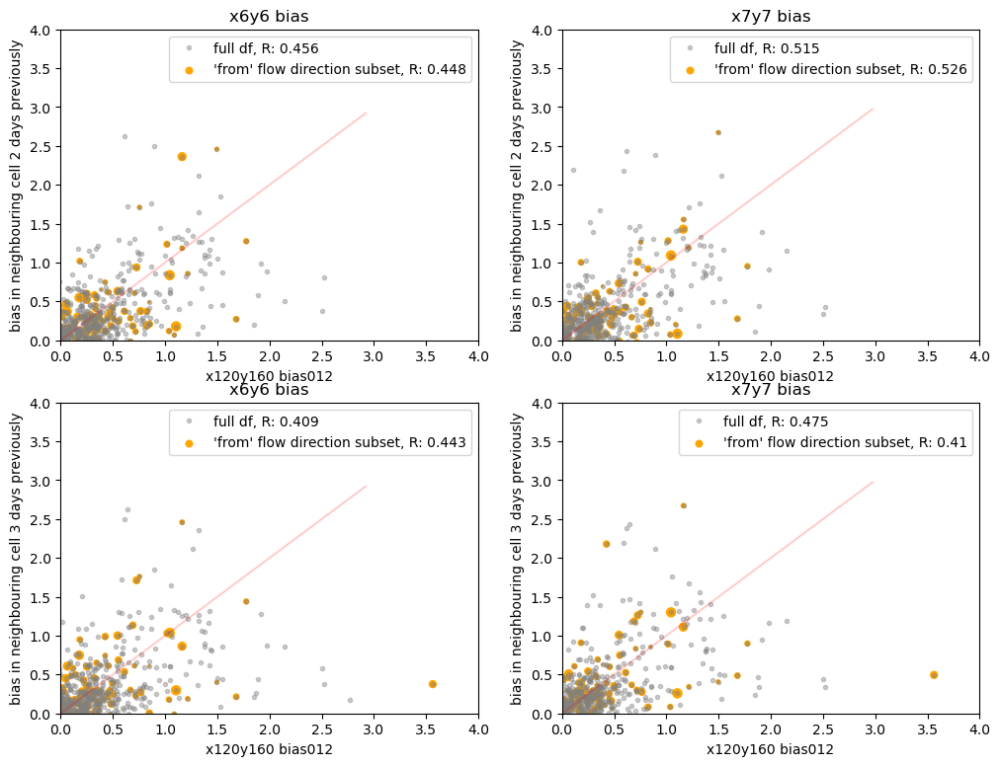

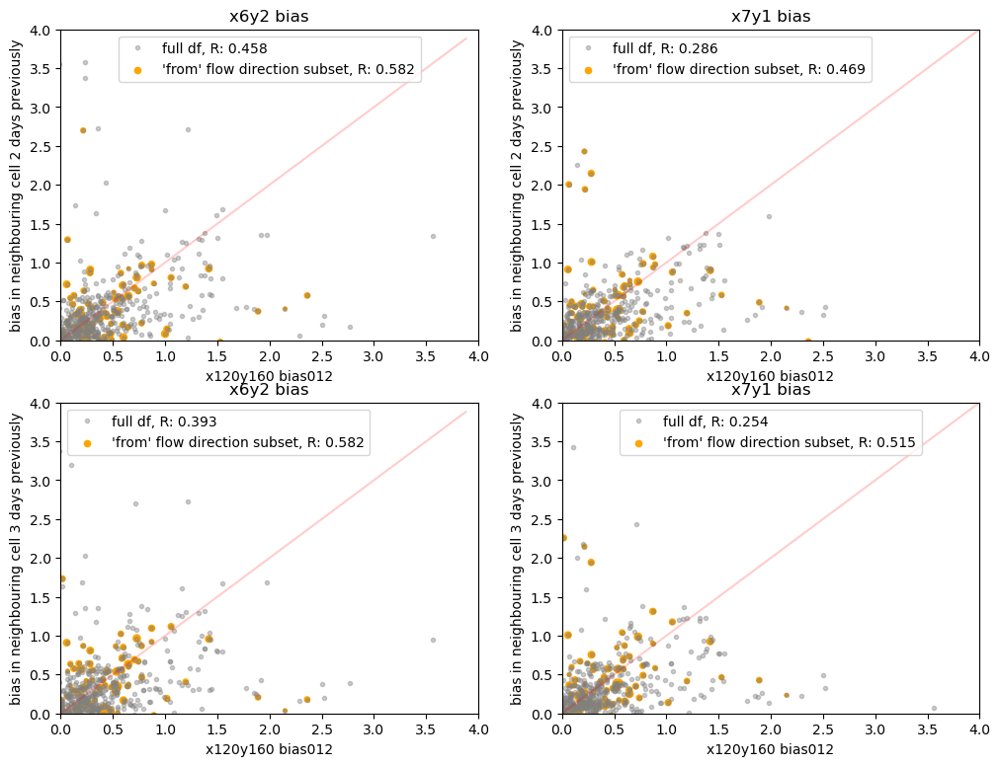

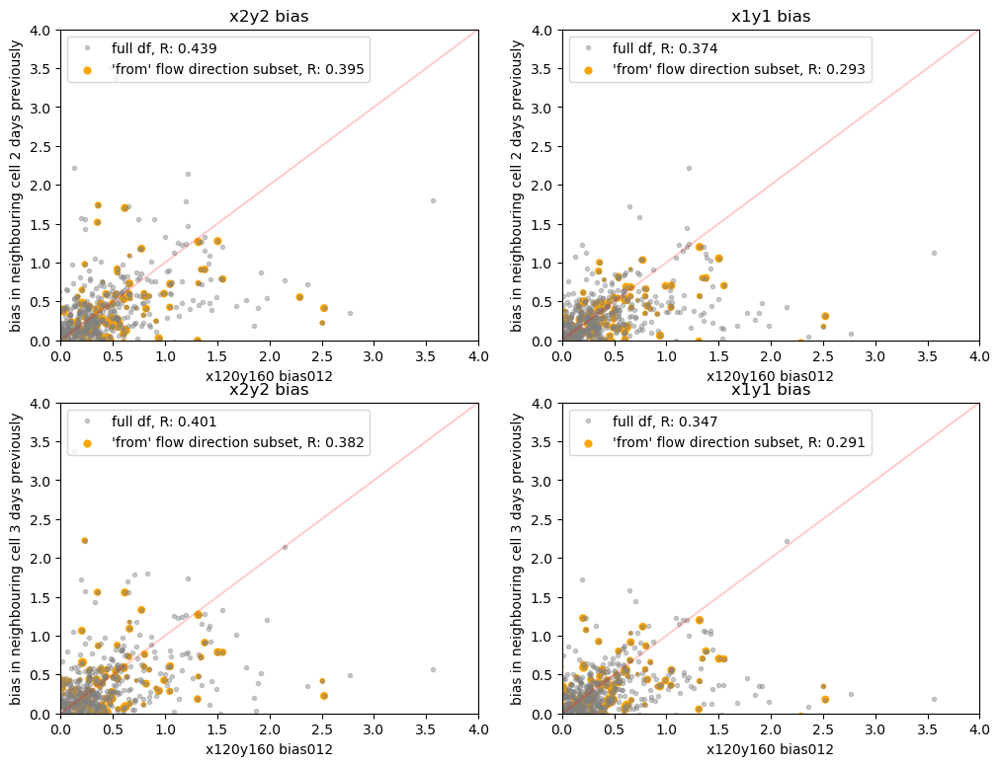

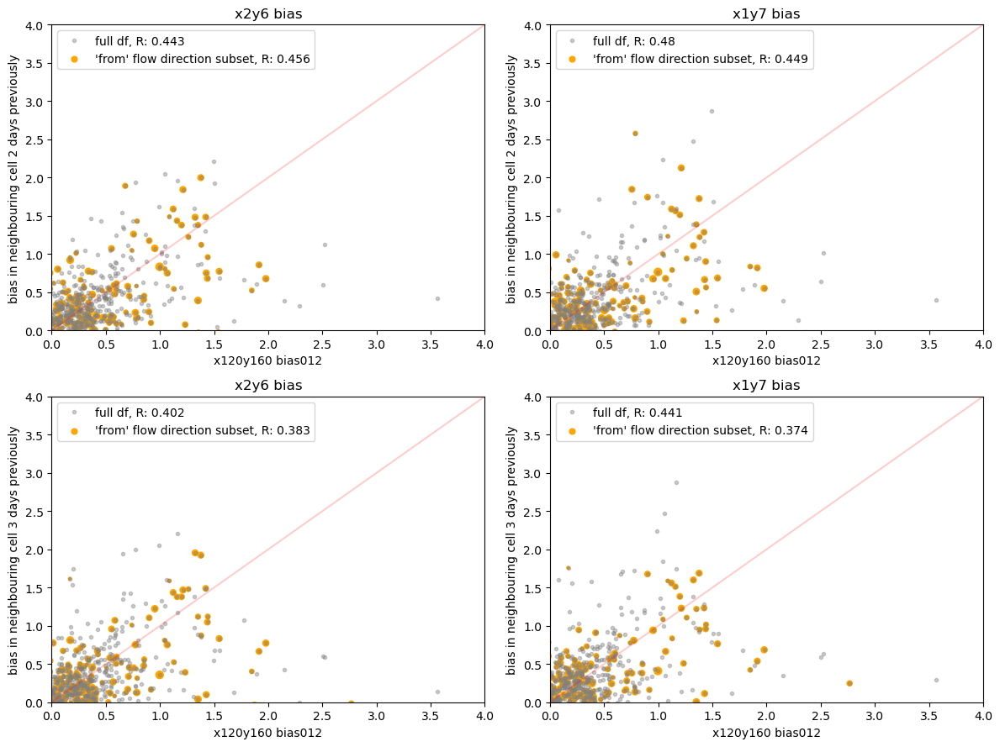

In [63]:

# Plot the bias at neighbouring cells -2/3 days ago against bias at target cell (x120y160). 
# Plot the full dataset for that neighbouring cell and the subset of dates which we think will be more informative (as that's when the flow was originating from there) 
for df, locs in [(NE, ['x6y6', 'x7y7']), (SE, ['x6y2', 'x7y1']), 
                 (SW, ['x2y2', 'x1y1']), (NW, ['x2y6', 'x1y7'])]:
    fig, ax = plt.subplots(2, 2, figsize=(12, 9))
    for i, loc in enumerate(locs):
        
        for j in [0,1]:
            corr_coeff_same = np.corrcoef(x120y160_vel['bias012'], x120y160_vel[f'bias012-{2+j}days_{loc}'])[0,1]
            ax[j,i].plot(x120y160_vel['bias012'], x120y160_vel[f'bias012-{2+j}days_{loc}'], '.', alpha=0.4, 
                         label=f'full df, R: {np.round(corr_coeff_same, 3)}', color = 'grey')
            range = np.linspace(np.min(x120y160_vel[f'bias012-{2+j}days_{loc}']) - 0.3, 
                                np.max(x120y160_vel[f'bias012-{2+j}days_{loc}'])+0.3)
            ax[j,i].plot(range, range, alpha= 0.2, color = 'red')
            sizes = 300 * df['speed']
            corr_coeff = np.corrcoef(df['bias012'], df[f'bias012-{2+j}days_{loc}'])[0,1]
            ax[j,i].scatter(df['bias012'], df[f'bias012-{2+j}days_{loc}'], s=sizes, 
                            label=f'\'from\' flow direction subset, R: {np.round(corr_coeff, 3)}', color = 'orange')
            ax[j,i].set_xlabel('x120y160 bias012')
            ax[j,i].set_ylabel(f'bias in neighbouring cell {2+j} days previously')
            ax[j,i].set_xlim(0,4)
            ax[j,i].set_ylim(0,4)
            ax[j,i].set_title(f'{loc} bias')
            ax[j,i].legend()

plt.tight_layout()
# takes~ 14 secs

Similar results for 1day lag of bias from upstream cells

# Having bias summary spatial statistic as an input variable 

In [68]:
for locs in [x201y175_box9, x116y156_box9]:
    for loc, df in locs.items():
        # print(loc)
        for var in ['bias012', 'Visib012_0', 'CHL012_0', 'O2o012_0','CHL-sat', 'N3n012_0']:
            df[f'{var}-1days'] = df[var].shift(1)
            df[f'{var}-2days'] = df[var].shift(2)
            df[f'{var}-3days'] = df[var].shift(3)
            df[f'{var}-4days'] = df[var].shift(4)
    

x116y156_box9_stacked = pd.concat(x116y156_box9.values(), ignore_index = True)

x201y175_box9_stacked = pd.concat(x201y175_box9.values(), ignore_index = True)

In [69]:
# Get all non-time, non-location columns
value_cols = [col for col in x116y156_box9_stacked.columns 
                if col not in ['Time', 'Point', 'longitude', 'latitude']]
agg_functions = ['mean', 'median', 'var', 'min', 'max']
    
# Create the aggregation dictionary properly
agg_dict = {}
for col in value_cols:
    for func in agg_functions:
        agg_dict[f'{col}_{func}'] = pd.NamedAgg(column=col, aggfunc=func)

# Calculate basic statistics
x116y156_box9_spatial_stats = x116y156_box9_stacked.groupby('Time').agg(**agg_dict)

# Add bias threshold count 
bias_counts = (x116y156_box9_stacked['bias012'] > 1.4).groupby(x116y156_box9_stacked['Time']).sum()
x116y156_box9_spatial_stats['bias_above_threshold'] = bias_counts

x116y156_box9_spatial_stats.reset_index(inplace=True)


# Calculate basic statistics
x201y175_box9_spatial_stats = x201y175_box9_stacked.groupby('Time').agg(**agg_dict)

# Add bias threshold count 
bias_counts = (x201y175_box9_stacked['bias012'] > 1.4).groupby(x201y175_box9_stacked['Time']).sum()
x201y175_box9_spatial_stats['bias_above_threshold'] = bias_counts

x201y175_box9_spatial_stats.reset_index(inplace=True)

In [83]:
df = pd.DataFrame(x120y160[['Time', 'bias012']])
df['bias012+2days_x120y160'] = df.bias012.shift(-2)

x116y156_box9_spatial_stats = x116y156_box9_spatial_stats.merge(
    df[['Time', 'bias012+2days_x120y160']],
    on = 'Time', how = 'left')


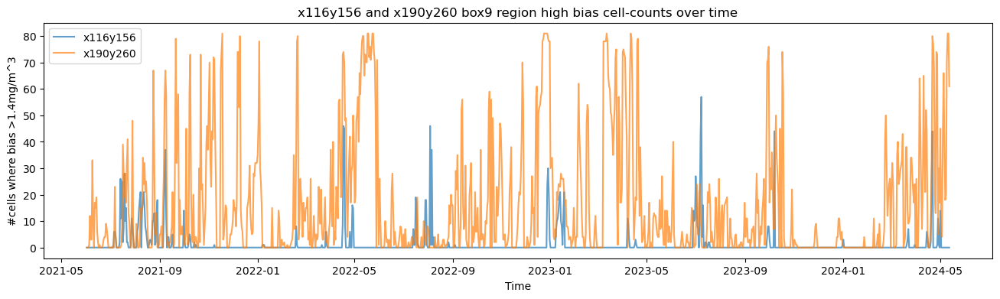

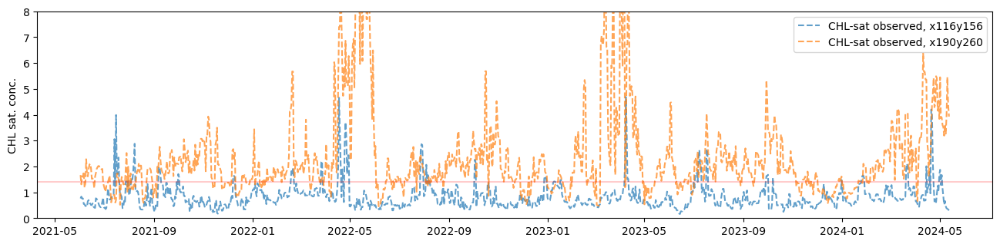

In [70]:

fig, ax1 = plt.subplots(figsize= (16, 4))
ax1.set_title('x116y156 and x190y260 box9 region high bias cell-counts over time')
ax1.set_xlabel('Time')
ax1.set_ylabel('#cells where bias >1.4mg/m^3')
ax1.plot(x116y156_box9_spatial_stats.Time, x116y156_box9_spatial_stats['bias_above_threshold'], '-', alpha = 0.7, label = 'x116y156')

ax1.plot(x201y175_box9_spatial_stats.Time, x201y175_box9_spatial_stats['bias_above_threshold'], '-', alpha = 0.7, label = 'x190y260') 
ax1.legend()
fig, ax2 = plt.subplots(figsize = (16, 3.5))
# Plot the CHL-sat for x116y156 also 
# ax2 = ax1.twinx()
ax2.plot(x116y156_box9['x4y4'].Time, x116y156_box9['x4y4']['CHL-sat'], '--', alpha = 0.7, label = 'CHL-sat observed, x116y156')
ax2.plot(x201y175_box9['x4y4'].Time, x201y175_box9['x4y4']['CHL-sat'], '--', alpha = 0.7, label = 'CHL-sat observed, x190y260')
ax2.set_ylabel('CHL sat. conc.')
ax2.set_ylim(0, 8)
ax2.legend()
ax2.axhline(1.4, alpha = 0.2 , color = 'red')


Text(0.5, 1.0, 'When there is high bias (>1.4) how many gridcells does it affect on the same day')

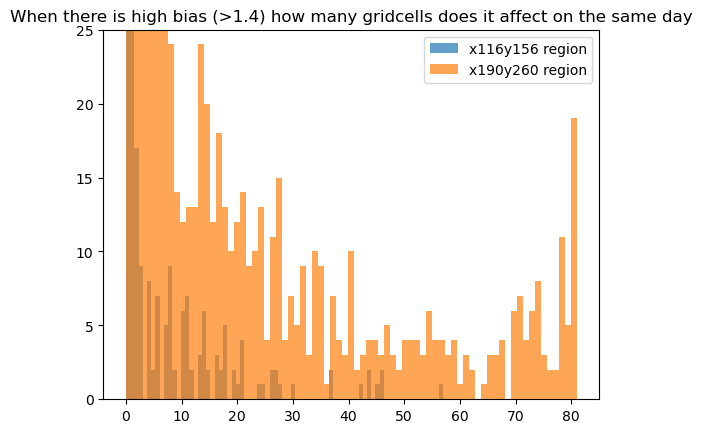

In [71]:
plt.figure()
plt.hist( x116y156_box9_spatial_stats['bias_above_threshold'], bins = 75, label = 'x116y156 region',alpha = 0.7)
plt.hist(x201y175_box9_spatial_stats['bias_above_threshold'], bins = 75,label = 'x190y260 region',alpha = 0.7 )
plt.ylim(0,25) # most of the time the high bias affects 1-4 grid cells, very rarely does it affect a larger region at once
# plt.xlim(1, 80)
plt.legend()
plt.title('When there is high bias (>1.4) how many gridcells does it affect on the same day')

## Correlations with spatial summary statistics 

In [87]:
scaler = StandardScaler()
spat_summ_sub_sc = scaler.fit_transform(x116y156_box9_spatial_stats.drop(['Time'],axis =1, inplace = False))
spat_summ_sub = pd.DataFrame(spat_summ_sub_sc, columns = x116y156_box9_spatial_stats.columns[1:])
# spat_summ_sub.corr().iloc[:, 37:].style.background_gradient(cmap='coolwarm')
spat_summ_sub_corr = spat_summ_sub[spat_summ_sub['bias012+2days_x120y160'] > 1.5]
spat_summ_sub_corr.corr().loc[:, ['bias012+2days_x120y160', 'bias012_mean', 'bias012_var', 'bias012_max','bias_above_threshold']].dropna(axis = 0, inplace = False).style.background_gradient(cmap='coolwarm')

,bias012+2days_x120y160,bias012_mean,bias012_var,bias012_max,bias_above_threshold
CHL012_0_mean,0.563534,-0.487964,0.254442,0.205407,-0.118588
CHL012_0_median,0.551344,-0.513793,0.251296,0.196985,-0.162980
CHL012_0_var,0.695140,-0.132587,0.555242,0.515747,0.052565
CHL012_0_min,0.391858,-0.553252,0.038912,-0.003108,-0.176669
CHL012_0_max,0.585652,-0.426986,0.266232,0.234925,-0.046295
N3n012_0_mean,-0.115446,0.029941,-0.224586,-0.262675,-0.129762
N3n012_0_median,-0.092152,0.003546,-0.204810,-0.244380,-0.144154
N3n012_0_var,0.073880,-0.078764,-0.159785,-0.168987,0.134249
N3n012_0_min,-0.144521,0.089565,-0.183679,-0.216692,-0.137741
N3n012_0_max,-0.152358,0.083110,-0.261867,-0.294139,-0.060694


Wanted the interpretation of this - it's a long big table. 
Conclusion: 

* I have this for x116y156 and x190y260 regions. Can describe common features but put all the figures adn results in appendix/code section. 

# Section 5.3 and 6: Spatial GP and Results

In [384]:
# Create function to repeat dataframe and modelling and results and validation for each location grids!
# L4 location is missing some cells, they are not in the merged_df dictionary.. 

def fit_spatialGP(location = 'x116y156', df_full=None):
    if df_full==None:
        df_dict = merged_box9_dfs(xs =np.arange(9), ys= np.arange(9),
                         forecast_days=[ '012'],
                         vars=['CHL', 'Visib', 'O2o', 'N3n'],
                         depths=[0], 
                         loc = location)
        for loc, df in df_dict.items():
            df['bias012-2days'] = df['bias012'].shift(2)
            df['CHL-sat-2days'] = df['CHL-sat'].shift(2)
        df_full = pd.concat(df_dict,axis=0, ignore_index=True)
        df_full.dropna(inplace = True)
        df_full.reset_index(inplace = True)

    input_df = df_full[['Visib012_0', 'CHL012_0', 'O2o012_0','CHL-sat-2days', 'N3n012_0', 'bias012-2days','longitude', 'latitude']]
    
    train_test_split = 0.6
    X = np.asarray(input_df, dtype=np.float64)
    # Do variable scaling 
    scaler = StandardScaler()
    X = scaler.fit_transform(X) 
    y = pd.DataFrame(df_full['bias012'])
    y = (np.asarray(y, dtype=np.float64))

    # Split train/test by date to have consecutive days for validation, but could do 60% randomly placed windows of consecutive days
    train_indices = df_full.index[df_full.Time<dt.datetime(2023, 3,9)] 
    test_indices = [i for i in np.arange(len(df_full)) if i not in train_indices]

    # Split the data into training and testing sets
    X_train, X_test = X[train_indices, ], X[test_indices, ]
    y_train, y_test = y[train_indices], y[test_indices]
    print(f'Training dataset dimensions: {X_train.shape}')
    print(f'Testing set size: {y_test.shape[0]}')

    # Set seed for random inducing points
    rng = np.random.default_rng(1234)
    # Number of inducing points, set using K-means centroids for each columns in data
    n_inducing  = 400 
    inducing_variable, _ = kmeans(X, n_inducing) # try to find the k clusters in data

    # Estimate the linear regression parameters on a subset of training data to avoid overfitting - like what they do in metalearning
    reg_indices = np.random.choice(train_indices, size=300, replace=False).tolist() 
    reg = LinearRegression().fit(X[reg_indices, ][:,:6], y[reg_indices ]) # don't include lon/lat in linear regression coeffs
    A_array = np.vstack([reg.coef_.T, [0], [0]]) # Set linear regression coefficients to 0 for longitude and latitude

    
    spatial_mod = gpflow.models.SGPR(
        (X_train, y_train),
        kernel = gpflow.kernels.SquaredExponential(active_dims = [6,7])+
        gpflow.kernels.SquaredExponential(active_dims = [5, 6,7])+
        gpflow.kernels.SquaredExponential(active_dims = [0,1,2,3,4, 5], lengthscales = np.repeat(0.5, 6)),
        noise_variance=(0.2**2),  
        mean_function = gpflow.functions.Linear(A = A_array,
                                                b = reg.intercept_),
        inducing_variable = inducing_variable
        ) 
    
    # Inducing variables and mean funciton parameters are fixed
    gpflow.set_trainable(spatial_mod.inducing_variable.Z, False)
    gpflow.set_trainable(spatial_mod.mean_function.A, False) 
    gpflow.set_trainable(spatial_mod.mean_function.b, False)

    # Set priors for hyper-parameters
    
    spatial_mod.kernel.kernels[0].variance.prior = tfd.Uniform(f64(0.00001), f64(2))
    spatial_mod.kernel.kernels[0].lengthscales.prior = tfd.Uniform(f64(0.0), f64(15))

    spatial_mod.kernel.kernels[1].variance.prior = tfd.Uniform(f64(0.00001), f64(2))
    spatial_mod.kernel.kernels[1].lengthscales.prior = tfd.Uniform(f64(0.0), f64(8))

    spatial_mod.kernel.kernels[2].variance.prior = tfd.Uniform(f64(0.00001), f64(2)) 
    spatial_mod.kernel.kernels[2].lengthscales.prior = tfd.Uniform(f64(0.0), f64(10)) 

    spatial_mod.likelihood.variance.prior = tfd.Uniform(f64(0.0), f64(1.0)) 

    # Optimize with default BFGS optimizer
    opt = gpflow.optimizers.Scipy()
    opt.minimize(spatial_mod.training_loss, # loss function is pre-defined by GPflow's own models
                spatial_mod.trainable_variables)
    print_summary(spatial_mod) 
    print(f"Log marginal likelihood: {spatial_mod.maximum_log_likelihood_objective().numpy()}")

    # Predict over test set and store results in spatial_results_dict
    spatial_results_dict = {}
    f_m, f_var = [np.array(x).ravel() for x in spatial_mod.predict_f(X, full_cov=False)]
    y_m, y_var = [np.array(x).ravel() for x in spatial_mod.predict_y(X)]

    f_CI = norm.ppf(0.975) * np.sqrt(f_var)
    y_CI = norm.ppf(0.975) * np.sqrt(y_var)

    # Seperate out the predictions by grid-cell location
       # Create dictionary with coordinates for that region - not all regions will have 9x9 gridcells due to land points
    coord_dict = {}
    import re
    for loc in df_dict.keys():
        match = re.match(r'x(\d+)y(\d+)', loc)
        x, y = int(match.group(1)), int(match.group(2))
        coord_dict[loc] = (x, y)

    for loc in coord_dict.keys():    
        loc_idcs = df_full.index[df_full.Point == loc].tolist()
        df = df_full.iloc[loc_idcs, ]
        results_df = pd.DataFrame({'Time':df.Time})
        results_df['lon'] = coord_dict[loc][0]
        results_df['lat'] = coord_dict[loc][1]
        results_df['predmean'] = y_m[loc_idcs]
        results_df['predvar'] = y_var[loc_idcs]
        results_df['bias012'] = df.bias012
        results_df['CHL012_0'] = df['CHL012_0']
        results_df['CHL-sat'] =  df.bias012 +  df['CHL012_0']
        results_df['y_CI'] = y_CI[loc_idcs]
        results_df['f_CI'] = f_CI[loc_idcs]
        results_df['linreg_pred'] = spatial_mod.mean_function.b.numpy() + np.dot(X[loc_idcs, ],  spatial_mod.mean_function.A.numpy()[:,0] )
        spatial_results_dict[loc] = results_df

    return df_dict, spatial_results_dict, spatial_mod


## Apply to each location

In [385]:
%%time
x137y146_dfs, x137y146_resultsdict, x137y146_mod  = fit_spatialGP(location = 'x137y146')

Training dataset dimensions: (46224, 8)
Testing set size: 30960


name,class,transform,prior,trainable,shape,dtype,value
SGPR.mean_function.A,Parameter,Identity,,False,"(8, 1)",float64,[[-0.06249457...
SGPR.mean_function.b,Parameter,Identity,,False,"(1,)",float64,[-0.13649283]
SGPR.kernel.kernels[0].variance,Parameter,Softplus,Uniform,True,(),float64,0.9924769196962482
SGPR.kernel.kernels[0].lengthscales,Parameter,Softplus,Uniform,True,(),float64,1.0346
SGPR.kernel.kernels[1].variance,Parameter,Softplus,Uniform,True,(),float64,0.9544639912519202
SGPR.kernel.kernels[1].lengthscales,Parameter,Softplus,Uniform,True,(),float64,1.21718
SGPR.kernel.kernels[2].variance,Parameter,Softplus,Uniform,True,(),float64,0.5242595347225534
SGPR.kernel.kernels[2].lengthscales,Parameter,Softplus,Uniform,True,"(6,)",float64,"[0.6707938, 0.64900113, 0.64803092..."
SGPR.likelihood.variance,Parameter,Softplus + Shift,Uniform,True,(),float64,0.8416784592945546
SGPR.inducing_variable.Z,Parameter,Identity,,False,"(400, 8)",float64,"[[0.35984018, -0.43971363, -0.63613798..."


Log marginal likelihood: -70534.48453861379
CPU times: total: 4min 52s
Wall time: 2min 39s


In [386]:
%%time
x186y256_dfs, x186y256_resultsdict, x186y256_mod = fit_spatialGP(location = 'x186y256')

Training dataset dimensions: (42767, 8)
Testing set size: 30281


name,class,transform,prior,trainable,shape,dtype,value
SGPR.mean_function.A,Parameter,Identity,,False,"(8, 1)",float64,[[-0.0523055...
SGPR.mean_function.b,Parameter,Identity,,False,"(1,)",float64,[-0.00235604]
SGPR.kernel.kernels[0].variance,Parameter,Softplus,Uniform,True,(),float64,0.913686904087839
SGPR.kernel.kernels[0].lengthscales,Parameter,Softplus,Uniform,True,(),float64,2.32694
SGPR.kernel.kernels[1].variance,Parameter,Softplus,Uniform,True,(),float64,1.93885
SGPR.kernel.kernels[1].lengthscales,Parameter,Softplus,Uniform,True,(),float64,4.67205
SGPR.kernel.kernels[2].variance,Parameter,Softplus,Uniform,True,(),float64,1.4744
SGPR.kernel.kernels[2].lengthscales,Parameter,Softplus,Uniform,True,"(6,)",float64,"[0.72938855, 7.63693, 1.42193..."
SGPR.likelihood.variance,Parameter,Softplus + Shift,Uniform,True,(),float64,0.15059488206731275
SGPR.inducing_variable.Z,Parameter,Identity,,False,"(400, 8)",float64,"[[-1.10311, -0.01512677, 0.80449928..."


Log marginal likelihood: -21619.48541983434
CPU times: total: 5min 3s
Wall time: 2min 13s


In [387]:
%%time
x116y156_dfs, x116y156_resultsdict, x116y156_mod = fit_spatialGP(location = 'x116y156')

Training dataset dimensions: (52002, 8)
Testing set size: 34830


name,class,transform,prior,trainable,shape,dtype,value
SGPR.mean_function.A,Parameter,Identity,,False,"(8, 1)",float64,[[0.00493329...
SGPR.mean_function.b,Parameter,Identity,,False,"(1,)",float64,[0.01373292]
SGPR.kernel.kernels[0].variance,Parameter,Softplus,Uniform,True,(),float64,1.99537
SGPR.kernel.kernels[0].lengthscales,Parameter,Softplus,Uniform,True,(),float64,4.27919
SGPR.kernel.kernels[1].variance,Parameter,Softplus,Uniform,True,(),float64,0.4137054680925161
SGPR.kernel.kernels[1].lengthscales,Parameter,Softplus,Uniform,True,(),float64,3.09597
SGPR.kernel.kernels[2].variance,Parameter,Softplus,Uniform,True,(),float64,1.5963
SGPR.kernel.kernels[2].lengthscales,Parameter,Softplus,Uniform,True,"(6,)",float64,"[1.55325, 5.30951, 0.98978816..."
SGPR.likelihood.variance,Parameter,Softplus + Shift,Uniform,True,(),float64,0.23525776493521278
SGPR.inducing_variable.Z,Parameter,Identity,,False,"(400, 8)",float64,"[[-0.4772715, 0.45170316, 0.55756247..."


Log marginal likelihood: -37278.73637560534
CPU times: total: 11min 32s
Wall time: 3min 29s


In [388]:
%%time
x201y175_dfs, x201y175_resultsdict, x201y175_mod = fit_spatialGP(location = 'x201y175')

Training dataset dimensions: (52002, 8)
Testing set size: 34830


name,class,transform,prior,trainable,shape,dtype,value
SGPR.mean_function.A,Parameter,Identity,,False,"(8, 1)",float64,[[-0.21308515...
SGPR.mean_function.b,Parameter,Identity,,False,"(1,)",float64,[0.9432402]
SGPR.kernel.kernels[0].variance,Parameter,Softplus,Uniform,True,(),float64,0.9959296827666315
SGPR.kernel.kernels[0].lengthscales,Parameter,Softplus,Uniform,True,(),float64,1.04628
SGPR.kernel.kernels[1].variance,Parameter,Softplus,Uniform,True,(),float64,0.986923951498451
SGPR.kernel.kernels[1].lengthscales,Parameter,Softplus,Uniform,True,(),float64,1.22761
SGPR.kernel.kernels[2].variance,Parameter,Softplus,Uniform,True,(),float64,0.628264380972891
SGPR.kernel.kernels[2].lengthscales,Parameter,Softplus,Uniform,True,"(6,)",float64,"[0.62324286, 0.65512059, 0.62835492..."
SGPR.likelihood.variance,Parameter,Softplus + Shift,Uniform,True,(),float64,0.9600126605284933
SGPR.inducing_variable.Z,Parameter,Identity,,False,"(400, 8)",float64,"[[-0.91183945, 0.20927624, -0.14090266..."


Log marginal likelihood: -87995.17747248104
CPU times: total: 6min 56s
Wall time: 2min 50s


In [389]:
%%time
x99y256_dfs, x99y256_resultsdict, x99y256_mod = fit_spatialGP(location = 'x99y256')

Training dataset dimensions: (42768, 8)
Testing set size: 30285


name,class,transform,prior,trainable,shape,dtype,value
SGPR.mean_function.A,Parameter,Identity,,False,"(8, 1)",float64,[[-0.1852782...
SGPR.mean_function.b,Parameter,Identity,,False,"(1,)",float64,[-0.31219069]
SGPR.kernel.kernels[0].variance,Parameter,Softplus,Uniform,True,(),float64,0.7094597560230953
SGPR.kernel.kernels[0].lengthscales,Parameter,Softplus,Uniform,True,(),float64,2.50858
SGPR.kernel.kernels[1].variance,Parameter,Softplus,Uniform,True,(),float64,0.10717053505331046
SGPR.kernel.kernels[1].lengthscales,Parameter,Softplus,Uniform,True,(),float64,7.31377
SGPR.kernel.kernels[2].variance,Parameter,Softplus,Uniform,True,(),float64,1.5156
SGPR.kernel.kernels[2].lengthscales,Parameter,Softplus,Uniform,True,"(6,)",float64,"[3.83017, 7.23269, 0.54761422..."
SGPR.likelihood.variance,Parameter,Softplus + Shift,Uniform,True,(),float64,0.18015108521329803
SGPR.inducing_variable.Z,Parameter,Identity,,False,"(400, 8)",float64,"[[-0.69255923, -0.17219465, 5.26507..."


Log marginal likelihood: -26214.766692953068
CPU times: total: 6min 28s
Wall time: 2min 41s


In [390]:
%%time
x56y76_dfs, x56y76_resultsdict, x56y76_mod = fit_spatialGP(location = 'x56y76')

Training dataset dimensions: (52002, 8)
Testing set size: 34830


name,class,transform,prior,trainable,shape,dtype,value
SGPR.mean_function.A,Parameter,Identity,,False,"(8, 1)",float64,[[-0.02238689...
SGPR.mean_function.b,Parameter,Identity,,False,"(1,)",float64,[-0.2707878]
SGPR.kernel.kernels[0].variance,Parameter,Softplus,Uniform,True,(),float64,0.7662811950051894
SGPR.kernel.kernels[0].lengthscales,Parameter,Softplus,Uniform,True,(),float64,2.74167
SGPR.kernel.kernels[1].variance,Parameter,Softplus,Uniform,True,(),float64,0.04675078832171413
SGPR.kernel.kernels[1].lengthscales,Parameter,Softplus,Uniform,True,(),float64,7.79166
SGPR.kernel.kernels[2].variance,Parameter,Softplus,Uniform,True,(),float64,0.028800986669940114
SGPR.kernel.kernels[2].lengthscales,Parameter,Softplus,Uniform,True,"(6,)",float64,"[1.6465, 3.04251, 1.48364..."
SGPR.likelihood.variance,Parameter,Softplus + Shift,Uniform,True,(),float64,0.008103156005650765
SGPR.inducing_variable.Z,Parameter,Identity,,False,"(400, 8)",float64,"[[-2.22228, 2.7209, 2.00344..."


Log marginal likelihood: 51795.745725658475
CPU times: total: 8min 32s
Wall time: 3min 30s


In [391]:
%%time
x36y306_dfs, x36y306_resultsdict, x36y306_mod = fit_spatialGP(location = 'x36y306')

Training dataset dimensions: (38358, 8)
Testing set size: 28062


name,class,transform,prior,trainable,shape,dtype,value
SGPR.mean_function.A,Parameter,Identity,,False,"(8, 1)",float64,[[-0.07583581...
SGPR.mean_function.b,Parameter,Identity,,False,"(1,)",float64,[-0.31531755]
SGPR.kernel.kernels[0].variance,Parameter,Softplus,Uniform,True,(),float64,2.571526712284642e-05
SGPR.kernel.kernels[0].lengthscales,Parameter,Softplus,Uniform,True,(),float64,2.97627
SGPR.kernel.kernels[1].variance,Parameter,Softplus,Uniform,True,(),float64,0.8826351306292679
SGPR.kernel.kernels[1].lengthscales,Parameter,Softplus,Uniform,True,(),float64,4.21081
SGPR.kernel.kernels[2].variance,Parameter,Softplus,Uniform,True,(),float64,0.2435124965318102
SGPR.kernel.kernels[2].lengthscales,Parameter,Softplus,Uniform,True,"(6,)",float64,"[1.12648, 3.25929, 1.08197..."
SGPR.likelihood.variance,Parameter,Softplus + Shift,Uniform,True,(),float64,0.04463969669852564
SGPR.inducing_variable.Z,Parameter,Identity,,False,"(400, 8)",float64,"[[0.22957447, -0.57224381, -0.60906978..."


Log marginal likelihood: 4374.283432247255
CPU times: total: 24min 31s
Wall time: 5min 16s


## Table 4: Validation Metrics

In [20]:
# Load the pickled results
import pickle

data_names = [
    'x116y156_resultsdict',
    'x137y146_resultsdict', 
    'x201y175_resultsdict',
    'x186y256_resultsdict',
    'x99y256_resultsdict',
    'x36y306_resultsdict',
    'x56y76_resultsdict'
]

for name in data_names:
    filename = f"{name}.pkl"
    try:
        with open(filename, 'rb') as f:
            dfs, results_dict = pickle.load(f)
    except ModuleNotFoundError:
        # Try with pandas compatibility
        with open(filename, 'rb') as f:
            # Load with pandas pickle (if DataFrames were saved with pd.to_pickle)
            data = pd.read_pickle(filename)
            if isinstance(data, tuple):
                dfs, results_dict = data
            else:
                print(f"Unexpected format in {filename}")
                continue
    
    # Create variables with original names
    dfs_name = name.replace('_resultsdict', '_dfs')
    globals()[dfs_name] = dfs
    globals()[name] = results_dict
    print(f"Loaded {dfs_name} and {name} from {filename}")

Loaded x116y156_dfs and x116y156_resultsdict from x116y156_resultsdict.pkl
Loaded x137y146_dfs and x137y146_resultsdict from x137y146_resultsdict.pkl
Loaded x201y175_dfs and x201y175_resultsdict from x201y175_resultsdict.pkl
Loaded x186y256_dfs and x186y256_resultsdict from x186y256_resultsdict.pkl
Loaded x99y256_dfs and x99y256_resultsdict from x99y256_resultsdict.pkl
Loaded x36y306_dfs and x36y306_resultsdict from x36y306_resultsdict.pkl
Loaded x56y76_dfs and x56y76_resultsdict from x56y76_resultsdict.pkl


In [5]:
# If validation_metrics returns a dictionary or you want to be more explicit:
results_metrics = pd.DataFrame(index=['MAE_orig',  'RMedSE_orig', 
                                     'Precision_orig',  'Recall_orig','MAE_GP', 'RMedSE_GP', 'Precision_GP','Recall_GP'])

for loc_dfs, loc_resultsdict, loc_name in [(x116y156_dfs, x116y156_resultsdict, 'x116y156'), 
                                          (x137y146_dfs, x137y146_resultsdict, 'x137y146'),
                                          (x201y175_dfs, x201y175_resultsdict, 'x201y175'),
                                          (x186y256_dfs, x186y256_resultsdict, 'x186y256'),
                                          (x99y256_dfs, x99y256_resultsdict, 'x99y256'),
                                          (x36y306_dfs, x36y306_resultsdict, 'x36y306'),
                                          (x56y76_dfs, x56y76_resultsdict, 'x56y76')]:
    
    testpreds = pd.concat(loc_resultsdict, axis=0, ignore_index=True)
    testpreds = testpreds[testpreds.Time > dt.datetime(2023, 3, 9)]
    
    metrics_list = validation_metrics(CHL_sat=testpreds['CHL-sat'], 
                                    bias_true=testpreds['bias012'],
                                    bias_GP_pred=testpreds['predmean'], 
                                    thresh=2, 
                                    dchl_conf=False, 
                                    return_values=True)
    
    results_metrics[loc_name] = metrics_list

NameError: name 'validation_metrics' is not defined

In [15]:
'''
data_items = [
    (x116y156_dfs, x116y156_resultsdict, 'x116y156_resultsdict'),
    (x137y146_dfs, x137y146_resultsdict, 'x137y146_resultsdict'),
    (x201y175_dfs, x201y175_resultsdict, 'x201y175_resultsdict'),
    (x186y256_dfs, x186y256_resultsdict, 'x186y256_resultsdict'),
    (x99y256_dfs, x99y256_resultsdict, 'x99y256_resultsdict'),
    (x36y306_dfs, x36y306_resultsdict, 'x36y306_resultsdict'),
    (x56y76_dfs, x56y76_resultsdict, 'x56y76_resultsdict')
]

for dfs, results_dict, dict_name in data_items:
    filename = f"{dict_name}.pkl"
    with open(filename, 'wb') as f:
        pickle.dump((dfs, results_dict), f)
    print(f"Pickled data to {filename}")
'''

'\ndata_items = [\n    (x116y156_dfs, x116y156_resultsdict, \'x116y156_resultsdict\'),\n    (x137y146_dfs, x137y146_resultsdict, \'x137y146_resultsdict\'),\n    (x201y175_dfs, x201y175_resultsdict, \'x201y175_resultsdict\'),\n    (x186y256_dfs, x186y256_resultsdict, \'x186y256_resultsdict\'),\n    (x99y256_dfs, x99y256_resultsdict, \'x99y256_resultsdict\'),\n    (x36y306_dfs, x36y306_resultsdict, \'x36y306_resultsdict\'),\n    (x56y76_dfs, x56y76_resultsdict, \'x56y76_resultsdict\')\n]\n\nfor dfs, results_dict, dict_name in data_items:\n    filename = f"{dict_name}.pkl"\n    with open(filename, \'wb\') as f:\n        pickle.dump((dfs, results_dict), f)\n    print(f"Pickled data to {filename}")\n'

In [251]:
# reorder index for presentation
results_metrics = results_metrics.reindex(['MAE_orig',  'MAE_GP', 'RMedSE_orig',  'RMedSE_GP',
                                     'Precision_orig', 'Precision_GP', 'Recall_orig', 'Recall_GP'])

In [237]:
results_metrics['metric'] = results_metrics.index
results_metrics_T = (results_metrics.T).drop(['metric'], axis =0)
for metric in ['MAE', 'RMedSE', 'Precision', 'Recall']:
    results_metrics_T[f'{metric}%change'] = (results_metrics_T[f'{metric}_orig'] - results_metrics_T[f'{metric}_GP'])/results_metrics_T[f'{metric}_orig']
print(results_metrics_T[[f'{metric}%change' for metric in ['MAE', 'RMedSE', 'Precision', 'Recall']]].T)

                 x116y156 x137y146 x201y175 x186y256 x99y256 x36y306 x56y76
MAE%change          0.248    0.294     0.11    0.118   0.279   0.556  0.769
RMedSE%change       0.179    0.153 -0.00386   0.0888   0.366   0.596  0.606
Precision%change   -0.776   -0.653    0.126   -0.306  -0.234   -6.42      1
Recall%change       0.178    0.448   -0.405   -0.185   0.255   0.548      1


In [227]:
# Set display format to three significant figures
pd.options.display.float_format = '{:,.3g}'.format
print(results_metrics)

                x116y156  x137y146  x201y175  x186y256  x99y256  x36y306  \
MAE_orig           0.424      0.58      1.17     0.379    0.424    0.375   
MAE_GP             0.319     0.409      1.04     0.334    0.305    0.166   
RMedSE_orig         0.22     0.286     0.548     0.146      0.2    0.135   
RMedSE_GP          0.181     0.242      0.55     0.133    0.127   0.0544   
Precision_orig     0.124     0.229       0.8     0.357   0.0588    0.089   
Precision_GP       0.221     0.378     0.699     0.466   0.0725    0.661   
Recall_orig        0.308     0.575      0.62     0.421    0.477    0.494   
Recall_GP          0.253     0.317     0.872     0.499    0.355    0.224   

                x56y76  
MAE_orig         0.272  
MAE_GP          0.0626  
RMedSE_orig     0.0807  
RMedSE_GP       0.0318  
Precision_orig 0.00166  
Precision_GP         0  
Recall_orig      0.182  
Recall_GP            0  


In [247]:
# spatial_GPs_params = []
# for mod in 
'''
spatial_models = [x116y156_mod, x137y146_mod, x201y175_mod, x186y256_mod, x99y256_mod, x36y306_mod, x56y76_mod]
    # print(mod.trainable_parameters)
    # params = {}
    # for i, var in enumerate(mod.trainable_parameters):
    #     params[i] = var.numpy()
with open("spatial_models.pkl", 'wb') as f:
    pickle.dump((spatial_models), f)
'''
import pickle
# open spatial models
with open("spatial_models.pkl", 'rb') as f:
    spatial_models = pickle.load(f)

In [252]:

k2lengthscales = pd.DataFrame()
linear_reg_dfs = pd.DataFrame()
k0variance  = pd.DataFrame()
k1variance = pd.DataFrame()
k2variance = pd.DataFrame() 
k0lengthscales = pd.DataFrame() 
k1lengthscales =pd.DataFrame() 
noise_variance = pd.DataFrame()
for i, mod in enumerate(spatial_models):
    k2lengthscales[i] = mod.trainable_parameters[4].numpy().ravel()
    linear_reg_dfs[i] = mod.parameters[8][:6].numpy().ravel()
    k0variance[i] = mod.kernel.kernels[0].variance.numpy().ravel()
    k1variance[i] = mod.kernel.kernels[1].variance.numpy().ravel()
    k2variance[i] = mod.kernel.kernels[2].variance.numpy().ravel()
    k0lengthscales[i]= mod.kernel.kernels[0].lengthscales.numpy().ravel()
    k1lengthscales[i] = mod.kernel.kernels[1].lengthscales.numpy().ravel()
    noise_variance[i] = mod.likelihood.variance.numpy().ravel()
    
for df in [k2lengthscales, linear_reg_dfs]: 
    df.columns = results_metrics.columns.values
    df.index =  ['Visib012_0', 'CHL012_0', 'O2o012_0','CHL-sat-2days', 'N3n012_0', 'bias012-2days']
    df['Variable'] = ['Visib012_0', 'CHL012_0', 'O2o012_0','CHL-sat-2days', 'N3n012_0', 'bias012-2days']


In [253]:
hyperparams = pd.DataFrame(data = np.vstack([k0variance, k1variance, k2variance, k0lengthscales, k1lengthscales, noise_variance]))
hyperparams.columns = results_metrics.columns.values    
hyperparams['hyperparameter'] = ['k0variance', 'k1variance', 'k2variance', 'k0lengthscales', 'k1lengthscales', 'noise_variance']

## Estimated hyper-parameters

In [350]:
hyperparams

,x116y156,x137y146,x201y175,x186y256,x99y256,x36y306,x56y76,hyperparameter
0,2,0.992,0.996,0.914,0.709,2.57e-05,0.766,k0variance
1,0.414,0.954,0.987,1.94,0.107,0.883,0.0468,k1variance
2,1.6,0.524,0.628,1.47,1.52,0.244,0.0288,k2variance
3,4.28,1.03,1.05,2.33,2.51,2.98,2.74,k0lengthscales
4,3.1,1.22,1.23,4.67,7.31,4.21,7.79,k1lengthscales
5,0.235,0.842,0.96,0.151,0.18,0.0446,0.0081,noise_variance


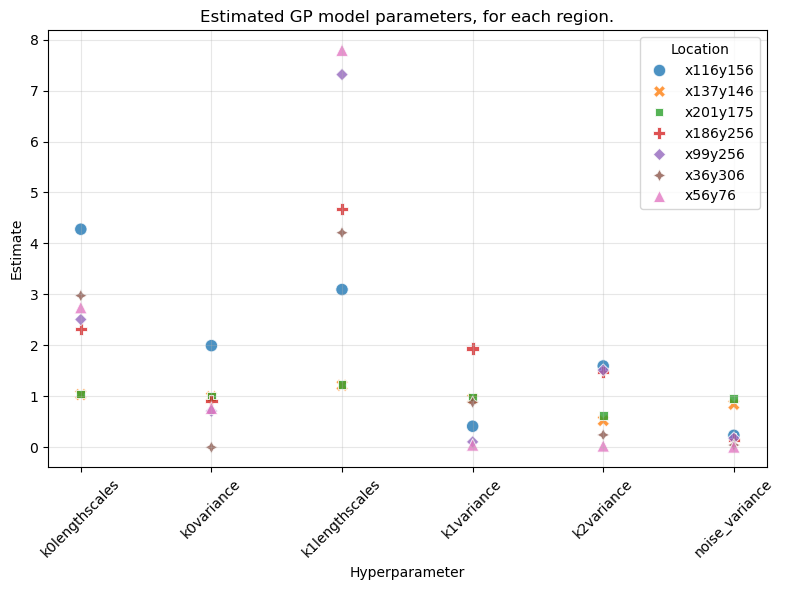

In [349]:
hyperparameter_df = hyperparams.melt(
        id_vars='hyperparameter', 
        var_name='Location', 
        value_name='Estimate'
    )
# Reorder hyperparameters for clarity 
hyperparameter_df['Hyperparameter'] = pd.Categorical(
    hyperparameter_df['hyperparameter'], 
    categories=['k0lengthscales','k0variance','k1lengthscales', 'k1variance', 'k2variance', 
                 'noise_variance']
)
import seaborn as sns

# Create the plot with seaborn - automatically handles colors and shapes
plt.figure(figsize=(8, 6))
sns.scatterplot(data=hyperparameter_df, 
                x='Hyperparameter', 
                y='Estimate',
                style='Location',  # Different shapes for each location
                hue='Location',    # Different colors for each location
                s=80,
                alpha=0.8)

plt.xticks(rotation=45)
plt.title('Estimated GP model parameters, for each region.')
plt.tight_layout()
plt.grid(True, alpha =0.3)
plt.show()

## Lin. Reg. coeffs

In [257]:
linear_reg_dfs

,x116y156,x137y146,x201y175,x186y256,x99y256,x36y306,x56y76,Variable
Visib012_0,0.00493,-0.0625,-0.213,-0.0523,-0.185,-0.0758,-0.0224,Visib012_0
CHL012_0,-0.765,-0.969,-1,-0.312,-1,-1.09,-0.769,CHL012_0
O2o012_0,0.0632,0.102,-0.148,-0.0186,0.149,0.0296,0.00695,O2o012_0
CHL-sat-2days,0.457,0.358,1.55,0.284,0.291,0.386,0.13,CHL-sat-2days
N3n012_0,0.015,-0.0773,-0.0177,-0.0374,0.0684,0.0102,0.00562,N3n012_0
bias012-2days,-0.137,-0.00505,0.181,0.426,0.0166,-0.0484,0.00542,bias012-2days


C:\Users\giuli\AppData\Local\Temp\ipykernel_17900\634913522.py:2: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(linear_reg_dfs.drop(['Variable'], axis = 1, inplace = False).T, labels=linear_reg_dfs.index)


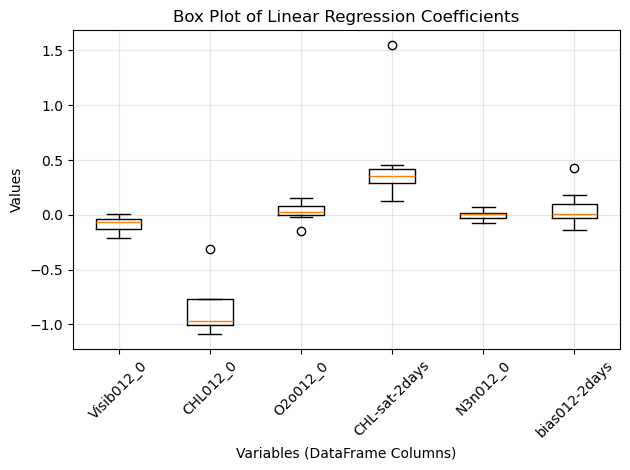

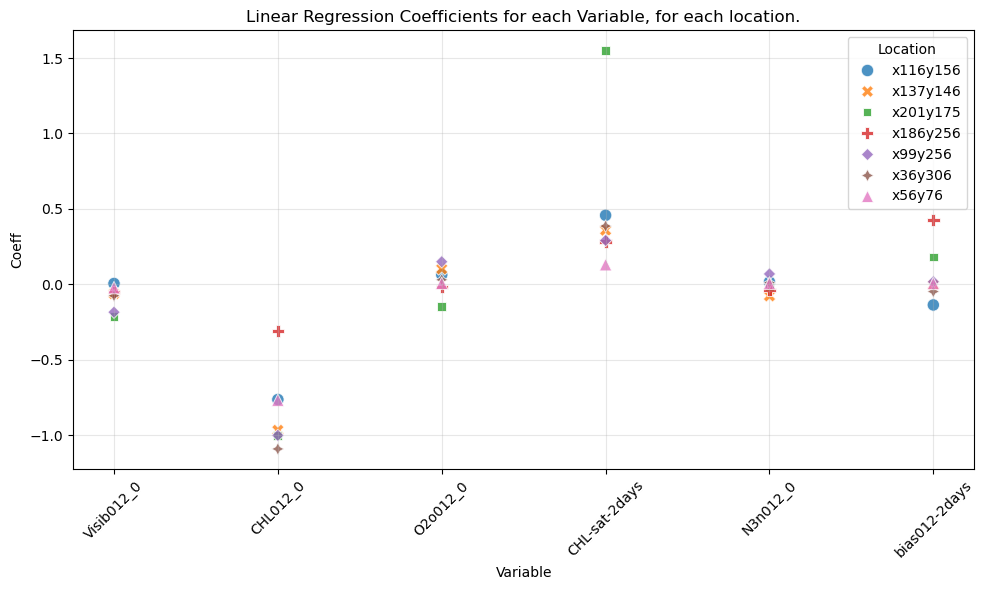

In [259]:
# For the linear regression coefficients
plt.boxplot(linear_reg_dfs.drop(['Variable'], axis = 1, inplace = False).T, labels=linear_reg_dfs.index)
plt.xlabel('Variables (DataFrame Columns)')
plt.ylabel('Values')
plt.title('Box Plot of Linear Regression Coefficients')
plt.xticks(rotation=45)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

melted_df3 = linear_reg_dfs.melt(
        id_vars='Variable', 
        var_name='Location', 
        value_name='Coeff'
    )

import seaborn as sns

# Create the plot with seaborn - automatically handles colors and shapes
plt.figure(figsize=(10, 6))
sns.scatterplot(data=melted_df3, 
                x='Variable', 
                y='Coeff',
                style='Location',  # Different shapes for each location
                hue='Location',    # Different colors for each location
                s=80,
                alpha=0.8)

plt.xticks(rotation=45)
plt.title('Linear Regression Coefficients for each Variable, for each location.')
plt.tight_layout()
plt.grid(True, alpha =0.3)
plt.show()

## ARD lengthscales

In [337]:
lengthscales.drop(['Variable'], axis = 1, inplace = False).T.describe()

,Visib012_0,CHL012_0,O2o012_0,CHL-sat-2days,N3n012_0,bias012-2days
count,7,7,7,7,7,7
mean,1.45,3.97,0.972,3.93,1.41,4.98
std,1.13,2.87,0.383,2.66,1.58,3.34
min,0.623,0.649,0.548,0.618,0.617,0.655
25%,0.7,1.85,0.638,2.16,0.626,2.51
50%,1.13,3.26,0.99,3.88,0.705,5.8
75%,1.6,6.27,1.25,5.42,1.18,7.3
max,3.83,7.64,1.48,7.85,4.91,8.76


In [342]:
lengthscales.T.N3n012_0

x116y156        1.56
x137y146       0.624
x201y175       0.617
x186y256        4.91
x99y256        0.705
x36y306        0.627
x56y76         0.804
Variable    N3n012_0
Name: N3n012_0, dtype: object

In [ ]:
melted_df = lengthscales.melt(
        id_vars='Variable', 
        var_name='Location', 
        value_name='Lengthscales'
    )

import seaborn as sns

# Create the plot with seaborn - automatically handles colors and shapes
plt.figure(figsize=(10, 6))
sns.scatterplot(data=melted_df, 
                x='Variable', 
                y='Lengthscale',
                style='Location',  # Different shapes for each location
                hue='Location',    # Different colors for each location
                s=80,
                alpha=0.8)

plt.xticks(rotation=45)
plt.title('Estimated Lengthscales for each Variable, for each location.')
plt.tight_layout()
plt.grid(True, alpha =0.3)
plt.show()

## 1D slices?

## Time-Series predictions

### For single grid-points

In [ ]:
def plot_ts(resultsdict, testpoint = 'x4y4', loc= 'x116y156', scatter_plot = True, testing_xlim = True):
    df = resultsdict[testpoint]#[x116y156_resultsdict['x4y4'].Time > dt.datetime(2023, 3, 9)]

    fig, ax = plt.subplots(figsize = (8,3))

    ax.plot(df['Time'], df.predmean, '--', label = 'GP mean')
    ax.plot(df['Time'], df.linreg_pred, '--', label = 'Linear Regression mean', alpha = 0.8)
    ax.plot(df.Time, df['bias012'], '-', alpha = 0.4, color = 'black', label = ' actual bias' )
    ax.fill_between(df['Time'], 
                    df.predmean - df.y_CI,
                    df.predmean + df.y_CI,
                    alpha = 0.2, color = 'orange', label = 'y 95% cI')
    ax.fill_between(df['Time'], 
                    df.predmean - df.f_CI,
                    df.predmean + df.f_CI,
                    alpha = 0.2, color = 'blue', label = 'f 95% CI')

    ax.axhline(0, alpha = 0.3, color = 'red')
    ax.set_ylabel('+12 CHL bias, mg/m^3')
    
    ax.legend()
    ax.set_title(f'GP prediction of +12 Chl-a forecast bias over testing period, for location {loc}.')

        # ax.set_xlim(min(df.iloc[test_indices,]['Time']), max(df.iloc[test_indices,]['Time']))
    if testing_xlim == True:
        ax.set_xlim(dt.datetime(2023, 11, 9), dt.datetime(2024, 5, 15))

    if scatter_plot == True:
        df = df[df.Time > dt.datetime(2023, 3, 9)]
        scatter_preds(df['bias012'], df['predmean'], df['y_CI'], loc =loc, 
                      title = f'Predicted vs Actual bias at central grid-cell of {loc} region.')


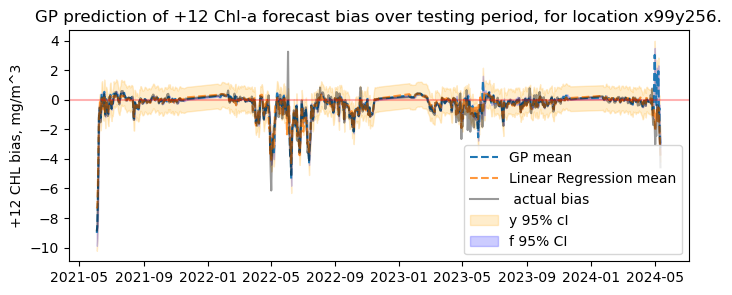

In [248]:
plot_ts(x99y256_resultsdict, testpoint = 'x4y4', loc= 'x99y256', testing_xlim=False, scatter_plot= False)

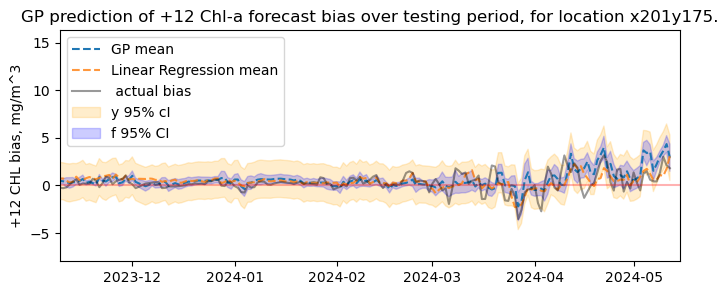

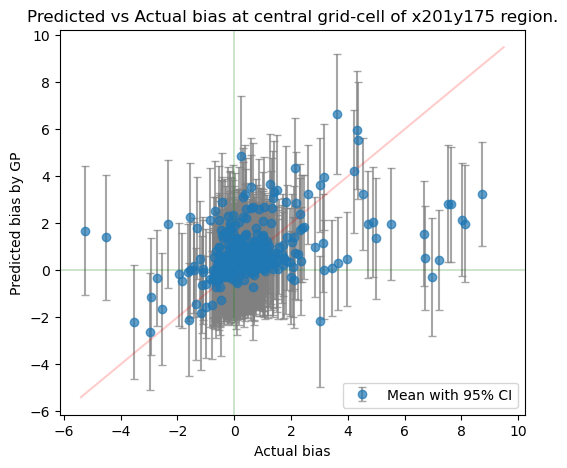

In [253]:
# plot_ts(x116y156_resultsdict, testpoint = 'x4y4', loc= 'x116y156')
# plot_ts(x36y306_resultsdict, testpoint = 'x4y4', loc= 'x36y306')
plot_ts(x201y175_resultsdict, testpoint = 'x4y4', loc= 'x201y175')
# plot_ts(x56y76_resultsdict, testpoint = 'x4y4', loc= 'x56y76')
# plot_ts(x99y256_resultsdict, testpoint = 'x4y4', loc= 'x99y256', testing_xlim=True)
# plot_ts(x137y146_resultsdict, testpoint = 'x4y4', loc= 'x137y146')
# plot_ts(x186y256_resultsdict, testpoint = 'x4y4', loc= 'x186y256')

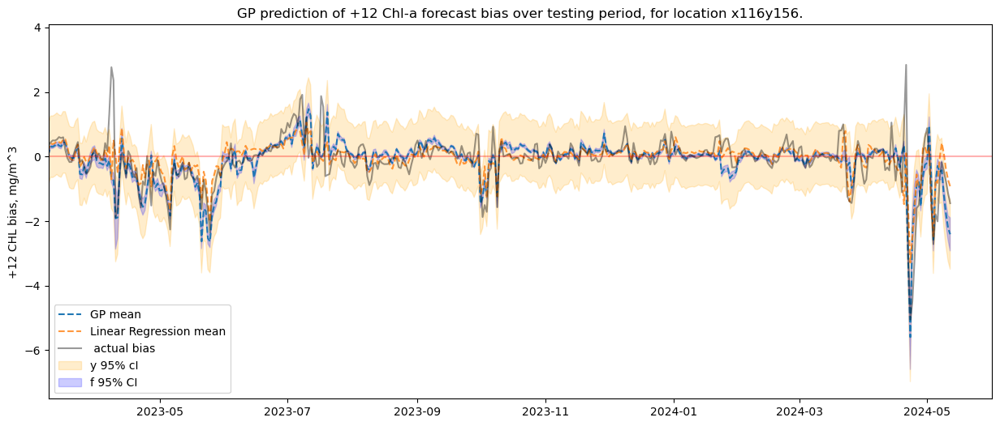

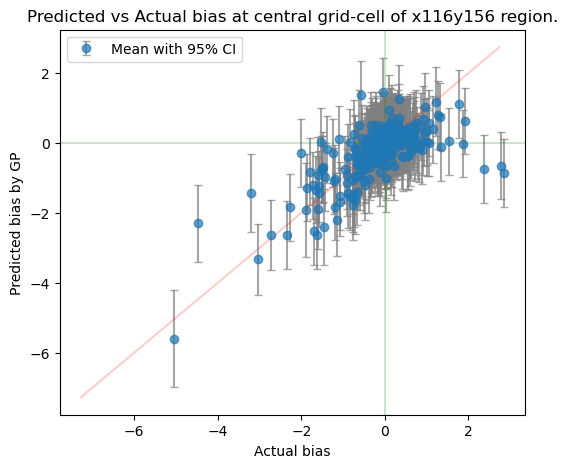

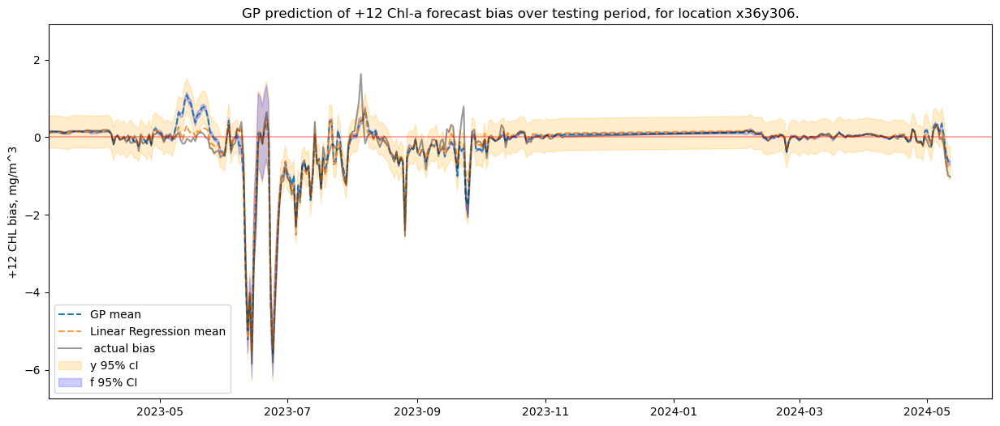

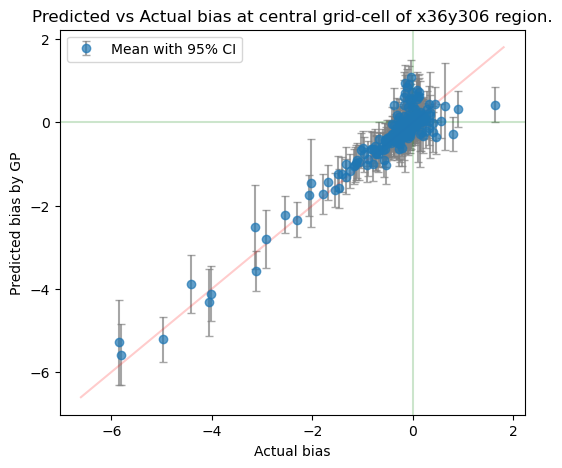

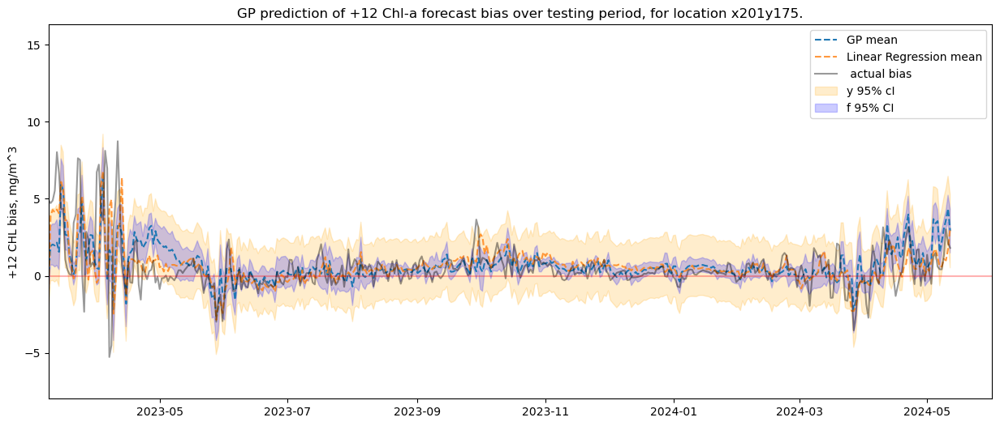

...

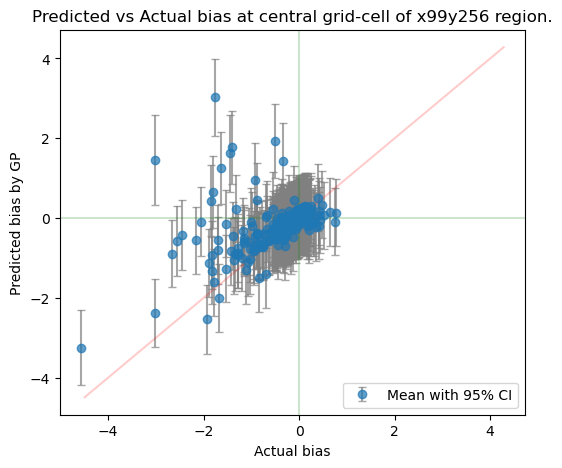

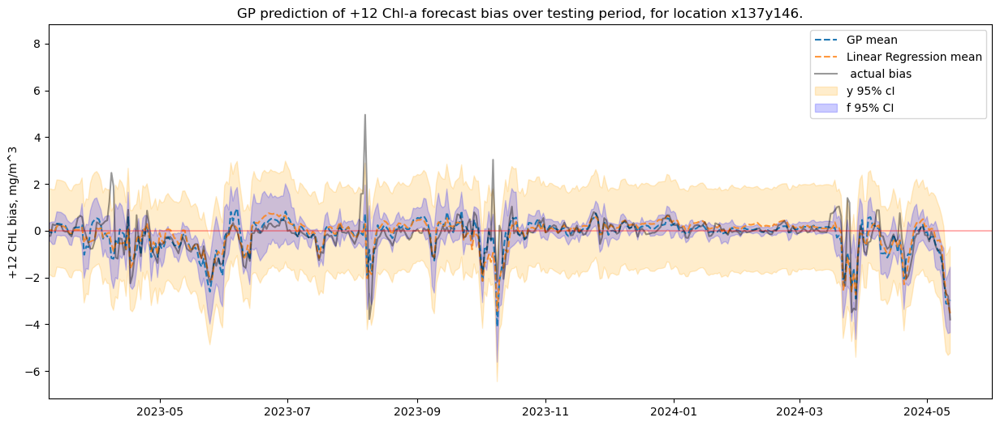

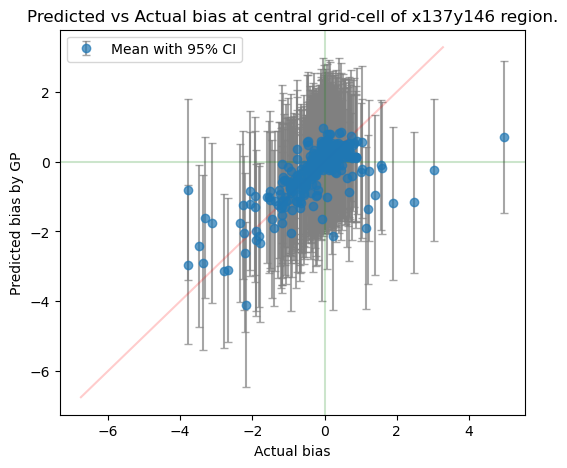

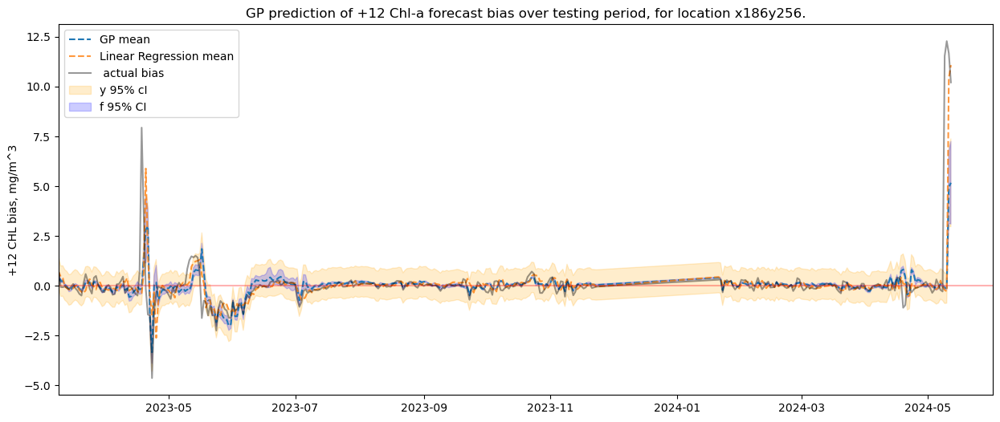

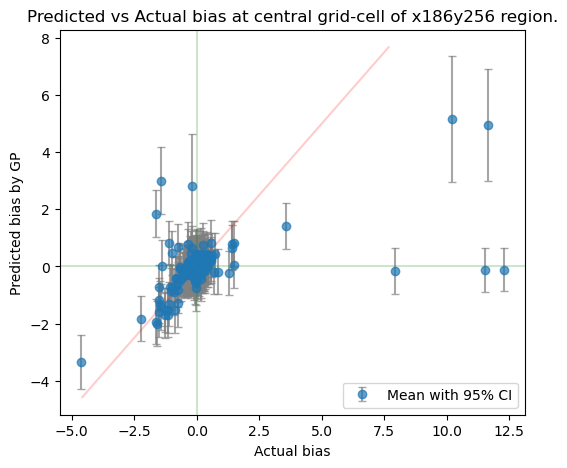

In [ ]:
plot_ts(x116y156_resultsdict, testpoint = 'x4y4', loc= 'x116y156')
plot_ts(x36y306_resultsdict, testpoint = 'x4y4', loc= 'x36y306')
plot_ts(x201y175_resultsdict, testpoint = 'x4y4', loc= 'x201y175')
plot_ts(x56y76_resultsdict, testpoint = 'x4y4', loc= 'x56y76')
plot_ts(x99y256_resultsdict, testpoint = 'x4y4', loc= 'x99y256', testing_xlim=True)
plot_ts(x137y146_resultsdict, testpoint = 'x4y4', loc= 'x137y146')
plot_ts(x186y256_resultsdict, testpoint = 'x4y4', loc= 'x186y256')

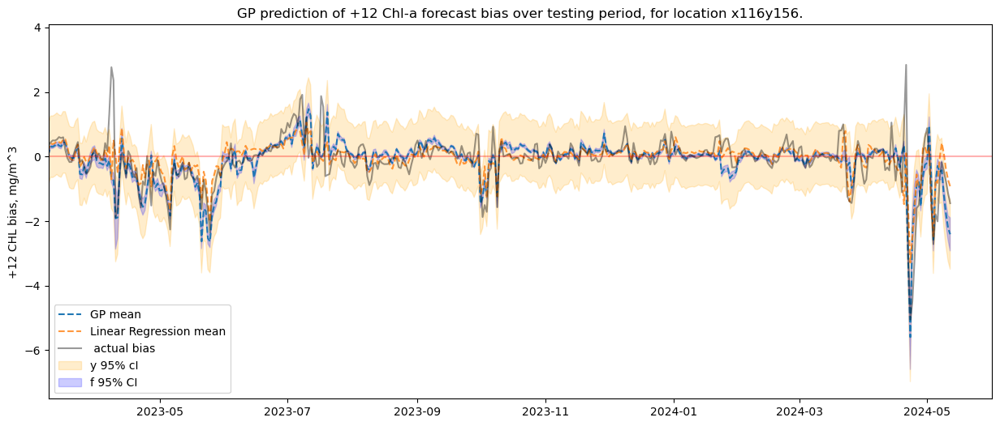

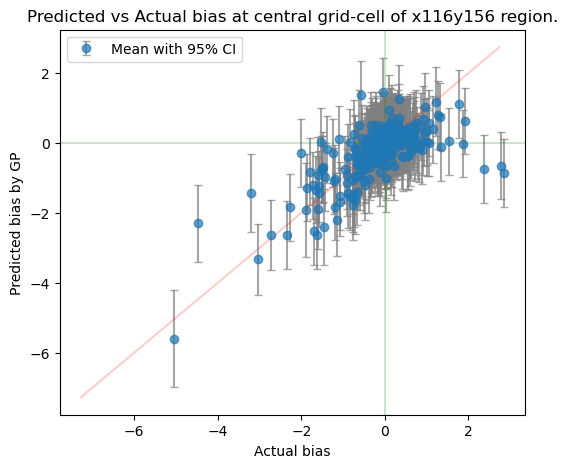

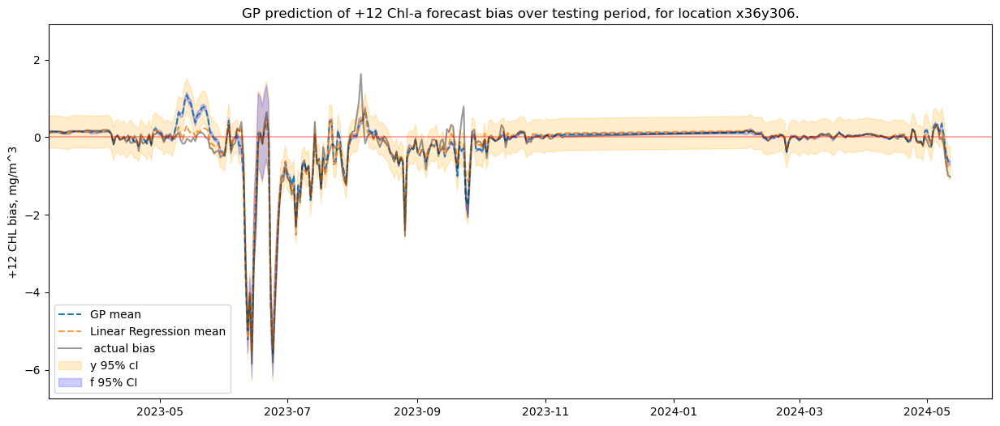

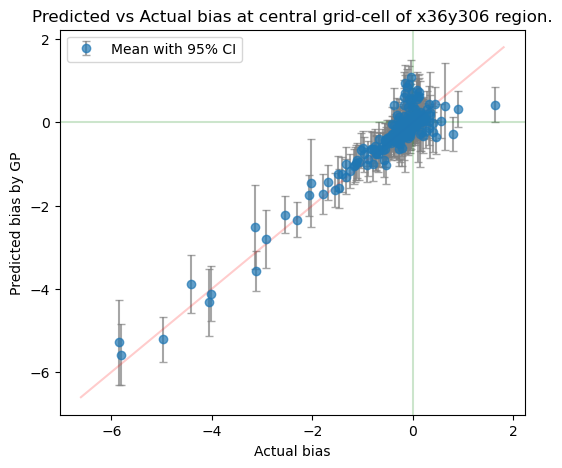

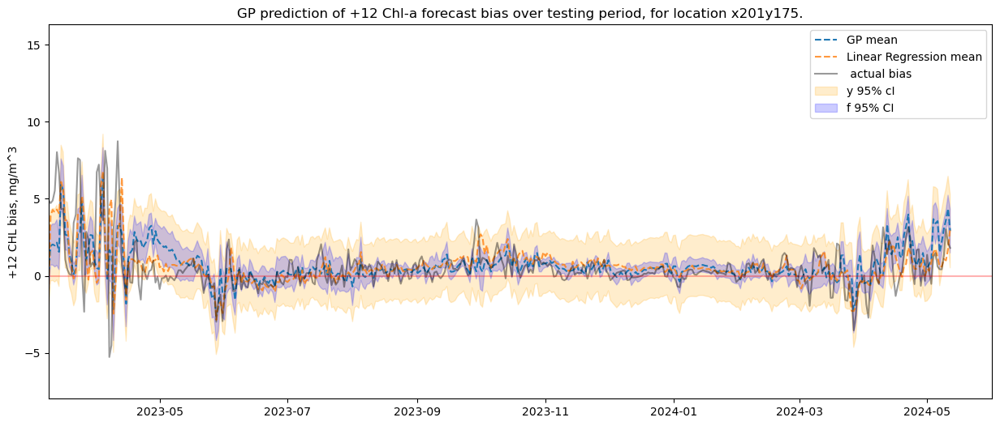

...

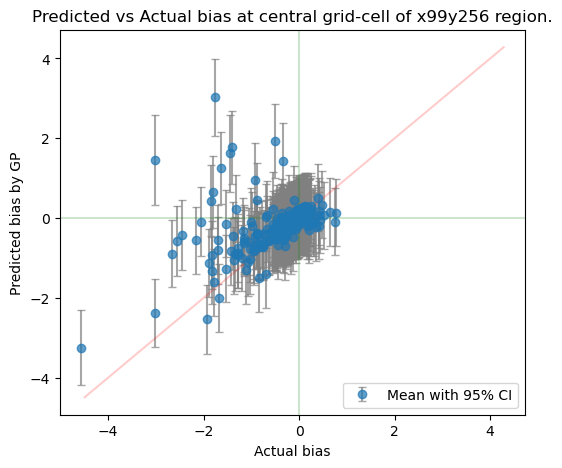

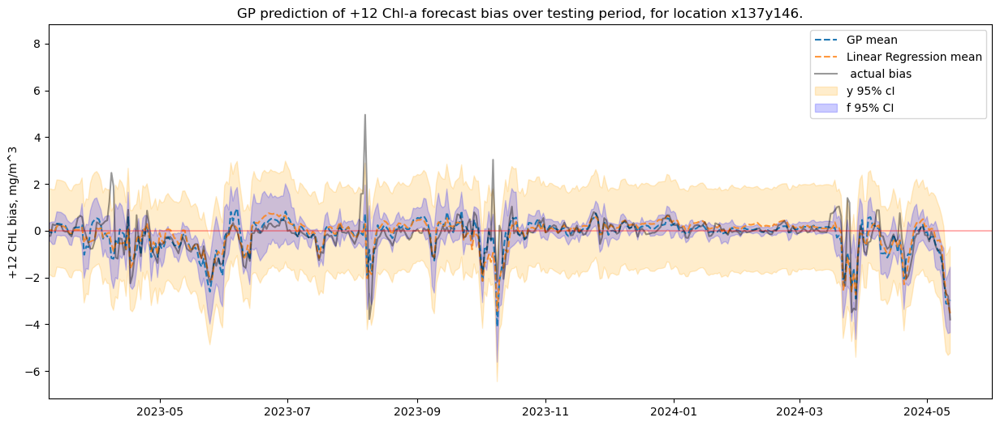

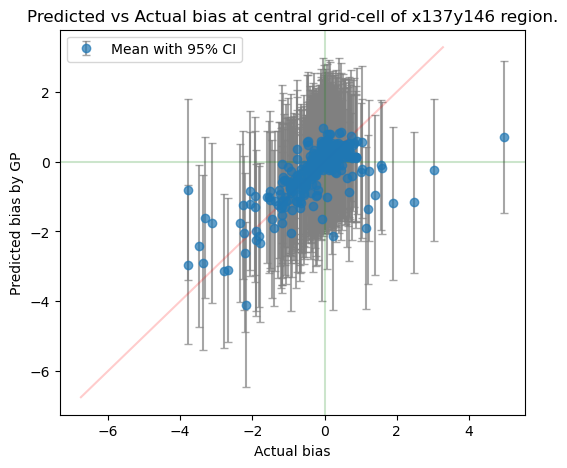

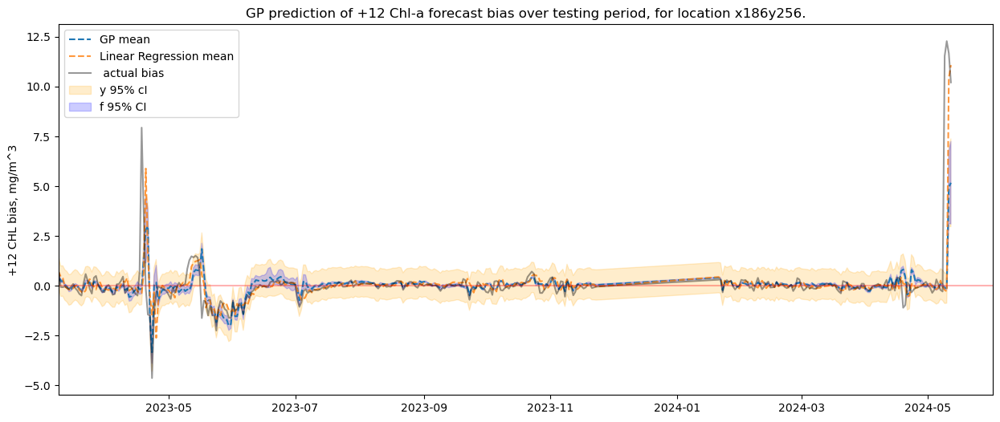

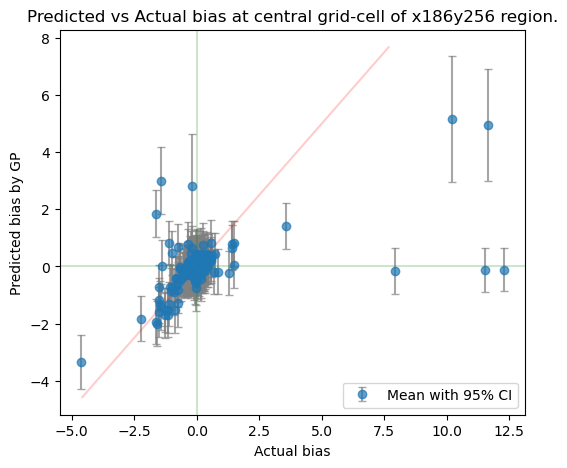

In [ ]:
plot_ts(x116y156_resultsdict, testpoint = 'x4y4', loc= 'x116y156')
plot_ts(x36y306_resultsdict, testpoint = 'x4y4', loc= 'x36y306')
plot_ts(x201y175_resultsdict, testpoint = 'x4y4', loc= 'x201y175')
plot_ts(x56y76_resultsdict, testpoint = 'x4y4', loc= 'x56y76')
plot_ts(x99y256_resultsdict, testpoint = 'x4y4', loc= 'x99y256', testing_xlim=True)
plot_ts(x137y146_resultsdict, testpoint = 'x4y4', loc= 'x137y146')
plot_ts(x186y256_resultsdict, testpoint = 'x4y4', loc= 'x186y256')

### Average for the region
Would that be helpful? I think the central points are representative, and the validaiton metrics sort of do the rest. 

## Consecutive Days

* Want to find some days where the predictions are poor - lag in the bias prediction - or show that the spatial patterns are replicated well/not well 

In [186]:
def preds_vis(days , results_dict = None, bias_vmax = None, var_vmax = None, title  = None):    
    # Create dictionary with coordinates for that region - not all regions will have 9x9 gridcells due to land points
    coord_dict = {}
    import re
    for loc in results_dict.keys():
        # print(loc)
        match = re.match(r'x(\d+)y(\d+)', loc)
        x, y = int(match.group(1)), int(match.group(2))
        coord_dict[loc] = (x, y)

    fig, ax = plt.subplots(len(days),3, figsize = (8, len(days)*2.5)) 
    for i, day in enumerate(days):
    
        # Matrices to store colourmap values for that 9x9 region
        meangrid = np.full((9,9), np.nan)
        truegrid = np.full((9,9), np.nan)
        vargrid = np.full((9,9), np.nan)

        
        # Loop through locations in the results dictionary and assign the predicted/true Chl values to that space in the matrices
        for loc, (x, y) in coord_dict.items():
            df = results_dict[loc]
            # print(df[df.Time == day].predmean)
            meangrid[y,x] = df[df.Time == day].predmean.values.mean()
            vargrid[y,x] = df[df.Time == day].predvar.values.mean()
            truegrid[y,x] = df[df.Time == day].bias012.values.mean()

        # Plot the True bias
        # Colourscale bar fixed for comparison, otherwise set to maximum value
        vmax = np.nanmax(np.abs(truegrid))
        if bias_vmax !=None:
            vmax =bias_vmax
        im = ax[i, 0].imshow(truegrid, cmap='RdBu_r', aspect='auto', origin='lower',
                    vmax =vmax, vmin = -vmax)
        cbar = plt.colorbar(im, ax=ax[i, 0])
        ax[i, 0].set_title(f'{day.strftime("%Y-%m-%d")}: True bias')


        # Plot the GP predicted mean
        im2 = ax[i,1].imshow(meangrid, cmap='RdBu_r', aspect='auto', origin='lower',
                    vmax =vmax, vmin = -vmax)
        cbar = plt.colorbar(im2, ax=ax[i, 1])
        ax[i,1].set_title(f'{day.strftime("%Y-%m-%d")}: GP mean')

        # Plot the GP variance
        vmax3 = np.nanmax(np.abs(vargrid))
        if var_vmax !=None:
            vmax3 = var_vmax
        im3 = ax[i,2].imshow(vargrid, cmap='viridis', aspect='auto', origin='lower',
                    vmax =vmax3, vmin = 0)
        # Add colorbar
        cbar = plt.colorbar(im3, ax=ax[i, 2])
        ax[i, 2].set_title(f'{day.strftime("%Y-%m-%d")}: GP variance')

    fig.suptitle(title)
    plt.tight_layout()
    plt.show()

C:\Users\giuli\AppData\Local\Temp\ipykernel_17900\1338439130.py:24: RuntimeWarning: Mean of empty slice.
  meangrid[y,x] = df[df.Time == day].predmean.values.mean()
C:\Users\giuli\AppData\Local\Temp\ipykernel_17900\1338439130.py:25: RuntimeWarning: Mean of empty slice.
  vargrid[y,x] = df[df.Time == day].predvar.values.mean()
C:\Users\giuli\AppData\Local\Temp\ipykernel_17900\1338439130.py:26: RuntimeWarning: Mean of empty slice.
  truegrid[y,x] = df[df.Time == day].bias012.values.mean()


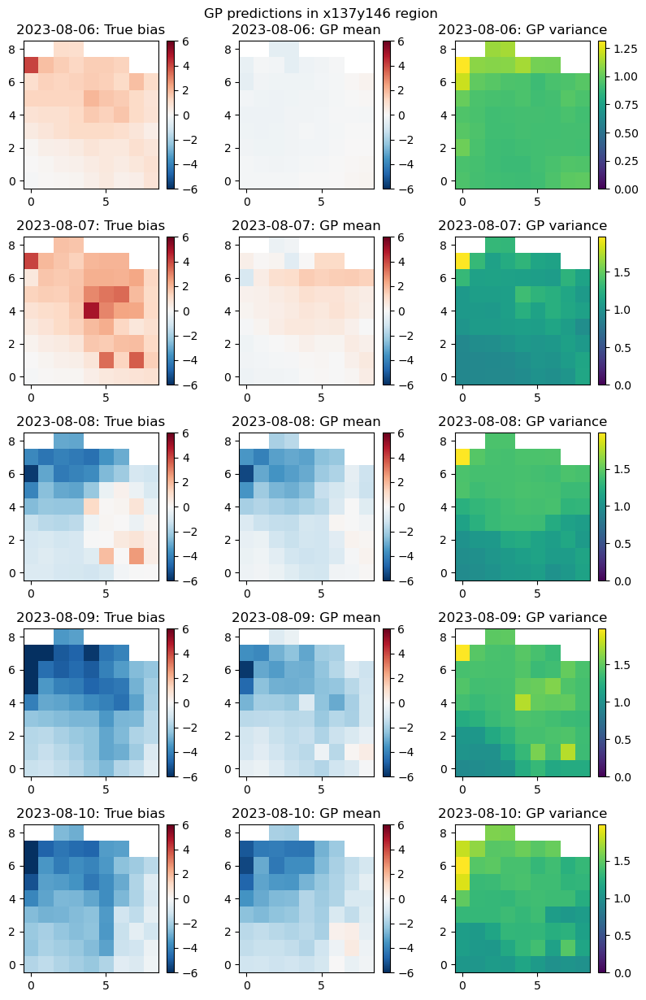

In [304]:
days = [dt.datetime(2023, 8, 6) + dt.timedelta(days=x) for x in range(5)]
preds_vis(days, results_dict = x137y146_resultsdict, bias_vmax = 6, title = 'GP predictions in x137y146 region')

In [ ]:
days = [dt.datetime(2023, 4, 18) + dt.timedelta(days=x) for x in range(5)]
preds_vis(days, results_dict = x186y256_resultsdict, bias_vmax = 8,
          var_vmax = 1.5, title = 'GP predictions in x186y256 region')

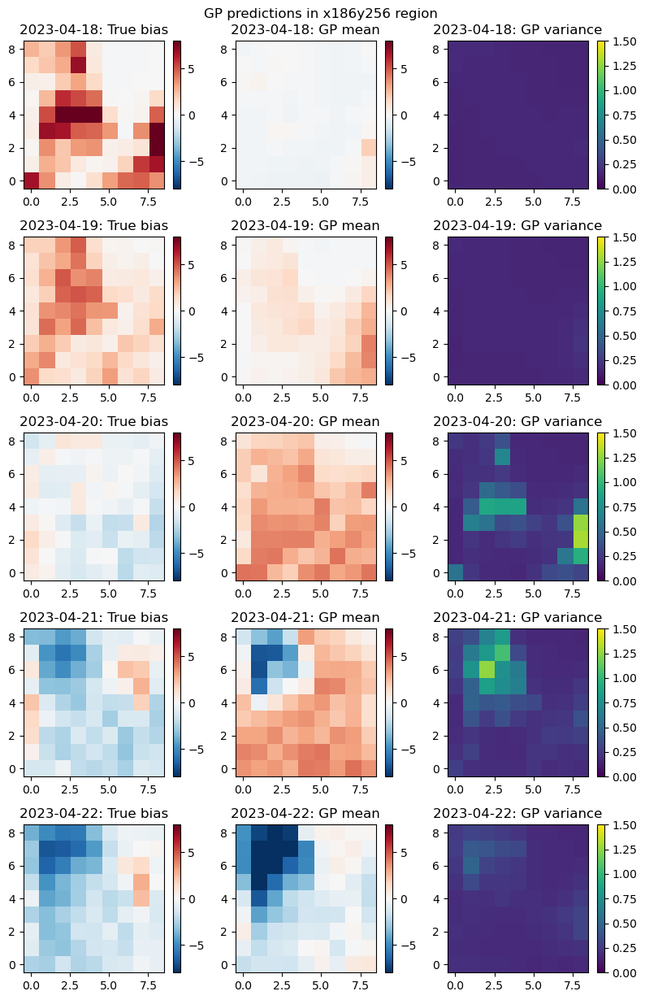

In [298]:
days = [dt.datetime(2023, 4, 18) + dt.timedelta(days=x) for x in range(5)]
preds_vis(days, results_dict = x186y256_resultsdict, bias_vmax = 8,
          var_vmax = 1.5, title = 'GP predictions in x186y256 region')

## Validation - residuals plots

In [394]:
def error_scatter(results_dict, loc, hist = False):
    df_stacked = pd.concat(results_dict)
    df_full = df_stacked[df_stacked.Time > dt.datetime(2023, 3, 9)]
    plt.figure(figsize=(6, 4))
    df_full['error'] = df_full.bias012 - df_full.predmean
    plt.scatter(df_full.bias012, df_full.error, color = 'black', alpha = 0.6, s = 1.2)
    plt.xlabel('Actual chl bias (mgm^-3)')
    plt.ylabel('Error in Predicted bias by GP')
    plt.title(f'Residuals vs True bias, for {loc} region')
    plt.axhline(0, color = 'green', alpha = 0.2)

    plt.legend()
    plt.show()
    if hist == True:
        plt.figure(figsize = (6, 4))
        plt.hist(df_full.bias012, label = 'true bias', bins = 100, alpha = 0.6)
        plt.hist(df_full.predmean,label='GP mean', bins = 100,  alpha = 0.6)
        plt.legend()
        plt.xlim(-6,6)
        plt.title('Distributions of chl+12 forecast bias ')
    print(df_full[['bias012', 'predmean']].describe())
    print('Cramer-von-Mises test statistic and p-value for similarity of bias distributions:')
    point = results_dict['x4y4'][ results_dict['x4y4'].Time > dt.datetime(2023, 3, 9)]
    res = stats.cramervonmises_2samp(df_full.bias012, df_full.predmean,  method='auto')
    res = stats.cramervonmises_2samp(x,x2,  method='auto')
    print(res.statistic, res.pvalue) # p-value is small so we reject H0 that distrs are the same
    if res.pvalue>0.05:
        print('Do not reject H0, evidence that distributions are the same')
    if res.pvalue<0.05:
        print('Reject H0,  distributions are not the same')
    

### Apply to each region - CvM for central grid point

In [ ]:
# can delete
fig, ax = plt.subplots(1, 3, figsize=(11, 4))
for i, results in enumerate([x186y256_resultsdict,x137y146_resultsdict, x56y76_resultsdict ]):
    df_stacked = pd.concat(results_dict)
    df_full = df_stacked[df_stacked.Time > dt.datetime(2023, 3, 9)]
    df_full['error'] = df_full.bias012 - df_full.predmean
    ax[i].scatter(df_full.bias012, df_full.error, color = 'black', alpha = 0.6, s = 1.2)
    ax[i].set_xlabel('Actual chl bias (mgm^-3)')
    ax[i].set_ylabel('Error in Predicted bias by GP')
    ax[i].axhline(0, color = 'green', alpha = 0.2)


for i, loc in enumerate(['x186y256', 'x137y146', 'x56y76']):
    ax[i].set_title(f'{loc} region')
fig.suptitle('Residuals vs True bias')
plt.tight_layout()


C:\Users\giuli\AppData\Local\Temp\ipykernel_17900\139384901.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_full['error'] = df_full.bias012 - df_full.predmean
C:\Users\giuli\AppData\Local\Temp\ipykernel_17900\139384901.py:12: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


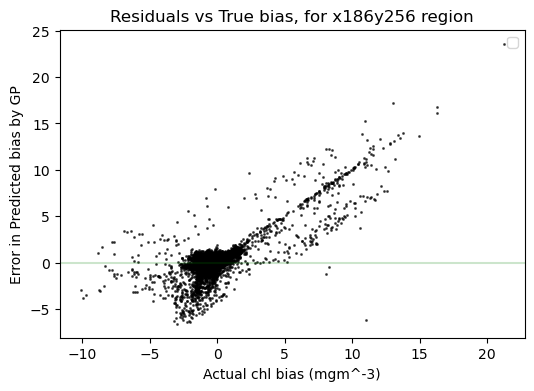

       bias012  predmean
count 3.02e+04  3.02e+04
mean  -0.00383   -0.0269
std       1.03     0.662
min      -10.1     -10.3
25%     -0.179    -0.114
50%    -0.0131    0.0329
75%      0.121     0.133
max       21.2      17.2
Cramer-von-Mises test statistic and p-value for similarity of bias distributions:
37.03767217286804 3.14409420720807e-09
Reject H0,  distributions are not the same


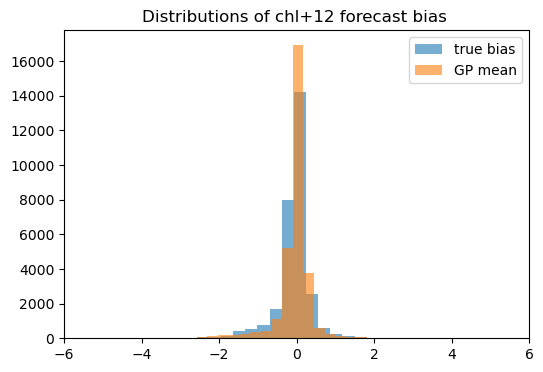

In [395]:
error_scatter(x186y256_resultsdict, loc= 'x186y256', hist = True)

C:\Users\giuli\AppData\Local\Temp\ipykernel_17900\139384901.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_full['error'] = df_full.bias012 - df_full.predmean
C:\Users\giuli\AppData\Local\Temp\ipykernel_17900\139384901.py:12: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


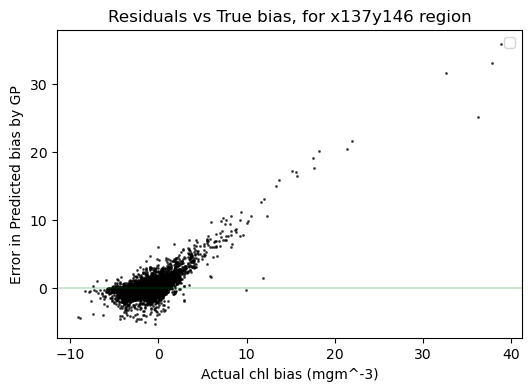

       bias012  predmean
count 3.09e+04  3.09e+04
mean    -0.241    -0.216
std        1.1     0.831
min      -9.08     -7.98
25%     -0.488    -0.391
50%    -0.0949  -0.00342
75%      0.133      0.19
max       38.8      11.1
Cramer-von-Mises test statistic and p-value for similarity of bias distributions:
37.03767217286804 3.14409420720807e-09
Reject H0,  distributions are not the same


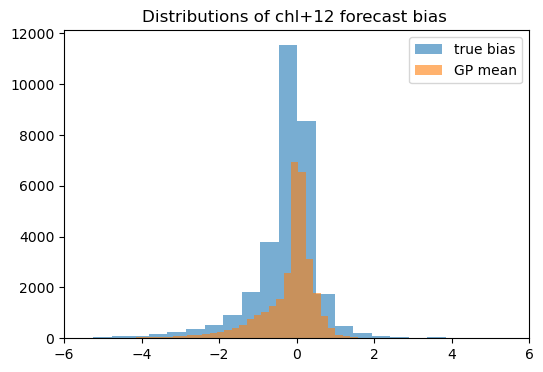

In [396]:
error_scatter(x137y146_resultsdict, loc= 'x137y146', hist = True)

C:\Users\giuli\AppData\Local\Temp\ipykernel_17900\139384901.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_full['error'] = df_full.bias012 - df_full.predmean
C:\Users\giuli\AppData\Local\Temp\ipykernel_17900\139384901.py:12: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


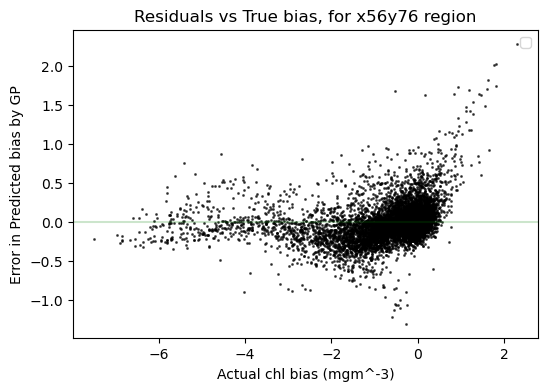

       bias012  predmean
count 3.47e+04  3.47e+04
mean    -0.223    -0.208
std      0.648     0.632
min      -7.49     -7.27
25%     -0.167    -0.155
50%    -0.0512   -0.0373
75%     0.0113    0.0227
max       2.29      1.03
Cramer-von-Mises test statistic and p-value for similarity of bias distributions:
37.03767217286804 3.14409420720807e-09
Reject H0,  distributions are not the same


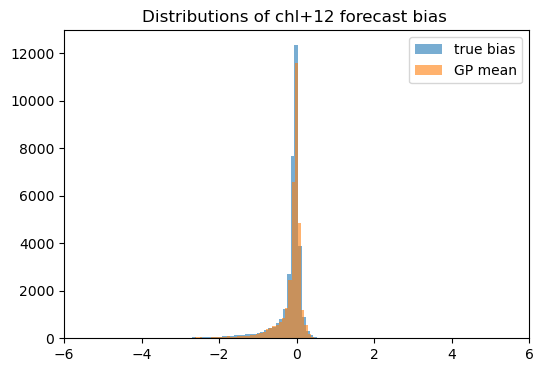

In [401]:
error_scatter(x56y76_resultsdict, loc= 'x56y76', hist = True)

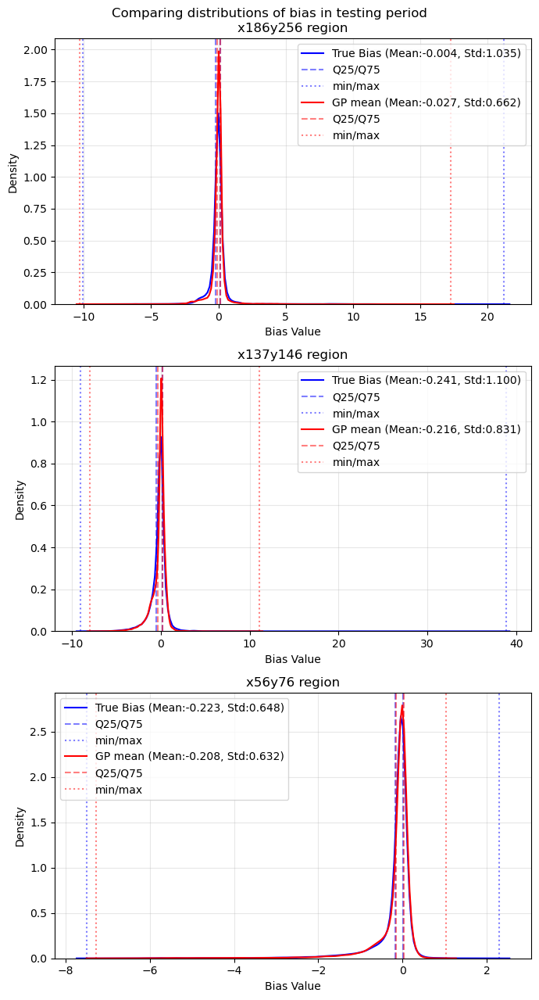

In [411]:
# Create the plot

# Define colors
colors = ['blue', 'red']
variables = ['bias012', 'predmean']
varname = ['True Bias', 'GP mean']
title = ['x186y256', 'x137y146', 'x56y76']    
fig, ax = plt.subplots(3, 1, figsize=(7, 13))
fig.suptitle('Comparing distributions of bias in testing period')
for j, results in enumerate([x186y256_resultsdict,x137y146_resultsdict, x56y76_resultsdict ]):

    df_stacked = pd.concat(results)
    df_full = df_stacked[df_stacked.Time > dt.datetime(2023, 3, 9)]
    for i, var in enumerate(variables):
        data = df_full[var]
        # Plot density
        sns.kdeplot(data, ax=ax[j], color=colors[i], 
                    label=f'{varname[i]} (Mean:{data.mean():.3f}, Std:{data.std():.3f})')
        
        # Add vertical lines for statistics
        # ax[j].axvline(data.median(), color=colors[i], linestyle='-', alpha=0.7, linewidth=2)
        ax[j].axvline(data.quantile(0.25), color=colors[i], linestyle='--', alpha=0.5, label = 'Q25/Q75')
        ax[j].axvline(data.quantile(0.75), color=colors[i], linestyle='--', alpha=0.5)
        ax[j].axvline(data.min(), color=colors[i], linestyle=':', alpha=0.5, label = 'min/max')
        ax[j].axvline(data.max(), color=colors[i], linestyle=':', alpha=0.5)

    ax[j].set_xlabel('Bias Value')
    ax[j].set_ylabel('Density')
    ax[j].legend(loc=0)
    ax[j].set_title(f'{title[j]} region')
    ax[j].grid(True, alpha=0.3)
plt.tight_layout()

### Residuals by time of year

In [181]:
def error_time_scatter(results_dict, loc):
    """Plot prediction error vs week of year"""
    df_full = pd.concat(results_dict)
    df_full = df_full[df_full.Time > dt.datetime(2023, 3, 9)]
    df_full['error'] = df_full.bias012 - df_full.predmean
    # df_full['grouped'] = df_full.Time.dt.isocalendar().week
    
    plt.figure(figsize=(12, 6))
    monthly_errors = [df_full[df_full.month == i].error for i in range(1, 13)]
    plt.boxplot(monthly_errors, labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                                       'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    plt.xlabel('Month of Year')
    
    # plt.scatter(df_full.grouped, df_full.error, color='black', alpha=0.6, s=1.2)
    # plt.xlabel('Week of Year')
    plt.ylabel('Error in Predicted bias by GP')
    plt.title(f'Prediction Error vs Week of Year, for {loc} region')
    # plt.axhline(0, color='green', alpha=0.3)
    # plt.grid(True, alpha=0.3)
    plt.show()

In [ ]:
def error_time_scatter(results_dict, loc):
    """Plot prediction error vs week of year"""
    df_full = pd.concat(results_dict)
    df_full = df_full[df_full.Time > dt.datetime(2023, 3, 9)]
    df_full['error'] = df_full.bias012 - df_full.predmean
    df_full['month'] = df_full.Time.dt.month
    
    df_full['grouped'] = df_full.Time.dt.isocalendar().week
    
    fig, ax = plt.subplots(figsize=(12, 6))
    monthly_errors = [df_full[df_full.month == i].error for i in range(1, 13)]
    if monthly_errors[11].shape[0] == 0:
        monthly_errors[11] = np.zeros(monthly_errors[10].shape)
    # plt.boxplot(monthly_errors, labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
    #                                    'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    quantiles_per_month = [[0.05, 0.95]] * 12
    ax.violinplot(monthly_errors, positions=range(1, 13), points=60, widths=0.7,
                     showmeans=True, showextrema=True, showmedians=False,
                     quantiles=quantiles_per_month, bw_method=0.5)
                     # Create quantiles list for each month (12 months)


    # Set the x-axis labels for months
    ax.set_xticks(range(1, 13))
    ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                          'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    ax.set_xlabel('Month of Year')
    ax.set_ylabel('Error in Predicted bias by GP')
    ax.set_title(f'Prediction Error vs Month of Year, for {loc} region')
    ax.axhline(0, color='green', alpha=0.3)
    ax.grid(True, alpha=0.3)
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.scatter(df_full.grouped, df_full.error, color='black', alpha=0.6, s=1.2)
    plt.xlabel('Week of Year')
    plt.ylabel('Error in Predicted bias by GP')
    plt.title(f'Prediction Error vs Week of Year, for {loc} region')
    plt.axhline(0, color='green', alpha=0.3)
    plt.grid(True, alpha=0.3)
    plt.show()

# error_time_scatter(x56y76_resultsdict, loc= 'x36y76')

* Errors are largest in the growing seasons, but they are quite evenly positive/negative apart from Sept/Oct time

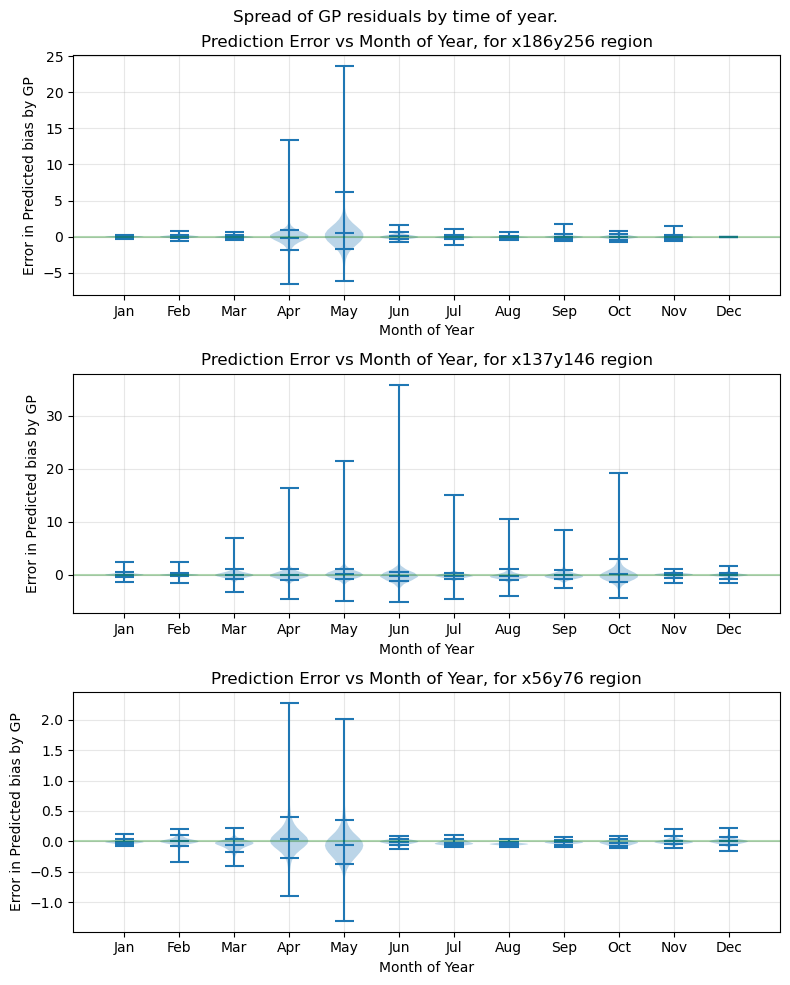

In [432]:
fig, ax  = plt.subplots(3, 1, figsize=(8, 10))
fig.suptitle('Spread of GP residuals by time of year.')
for i, results_dict in enumerate([x186y256_resultsdict,x137y146_resultsdict, x56y76_resultsdict ]):
    df_full = pd.concat(results_dict)
    df_full = df_full[df_full.Time > dt.datetime(2023, 3, 9)]
    df_full['error'] = df_full.bias012 - df_full.predmean
    df_full['month'] = df_full.Time.dt.month
    df_full['grouped'] = df_full.Time.dt.isocalendar().week
    
    monthly_errors = [df_full[df_full.month == i].error for i in range(1, 13)]
    if monthly_errors[11].shape[0] == 0:
        monthly_errors[11] = np.zeros(monthly_errors[10].shape)
    # plt.boxplot(monthly_errors, labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
    #                                    'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    quantiles_per_month = [[0.05, 0.95]] * 12
    ax[i].violinplot(monthly_errors, positions=range(1, 13), points=60, widths=0.7,
                     showmeans=True, showextrema=True, showmedians=False,
                     quantiles=quantiles_per_month, bw_method=0.5)
                     # Create quantiles list for each month (12 months)

    # Set the x-axis labels for months
    ax[i].set_xticks(range(1, 13))
    ax[i].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                          'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    ax[i].set_xlabel('Month of Year')
    ax[i].set_ylabel('Error in Predicted bias by GP')
    ax[i].axhline(0, color='green', alpha=0.3)
    ax[i].grid(True, alpha=0.3)
for i, loc in enumerate(['x186y256', 'x137y146', 'x56y76']):
    ax[i].set_title(f'Prediction Error vs Month of Year, for {loc} region')
plt.tight_layout()
plt.show()

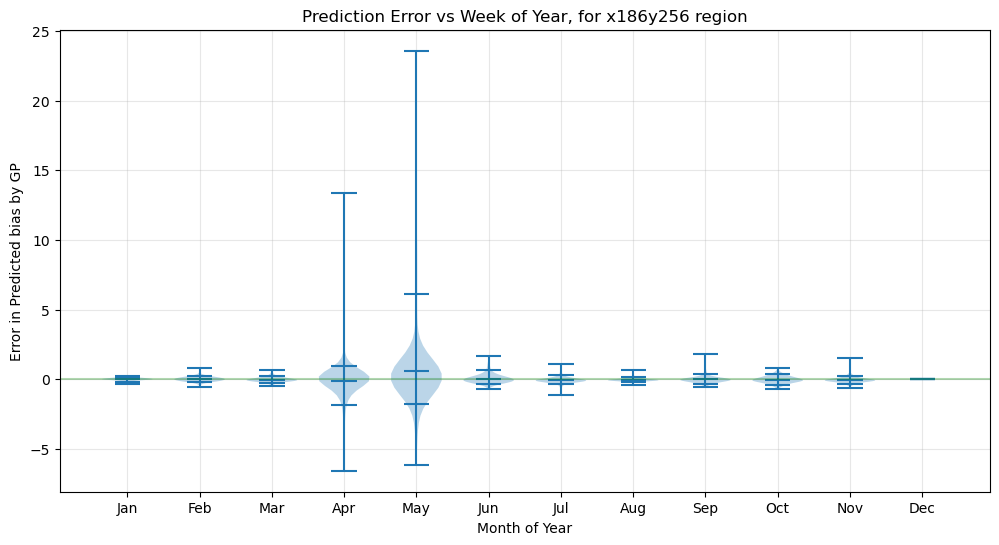

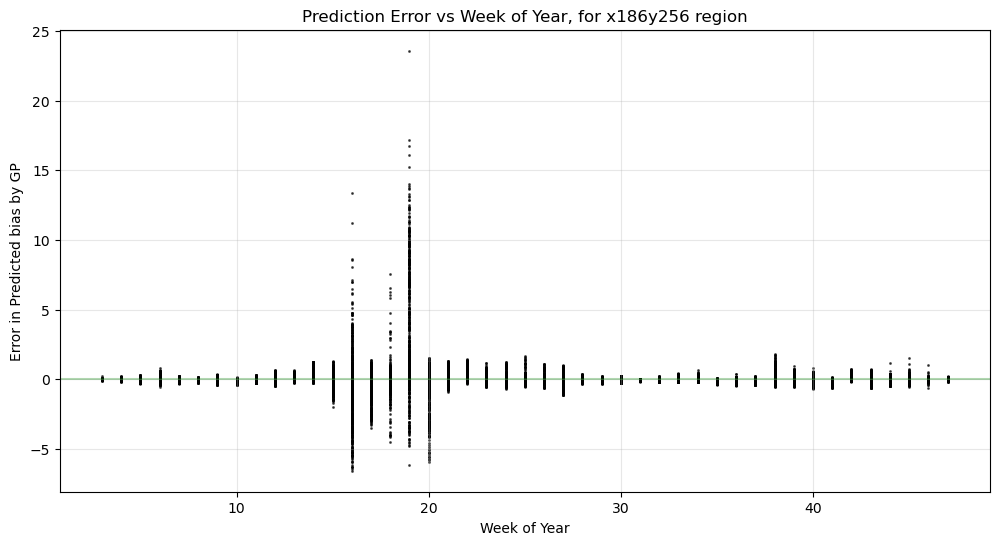

In [427]:
# error_time_scatter(x36y306_resultsdict, loc='x36y306')
# error_time_scatter(x201y175_resultsdict, loc='x201y175')
# error_time_scatter(x56y76_resultsdict, loc='x56y76')
# error_time_scatter(x99y256_resultsdict, loc='x99y256')
# For report
# error_time_scatter(x137y146_resultsdict, loc='x137y146')
error_time_scatter(x186y256_resultsdict, loc='x186y256')

## Residuals over space

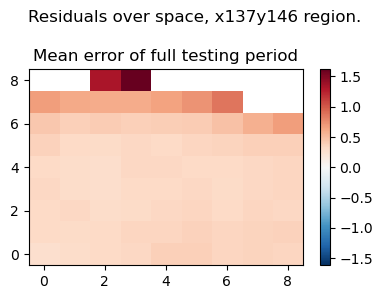

In [ ]:
# Adapt the previously used function to show the mean residual value at the L4 region
import re

def region_vis2(days = None, loc_dict = None, bias_var = None, title = None):
    coord_dict = {}

    for loc in loc_dict.keys():
        match = re.match(r'x(\d+)y(\d+)', loc)
        x, y = int(match.group(1)), int(match.group(2))
        coord_dict[loc] = (x, y)

    fig, ax = plt.subplots(1, len(days), figsize = (len(days)*4,3)) 
    if len(days) == 1:
        ax = [ax]
    for i, day in enumerate(days):
        truegrid = np.full((9,9), np.nan)

        for loc, (x, y) in coord_dict.items():
            if loc in loc_dict.keys():

                df = loc_dict[loc]
                # print(df.head())
                df['error'] = df.bias012 - df.predmean
                # print(df['error'])
                truegrid[y,x] = np.mean(df['error'])

        # Plot the True bias
        vmax =  np.nanmax(np.abs(truegrid))
        im = ax[i].imshow(truegrid, cmap='RdBu_r', aspect='auto', origin='lower',
                    vmax =vmax, vmin = -vmax)
        
        
        ax[i].set_title(day.strftime('Mean error of full testing period'))
        cbar = fig.colorbar(im, ax=ax[i])
    fig.suptitle(title)
    plt.tight_layout()
    plt.show()

days = [dt.datetime(2023, 4, 7) + dt.timedelta(days=x) for x in range(1)]
region_vis2(days = days, loc_dict = x137y146_resultsdict, 
           bias_var = 'error', title = 'Residuals over space, x137y146 region.')

## Effect of increasing number of inducing points

In [ ]:
def vary_k_spatialGP(loc_dfs = x116y156_dfs, Ms= 10 + np.arange(50)[::10], train = False):
    df_full = pd.concat(loc_dfs)
    df_full.reset_index(inplace = True)
    
    df_full.dropna(inplace =True)
    input_df = df_full[['Visib012_0', 'CHL012_0', 'O2o012_0','CHL-sat-2days', 'N3n012_0', 'bias012-2days','longitude', 'latitude']]
    
    train_test_split = 0.6
    X = np.asarray(input_df, dtype=np.float64)
    # Do variable scaling 
    scaler = StandardScaler()
    X = scaler.fit_transform(X) 
    y = pd.DataFrame(df_full['bias012'])
    y = (np.asarray(y, dtype=np.float64))

    # Split train/test by date to have consecutive days for validation, but could do 60% randomly placed windows of consecutive days`
    train_indices = df_full.index[df_full.Time<dt.datetime(2023, 3,9)] 
    test_indices = [i for i in np.arange(len(df_full)) if i not in train_indices]

    # Split the data into training and testing sets
    X_train, X_test = X[train_indices, ], X[test_indices, ]
    y_train, y_test = y[train_indices], y[test_indices]
     # Estimate the linear regression parameters on a subset of training data to avoid overfitting - like what they do in metalearning
    reg_indices = np.random.choice(train_indices, size=300, replace=False).tolist() 
    reg = LinearRegression().fit(X[reg_indices, ][:,:6], y[reg_indices ]) # don't include lon/lat in linear regression coeffs
    A_array = np.vstack([reg.coef_.T, [0], [0]]) # Set linear regression coefficients to 0 for longitude and latitude
    results = {}
    for m in Ms:
        # Number of inducing points, set using K-means centroids for each columns in data
        n_inducing  = m
        inducing_variable, _ = kmeans(X, n_inducing) # try to find the k clusters in data
        spatial_mod = gpflow.models.SGPR(
            (X_train, y_train),
            kernel = gpflow.kernels.SquaredExponential(active_dims = [6,7])+
            gpflow.kernels.SquaredExponential(active_dims = [5, 6,7])+
            gpflow.kernels.SquaredExponential(active_dims = [0,1,2,3,4]),
            noise_variance=(0.2**2),  
            mean_function = gpflow.functions.Linear(A = A_array,
                                                    b = reg.intercept_),
            inducing_variable = inducing_variable
            ) 

        # Inducing variables and mean funciton parameters are fixed
        if train == False:
            gpflow.set_trainable(spatial_mod.inducing_variable.Z, False)
        elif train == True:
            gpflow.set_trainable(spatial_mod.inducing_variable.Z, False)
            
        gpflow.set_trainable(spatial_mod.mean_function.A, False) 
        gpflow.set_trainable(spatial_mod.mean_function.b, False)

        # Set priors for hyper-parameters
        spatial_mod.kernel.kernels[0].variance.prior = tfd.Uniform(f64(0.00001), f64(2))
        spatial_mod.kernel.kernels[0].lengthscales.prior = tfd.Uniform(f64(0.0), f64(15))

        spatial_mod.kernel.kernels[1].variance.prior = tfd.Uniform(f64(0.00001), f64(2))
        spatial_mod.kernel.kernels[1].lengthscales.prior = tfd.Uniform(f64(0.0), f64(8))

        spatial_mod.kernel.kernels[2].variance.prior = tfd.Uniform(f64(0.00001), f64(2)) 
        spatial_mod.kernel.kernels[2].lengthscales.prior = tfd.Uniform(f64(0.0), f64(10)) 

        spatial_mod.likelihood.variance.prior = tfd.Uniform(f64(0.0), f64(1.0)) 
       # Optimize with default BFGS optimizer
        opt = gpflow.optimizers.Scipy()
        opt.minimize(spatial_mod.training_loss, # loss function is pre-defined by GPflow's own models
                    spatial_mod.trainable_variables)
        df = pd.DataFrame(index = [str(m)], data = { 'm': m, 'noise variance':spatial_mod.likelihood.variance.numpy(), 'maxLogLik':spatial_mod.maximum_log_likelihood_objective().numpy() })
 
        results[str(m)] = df
    return results

In [ ]:
%%time
# took 14 minutes
varyK_results = pd.concat( vary_k_spatialGP(loc_dfs =x116y156_dfs, Ms= 50 + np.arange(400)[::50]))

In [363]:
varyK_train_results = pd.concat( vary_k_spatialGP(loc_dfs =x116y156_dfs, Ms= 50 + np.arange(400)[::50], train = True))

Text(0.5, 0.98, 'Effect of different inducing point settings on spatial GP model fit, x116y156 region.')

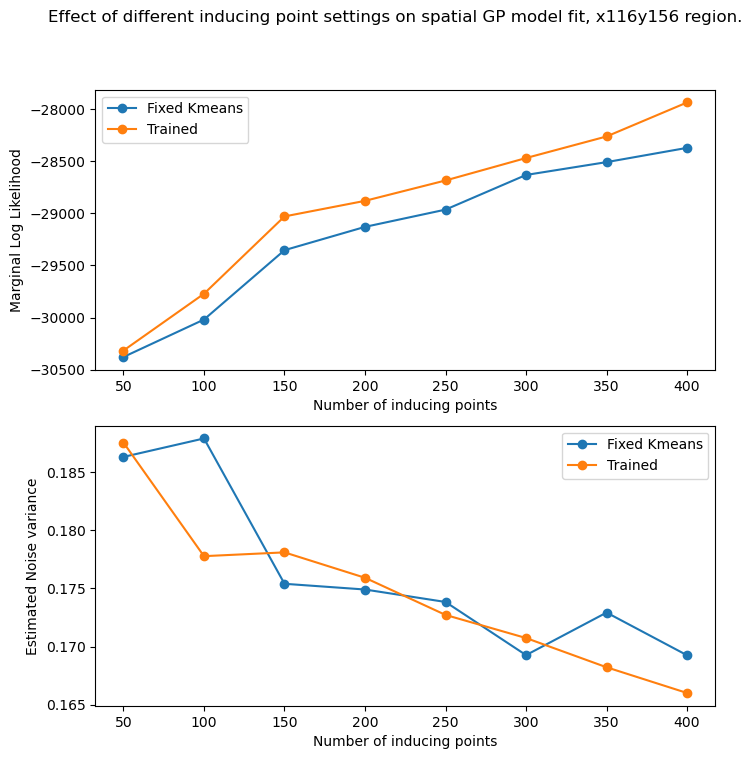

In [368]:
# Plot estimated noise variance and marginal log-likelihood for varying method for inducing points
fig, ax = plt.subplots(2, 1, figsize = (8, 8))

ax[1].plot(varyK_results.m, varyK_results['noise variance'], '-o', label ='Fixed Kmeans')
ax[1].plot(varyK_train_results.m, varyK_train_results['noise variance'], '-o', label = 'Trained')

ax[0].plot(varyK_results.m, varyK_results['maxLogLik'], '-o', label ='Fixed Kmeans')
ax[0].plot(varyK_train_results.m, varyK_train_results['maxLogLik'], '-o', label ='Trained')
for i in range(2):
    ax[i].legend()
    ax[i].set_xlabel('Number of inducing points')

ax[1].set_ylabel('Estimated Noise variance')
ax[0].set_ylabel('Marginal Log Likelihood')
fig.suptitle('Effect of different inducing point settings on spatial GP model fit, x116y156 region.')

## Compare to previous bias-correction study

In [19]:
x120y160_predictions = x116y156_resultsdict['x4y4']
x120y160_predictions = x120y160_predictions[x120y160_predictions.Time > dt.datetime(2023, 3, 9)]
x120y160_predictions['CHL_adjusted'] = x120y160_predictions.CHL012_0 + x120y160_predictions.predmean
rmse_orig = np.sqrt(np.mean((
    np.log10(x120y160_predictions.CHL012_0) - np.log10(x120y160_predictions['CHL-sat']))**2))
rmse_GP = np.sqrt(np.mean((
    np.log10(x120y160_predictions.CHL_adjusted) - np.log10(x120y160_predictions['CHL-sat']))**2))
print('Log10 +12 chl forecast, training period')
print(rmse_orig)
print('Log10 GP adjusted chl forecast, training period:')
print(rmse_GP)

Log10 +12 chl forecast, training period
0.2719525
Log10 GP adjusted chl forecast, training period:
0.2636974040258635


C:\Users\giuli\AppData\Local\Temp\ipykernel_26164\293150367.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x120y160_predictions['CHL_adjusted'] = x120y160_predictions.CHL012_0 + x120y160_predictions.predmean
c:\Users\giuli\anaconda3\envs\thesis-env\lib\site-packages\pandas\core\arraylike.py:405: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


# Results: use +60 input/outputs with same models

In [188]:
# Create new train/test for 2 locations: dfs, X/y, then do mod.predict()
def GPpreds060(spatial_mod, location):

    df_dict = merged_box9_dfs(xs =np.arange(9), ys= np.arange(9),
                         forecast_days=[ '012', '060'],
                         vars=['CHL', 'Visib', 'O2o', 'N3n'],
                         depths=[0], 
                         loc = location)
    
    for loc, df in df_dict.items():
        df['bias060'] = df['CHL-sat'] - df['CHL060_0']
        df['bias060-4days'] = df['bias060'].shift(4)
        df['CHL-sat-4days'] = df['CHL-sat'].shift(4)
    df_full = pd.concat(df_dict,axis=0, ignore_index=True)
    df_full.dropna(inplace = True)
    df_full.reset_index(inplace = True)

    input_df = df_full[['Visib060_0', 'CHL060_0', 'O2o060_0','CHL-sat-4days', 'N3n060_0', 'bias060-4days','longitude', 'latitude']]
    
    train_test_split = 0.6
    X = np.asarray(input_df, dtype=np.float64)
    # Do variable scaling 
    scaler = StandardScaler()
    X = scaler.fit_transform(X) 
    y = pd.DataFrame(df_full['bias060'])
    y = (np.asarray(y, dtype=np.float64))

    # Split train/test by date to have consecutive days for validation, but could do 60% randomly placed windows of consecutive days
    train_indices = df_full.index[df_full.Time<dt.datetime(2023, 3,9)] 
    test_indices = [i for i in np.arange(len(df_full)) if i not in train_indices]

    # Split the data into training and testing sets
    X_train, X_test = X[train_indices, ], X[test_indices, ]
    y_train, y_test = y[train_indices], y[test_indices]

    # Predict over test set and store results in spatial_results_dict
    spatial_results_dict = {}
    f_m, f_var = [np.array(x).ravel() for x in spatial_mod.predict_f(X, full_cov=False)]
    y_m, y_var = [np.array(x).ravel() for x in spatial_mod.predict_y(X)]

    f_CI = norm.ppf(0.975) * np.sqrt(f_var)
    y_CI = norm.ppf(0.975) * np.sqrt(y_var)

    # Seperate out the predictions by grid-cell location
       # Create dictionary with coordinates for that region - not all regions will have 9x9 gridcells due to land points
    coord_dict = {}
    import re
    for loc in df_dict.keys():
        match = re.match(r'x(\d+)y(\d+)', loc)
        x, y = int(match.group(1)), int(match.group(2))
        coord_dict[loc] = (x, y)

    for loc in coord_dict.keys():    
        loc_idcs = df_full.index[df_full.Point == loc].tolist()
        df = df_full.iloc[loc_idcs, ]
        results_df = pd.DataFrame({'Time':df.Time})
        results_df['lon'] = coord_dict[loc][0]
        results_df['lat'] = coord_dict[loc][1]
        results_df['predmean'] = y_m[loc_idcs]
        results_df['predvar'] = y_var[loc_idcs]
        results_df['bias060'] = df.bias060
        results_df['CHL060_0'] = df['CHL060_0']
        results_df['CHL-sat'] =  df.bias060 +  df['CHL060_0']
        results_df['y_CI'] = y_CI[loc_idcs]
        results_df['f_CI'] = f_CI[loc_idcs]
        results_df['linreg_pred'] = spatial_mod.mean_function.b.numpy() + np.dot(X[loc_idcs, ],  spatial_mod.mean_function.A.numpy()[:,0] )
        spatial_results_dict[loc] = results_df
    
    return spatial_results_dict
    
# L4
# spatial_models = [x116y156_mod, x137y146_mod, x201y175_mod, x186y256_mod, x99y256_mod, x36y306_mod, x56y76_mod]
x137y146_060_results_dict = GPpreds060(spatial_mod = spatial_models[1], location= 'x137y146')

In [189]:
# x36y306
x36y306_060_results_dict = GPpreds060(spatial_mod = spatial_models[5], location= 'x36y306')

## Validation metrics

In [192]:
for loc_resultsdict in [x137y146_060_results_dict, x36y306_060_results_dict]:
    testpreds = pd.concat(loc_resultsdict, axis=0, ignore_index=True)
    testpreds = testpreds[testpreds.Time > dt.datetime(2023, 3, 9)]
        
    validation_metrics(CHL_sat=testpreds['CHL-sat'], 
                                    bias_true=testpreds['bias060'],
                                    bias_GP_pred=testpreds['predmean'], 
                                    thresh=2, 
                                    dchl_conf=False, 
                                    return_values=False)

% Days where bias-adjustment is more accurate than original forecast: 59.93000000000001%
The original forecast:
MAE: 0.738, RMSE: 1.322, RMedianSE: 0.379,  R-squared: -0.760
                    True Bloom  True No Bloom
                                             
Predicted Bloom           1100           5162
Predicted No Bloom         809          23673
Precision: 0.18
Recall: 0.58
The GP forecast:
MAE: 0.500, RMSE: 0.968, RMedianSE: 0.315, R-squared: 0.057
                    True Bloom  True No Bloom
                                             
Predicted Bloom            704           2090
Predicted No Bloom        1205          26745
Precision: 0.25
Recall: 0.37
% Days where bias-adjustment is more accurate than original forecast: 71.0%
The original forecast:
MAE: 0.554, RMSE: 1.256, RMedianSE: 0.155,  R-squared: -6.454
                    True Bloom  True No Bloom
                                             
Predicted Bloom            204           3194
Predicted No Bloom      

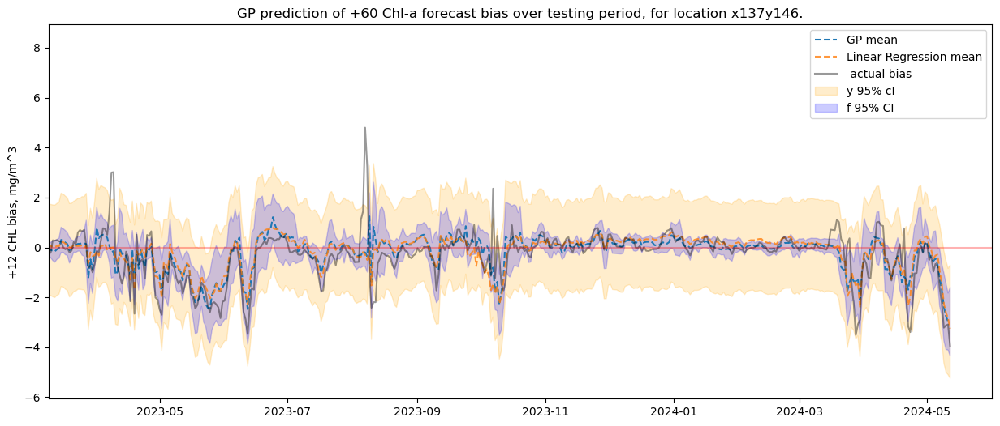

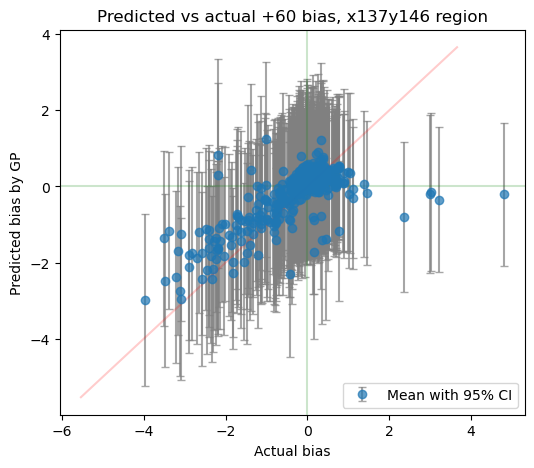

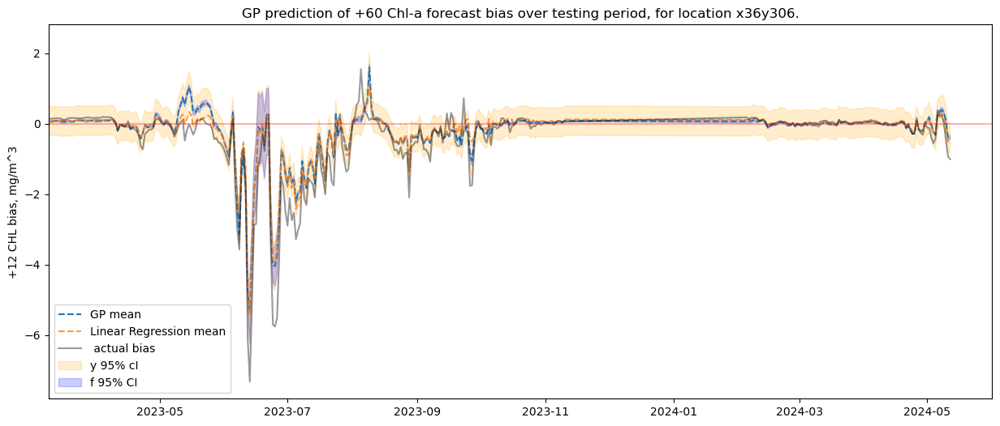

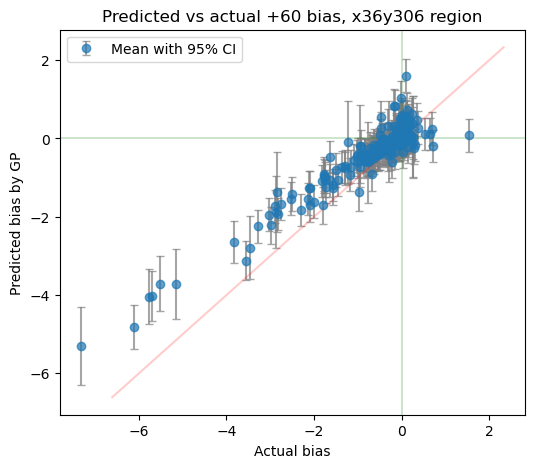

In [433]:
def plot_ts060(resultsdict, testpoint = 'x4y4', loc= 'x116y156', scatter_plot = True, testing_xlim = True):

    df = resultsdict[testpoint]#[x116y156_resultsdict['x4y4'].Time > dt.datetime(2023, 3, 9)]

    fig, ax = plt.subplots(figsize = (15,6))

    ax.plot(df['Time'], df.predmean, '--', label = 'GP mean')
    ax.plot(df['Time'], df.linreg_pred, '--', label = 'Linear Regression mean', alpha = 0.8)
    ax.plot(df.Time, df['bias060'], '-', alpha = 0.4, color = 'black', label = ' actual bias' )
    ax.fill_between(df['Time'], 
                    df.predmean - df.y_CI,
                    df.predmean + df.y_CI,
                    alpha = 0.2, color = 'orange', label = 'y 95% cI')
    ax.fill_between(df['Time'], 
                    df.predmean - df.f_CI,
                    df.predmean + df.f_CI,
                    alpha = 0.2, color = 'blue', label = 'f 95% CI')

    ax.axhline(0, alpha = 0.3, color = 'red')
    ax.set_ylabel('+12 CHL bias, mg/m^3')
    
    ax.legend()
    ax.set_title(f'GP prediction of +60 Chl-a forecast bias over testing period, for location {loc}.')

        # ax.set_xlim(min(df.iloc[test_indices,]['Time']), max(df.iloc[test_indices,]['Time']))
    if testing_xlim == True:
        ax.set_xlim(dt.datetime(2023, 3, 9), dt.ra5datetime(2024, 6, 1))
e
    if scatter_plot == True:
        df = df[df.Time > dt.datetime(2023, 3, 9)]
        scatter_preds(df['bias060'], df['predmean'], df['y_CI'], loc =loc, title= f'Predicted vs actual +60 bias, {loc} region')

plot_ts060(x137y146_060_results_dict, loc = 'x137y146', scatter_plot = True, testing_xlim = True)

plot_ts060(x36y306_060_results_dict, loc = 'x36y306', scatter_plot = True, testing_xlim = True)

# Section 5: Comparing predictions for 9x9 region - for x116y156 region

## Section 5.2: Low dimension GPs

In [89]:
def highdim_dfs(loc_dictionary):
    highdim_X = pd.DataFrame( {'Time': loc_dictionary['x0y0'].Time.values})    
    highdim_y = pd.DataFrame( {'Time': loc_dictionary['x0y0'].Time.values}) 
    for loc in loc_dictionary.keys():
        loc_dictionary[loc].dropna(axis = 0, inplace = True)
        highdim_X = highdim_X.merge(loc_dictionary[loc][['Time', 'Visib012_0', 'CHL012_0', 'O2o012_0','CHL-sat-2days', 'N3n012_0', 'bias012-2days']], on = 'Time', suffixes=('', f'_{loc}'))
        highdim_y = highdim_y.merge(loc_dictionary[loc][['Time','bias012']], on = 'Time', suffixes=('', f'_{loc}'))
    
    highdim_y.dropna(axis = 0, inplace = True)
    highdim_y.rename(columns = {'bias012': 'bias012_x0y0'}, inplace = True)
    highdim_y.reset_index(drop=True, inplace =True)

    highdim_X.dropna(axis = 0, inplace = True)
    highdim_X.rename(columns = {'CHL012_0': 'CHL012_0_x0y0'}, inplace = True)
    highdim_X.reset_index(drop=True, inplace =True)
    return highdim_X, highdim_y

In [90]:
x116y156_highdimX, x116y156_highdimy = highdim_dfs(x116y156_dfs)
x201y175_highdimX ,x201y175_highdimy= highdim_dfs(x201y175_dfs)

In [91]:
import re
coord_dict = {}
for loc in x116y156_dfs.keys():
    # print(loc)
    match = re.match(r'x(\d+)y(\d+)', loc)
    x, y = int(match.group(1)), int(match.group(2))
    coord_dict[loc] = (x, y)

In [240]:
def PCA_dimred(highdim_X, highdim_y):
    features = highdim_X.drop(['Time'], axis = 1, inplace = False)
    n_comps = 10
    pcaX = PCA(n_components=n_comps)

    # Do standard scaling
    scale_x = StandardScaler()
    features = highdim_X.drop(['Time'], axis = 1, inplace = False)
    feature_names = features.columns
    features = pd.DataFrame(scale_x.fit_transform(features))
    features.columns = feature_names

    fit = pcaX.fit(features)
    pca_X = pcaX.fit_transform(features)

    explained_variance_x = pcaX.explained_variance_ratio_
    fig, ax = plt.subplots(1, 2, figsize = (12, 4))
    ax[0].plot(np.arange(1, n_comps + 1) , np.cumsum(explained_variance_x)) # 14 PCs?
    # ax[0].xlim(0,n_comps) 
    ax[0].axhline(0.9, alpha = 0.5, color = 'red')
    ax[0].set_xlabel('Principal Components (PCs)')
    ax[0].set_ylabel('Proportion of Variance Explained (PVE)')
    ax[0].set_title('PVE for PCs of inputs')
    
    n_comps = 8
    pcay = PCA(n_components=n_comps)
    output = highdim_y.drop(['Time'], axis = 1, inplace = False)
    scale_y = StandardScaler(with_std=False) # only subtract mean
    output = scale_y.fit_transform(output)
    fit_y = pcay.fit(output)
    pca_y = pcay.fit_transform(output)
    explained_variance_y = pcay.explained_variance_ratio_


    # Proportion of variance explained plot
    ax[1].plot(np.arange(1, n_comps+1), np.cumsum(explained_variance_y), label = 'outputs') # 6 PCs crosses 0.9 threshold. 
    ax[1].set_xlabel('Principal Components (PCs)')
    ax[1].set_ylabel('Proportion of Variance Explained (PVE)')
    ax[1].set_title('PVE for PCs of outputs')
    ax[1].axhline(0.9, alpha = 0.5, color = 'red')

    # Show weights for first 10 PCs of ouputs
    fig, axes = plt.subplots(2, 4, figsize = (5*4, 4*2), constrained_layout = True) 

    loadings = pcay.components_
    for i in np.arange(n_comps):    
        ax = axes[i//4, i%4]
        weightgrid = np.full((9,9), np.nan)
        j =0
        for loc, (x,y) in coord_dict.items():
            weightgrid[y,x] = loadings[i, j]
            j+=1
        im = ax.imshow(weightgrid, cmap='RdBu_r', aspect='auto', origin='lower',
                        vmax =0.4, vmin = -0.4)
                # Add colorbar
        cbar = plt.colorbar(im, ax=ax)
        ax.set_title(f'PC{i+1} weights')
    return pca_X, pca_y, pcaX, pcay, scale_y

x201y175 region
x116y156 region


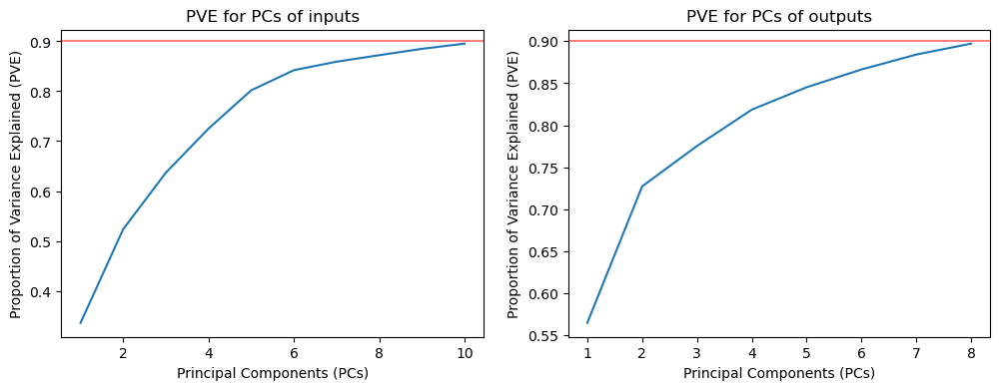

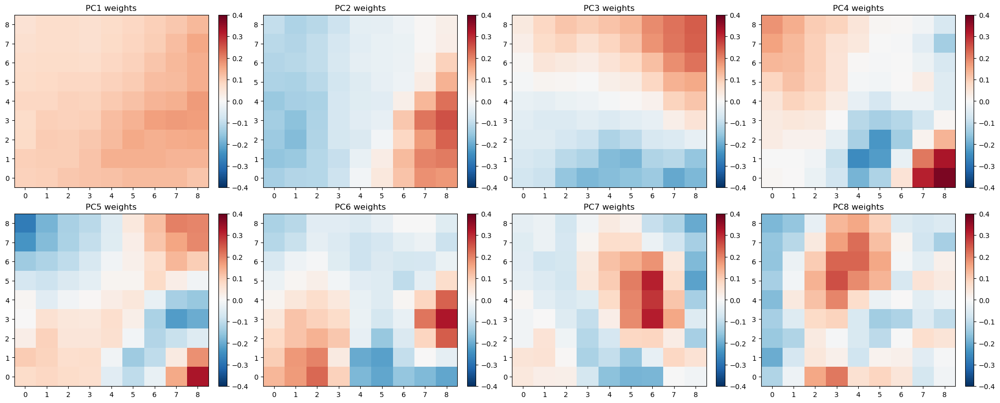

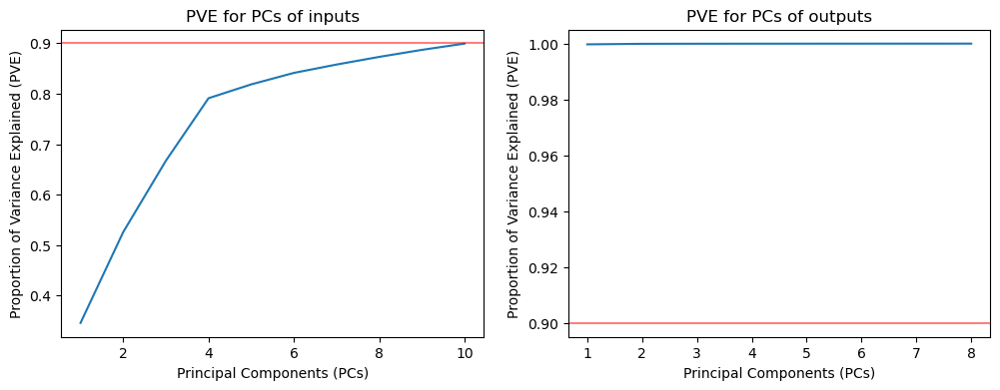

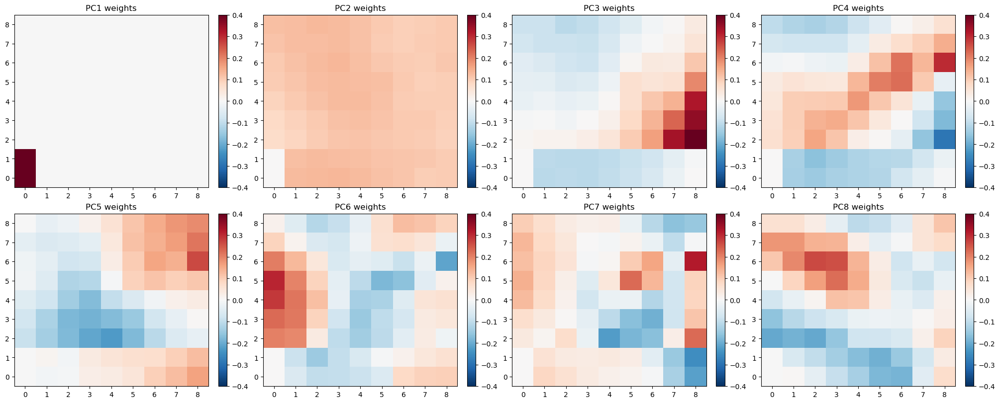

In [241]:
print('x201y175 region')
x201y175_lowdimX, x201y175_lowdimy, x201y175pcaX, x201y175pcay, x201y175scale_y =  PCA_dimred(x201y175_highdimX, x201y175_highdimy)
print('x116y156 region')
x116y156_lowdimX, x116y156_lowdimy, x116y156pcaX, x116y156pcay, x116y156scale_y =  PCA_dimred(x116y156_highdimX, x116y156_highdimy)

For both choose 10 PCs for inputs, 8 PCs for ouputs. Based on when PVE >90% and the weight patterns for the outputs look like noise rather than bias spatial patterns. 

In [102]:
# Implement the GP for each of the output transformed components (independently) 
#  convert the predictions back into higher dimensional space - will need to retain the pcaX and pcay.components_ for each location..  
def fit_lowdimGPs(lowdimX, lowdimy, pcaX, pcay, yPCs, XPCs, scale_y):
    '''
    Input the PC-transformed inputs and ouputs, with the pca transformations, so that the outputs can converted back to original dimension.
    y/XPCs is the number of PCs to use as inputs/outputs
    '''
    # Set up input and output arrays
    train_test_split = 0.6
    X = np.asarray(lowdimX[:, 0:XPCs], dtype=np.float64)
    N = X.shape[0]        
    split_idx = int(train_test_split * N)
    # Change the train/test split to be by date to ensure that can compare the same days between models of the 9x9 regions.
    train_indices = np.arange(0, split_idx, 1)
    # train_indices = np.random.choice(N, size=split_idx, replace=False)
    test_indices = [i for i in np.arange(N) if i not in train_indices]
    # print(lowdimX.Time.iloc[test_indices[-1]])
    # Split the data into training and testing sets
    X_train, X_test = X[train_indices, ], X[test_indices, ]
    predicted_means = []
    predicted_vars = []
    for i in np.arange(yPCs):
        y = (np.asarray(lowdimy[:, i], dtype=np.float64)).reshape(N, 1)
        y_train, y_test = y[train_indices], y[test_indices]
        
        model = gpflow.models.GPR(
                (X_train, y_train),
                kernel = gpflow.kernels.SquaredExponential(lengthscales= np.repeat(0.5, X.shape[1])), 
                ) 

        opt = gpflow.optimizers.Scipy()
        opt.minimize(model.training_loss, # loss function is pre-defined by GPflow's own models
                    model.trainable_variables)
        y_m, y_var = [np.array(x).ravel() for x in model.predict_y(X_test)]
        predicted_means.append(y_m)
        predicted_vars.append(y_var)

    # Tranform predictions back to original high dimensions
    pred_means = np.stack(predicted_means, axis = 1)
    mean_scaled = pcay.inverse_transform(pred_means)
    # print(mean_scaled)
    mean_orig = scale_y.inverse_transform(mean_scaled)

    pred_vars = np.stack(predicted_vars, axis = 1)
    print(pred_vars.shape)
    var_orig = pred_vars @ (pcay.components_ **2)
    mean_orig = pd.DataFrame(mean_orig)
    yCIs = pd.DataFrame(norm.ppf(0.975)*np.sqrt(var_orig))
    mean_orig.columns = coord_dict.keys()
    yCIs.columns = coord_dict.keys()
    return mean_orig, yCIs, var_orig, test_indices


In [104]:
x116y156lowdim_mean, x116y156lowdim_yCIs,x116y156lowdim_var, x116y156test_indices  = fit_lowdimGPs(x116y156_lowdimX, x116y156_lowdimy, x116y156pcaX, x116y156pcay, 8, 10, x116y156scale_y) 

(429, 8)


Really to be comparable I should have removed the linear regression mean from the whole region grid. Do this if I have time. 

Check the inverse transform method

In [455]:
x201y175lowdim_mean, x201y175lowdim_yCIs, x201y175test_indices  = fit_lowdimGPs(x201y175_lowdimX, x201y175_lowdimy, x201y175pcaX, x201y175pcay, 8, 10, x201y175scale_y) 

(429, 8)


% Days where bias-adjustment is more accurate than original forecast: 42.65%
The original forecast:
MAE: 1.170, RMSE: 2.306, RMedianSE: 0.548,  R-squared: 0.137
                    True Bloom  True No Bloom
                                             
Predicted Bloom          10967           2736
Predicted No Bloom        6709          14337
Precision: 0.8
Recall: 0.62
The GP forecast:
MAE: 1.293, RMSE: 2.249, RMedianSE: 0.767, R-squared: 0.179
                    True Bloom  True No Bloom
                                             
Predicted Bloom          12937           6647
Predicted No Bloom        4739          10426
Precision: 0.66
Recall: 0.73


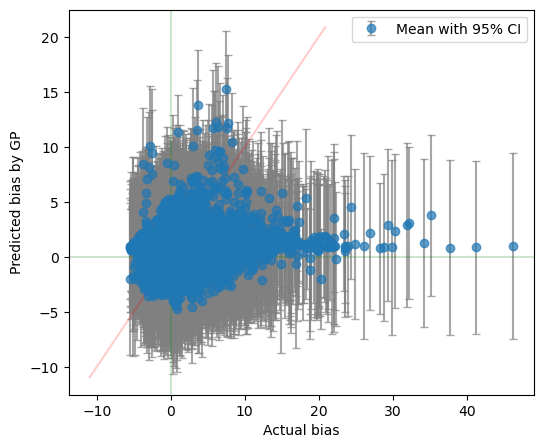

In [ ]:
pred_mean = pd.DataFrame(x201y175lowdim_mean).values.flatten()
pred_CIs = pd.DataFrame(x201y175lowdim_yCIs).values.flatten()
x201y175_highdimy.reset_index(inplace = True)
x201y175_highdimX.reset_index(inplace = True)

true_bias = x201y175_highdimy.iloc[x201y175test_indices,2: ].values.flatten()

# Isolate columns in x201y175_highdimX that start with 'CHL012_0'
chl_cols = [col for col in x201y175_highdimX.columns if col.startswith('CHL012_0')]
chl_sat = x201y175_highdimX.iloc[x201y175test_indices,].loc[:, chl_cols].values.flatten() + true_bias

validation_metrics(CHL_sat = chl_sat, bias_true = true_bias, 
                   bias_GP_pred = pred_mean)

scatter_preds(y_test = true_bias, y_m =  pred_mean,
             y_CI = pred_CIs , loc = 'x201y175 region')


In [458]:
print(np.median(pred_CIs))

2.410285383338594


In [169]:
# Validation of results
x116y156_lowdim_predmean2 = x116y156lowdim_mean.copy()
# x116y156_lowdim_predmean2.columns= x116y156_dfs.keys()
x116y156_lowdim_predmean2['Time'] = x116y156_highdimy.Time[1071-429+1:, ].values

x116y156_lowdim_predvar2 = pd.DataFrame(x116y156lowdim_var).copy()
x116y156_lowdim_predvar2.columns= x116y156_dfs.keys()
x116y156_lowdim_predvar2['Time'] = x116y156_highdimy.Time[1071-429+1:, ].values

# pred_CIs = pd.DataFrame(x116y156lowdim_yCIs).values.flatten()
# x116y156_highdimy.reset_index(inplace = True)
# x116y156_highdimX.reset_index(inplace = True)
# true_bias = x116y156_highdimy.iloc[x116y156test_indices,2: ].values.flatten()
'''
# Isolate columns in x116y156_highdimX that start with 'CHL012_0'
chl_cols = [col for col in x116y156_highdimX.columns if col.startswith('CHL012_0')]
chl_sat = x116y156_highdimX.iloc[x116y156test_indices,].loc[:, chl_cols].values.flatten() + true_bias

validation_metrics(CHL_sat = chl_sat, bias_true = true_bias, 
                   bias_GP_pred = pred_mean)

scatter_preds(y_test = true_bias, y_m =  pred_mean,
             y_CI = pred_CIs , loc = 'x116y156 region')
'''

"\n# Isolate columns in x116y156_highdimX that start with 'CHL012_0'\nchl_cols = [col for col in x116y156_highdimX.columns if col.startswith('CHL012_0')]\nchl_sat = x116y156_highdimX.iloc[x116y156test_indices,].loc[:, chl_cols].values.flatten() + true_bias\n\nvalidation_metrics(CHL_sat = chl_sat, bias_true = true_bias, \n                   bias_GP_pred = pred_mean)\n\nscatter_preds(y_test = true_bias, y_m =  pred_mean,\n             y_CI = pred_CIs , loc = 'x116y156 region')\n"

In [460]:
np.median( pd.DataFrame(x116y156lowdim_yCIs).values.flatten())

0.7518695931904779

## Section 5.1: Independent GPs

In [461]:
# Create function to get mean of adjacent grid-cells within the box9 region.
def get_adjacent_average(location, locations_dict):

    # Extract x and y from location string (e.g., 'x4y5' -> x=4, y=5)
    x, y = coord_dict[location]

    # Define all 8 possible adjacent directions (including diagonals)
    directions = [
        (-1, -1), (-1, 0), (-1, 1),  # Top row
        (0, -1),           (0, 1),   # Middle row (excluding center)
        (1, -1),  (1, 0),  (1, 1)    # Bottom row
    ]
    
    adjacent_values = pd.DataFrame({'Time': locations_dict['x0y0'].Time })
    
    # Check each adjacent cell
    for dx, dy in directions:
        adj_x, adj_y = x + dx, y + dy
        
        # Check if the adjacent cell is within bounds (0-8 for both x and y)
        if 0 <= adj_x <= 8 and 0 <= adj_y <= 8:
            adj_location = f"x{adj_x}y{adj_y}"
            
            # If the adjacent cell exists in our dictionary, add its value
            if adj_location in coord_dict:
                adjacent_values[adj_location] = locations_dict[adj_location]['bias012-2days']    

# Calculate basic statistics
    adjacent_values['neighbour_bias-2days_means'] = adjacent_values.iloc[:, 1:].mean(axis=1)
    adjacent_values['neighbour_bias-2days_stds'] = np.sqrt(adjacent_values.iloc[:, 1:].var(axis=1))
    
    # Return the average if we found adjacent values, otherwise None
    return adjacent_values[['Time', 'neighbour_bias-2days_means','neighbour_bias-2days_stds']] 

# Create function to fit GP for that grid cell, adding the neighbour average valuse as an input variable
def fit_indep_region(loc_dictionary):
    results = {}
    params = {}
    for loc in loc_dictionary.keys():
        df = loc_dictionary[loc]
        # df['bias012-2days']= df.bias012.shift(2)
        spat_summ = get_adjacent_average(loc, loc_dictionary)
        df = df.merge(spat_summ, on = 'Time', how = 'left')
        df.dropna(axis = 0, inplace = True)
        
        # create arrays to fit GP
        input_df = df[['neighbour_bias-2days_means','neighbour_bias-2days_stds', 'bias012-2days', 'Visib012_0', 'CHL012_0', 'O2o012_0','CHL-sat-2days', 'N3n012_0']]
        X = np.asarray(input_df, dtype = np.float64)
        # Same as before
        scaler = StandardScaler()
        X = scaler.fit_transform(X)
        y = pd.DataFrame( df['bias012'] )
        y = (np.asarray(y, dtype=np.float64))

        # Set train/test with random subset of datset, 60% train 40% test
        split_idx = int(0.6 * len(df))
        # Train/test split by date to ensure that can compare days between methods for 9x9 region
        train_indices = np.arange(0, split_idx, 1)
        test_indices = [i for i in np.arange(len(df)) if i not in train_indices]

        X_train, X_test = X[train_indices, ], X[test_indices, ]
        y_train, y_test = y[train_indices], y[test_indices]
        # print(f'Training dataset dimensions: {X_train.shape}')
        # print(f'Testing set size: {y_test.shape[0]}')

        # Adding linear regression mean function
        reg_indices = np.random.choice(train_indices, size=300, replace=False).tolist() 
        reg = LinearRegression().fit(X[reg_indices, ], y[reg_indices ])
        A_array = reg.coef_.T


        model = gpflow.models.GPR(
        (X_train, y_train),
        kernel = gpflow.kernels.SquaredExponential(lengthscales= np.repeat(0.5, 8)),
        noise_variance=0.04,
        mean_function = gpflow.functions.Linear(A = A_array,
                                b = reg.intercept_)
        ) 
        # Fix the linear regression coefficients for the mean function
        gpflow.set_trainable(model.mean_function.A, False) 
        gpflow.set_trainable(model.mean_function.b, False)

        # Use the default BFGS optimizer
        opt = gpflow.optimizers.Scipy()
        opt.minimize(model.training_loss, # loss function is pre-defined by GPflow's own models
                    model.trainable_variables)
        # print_summary(model)

        # Collect predictions and estimated parameters
        y_m, y_var = model.predict_y(X_test)
        # print(df.Time.iloc[test_indices].shape)
        # print(df.CHL012_0.iloc[test_indices].shape)
        resultsdf = pd.DataFrame({'Time': df.Time.iloc[test_indices], 
                                  'predmean': y_m[:,0], 
                                  'predvar': y_var[:,0], 
                                  'bias012': y_test[:,0], 
                                  'CHL012_0': df.CHL012_0.iloc[test_indices]})
        paramsdf = pd.DataFrame(index = [loc])
        
        # paramsdf['kernel.lengthscales'] = [model.trainable_parameters[0].numpy()]
        paramsdf['kernel.variance'] = [model.kernel.variance.numpy()]
        paramsdf['likelihood.variance'] = [model.likelihood.variance.numpy()]
        
        paramsdf['intercept'] = [reg.intercept_[0]]
        for i, var in enumerate(input_df.columns):
            paramsdf[f'{var}_coef'] = [reg.coef_[0,i]]
            paramsdf[f'{var}_lengthscale'] = model.kernel.lengthscales[i].numpy()
        params[loc] = paramsdf
        results[loc] = resultsdf
    return params, results
    # '''
# Loop through the 81 grid cells, store predictions 


In [189]:
# Save the dictionary of dfs as a .pickle object
import pickle
# with open('x116y156_indep_params.pickle', 'wb') as f:
#     # Pickle the 'data' dictionary using the highest protocol available.
#     pickle.dump(x116y156_indep_params, f, pickle.HIGHEST_PROTOCOL)


with open('x116y156_indep_params.pickle', 'rb') as f:
    # The protocol version used is detected automatically, so we do not
    # have to specify it.
    x116y156_indep_params = pickle.load(f)

# with open('x116y156_indep_results.pickle', 'wb') as f:
#     # Pickle the 'data' dictionary using the highest protocol available.
#     pickle.dump(x116y156_indep_results, f, pickle.HIGHEST_PROTOCOL)


with open('x116y156_indep_results.pickle', 'rb') as f:
    # The protocol version used is detected automatically, so we do not
    # have to specify it.
    x116y156_indep_results = pickle.load(f)


In [ ]:
# They took so long that I saved the files to import
# x116y156_indep_params, x116y156_indep_results =  fit_indep_region(x116y156_dfs)
# x201y175_indep_params, x201y175_indep_results =  fit_indep_region(x201y175_dfs)
# took 20 minutes each

In [472]:
# Save the dictionary of dfs as a .pickle object
# with open('x201y175_indep_params.pickle', 'wb') as f:
#     # Pickle the 'data' dictionary using the highest protocol available.
#     pickle.dump(x201y175_indep_params, f, pickle.HIGHEST_PROTOCOL)


with open('x201y175_indep_params.pickle', 'rb') as f:
    # The protocol version used is detected automatically, so we do not
    # have to specify it.
    x201y175_indep_params = pickle.load(f)

# with open('x201y175_indep_results.pickle', 'wb') as f:
#     # Pickle the 'data' dictionary using the highest protocol available.
#     pickle.dump(x201y175_indep_results, f, pickle.HIGHEST_PROTOCOL)


with open('x201y175_indep_results.pickle', 'rb') as f:
    # The protocol version used is detected automatically, so we do not
    # have to specify it.
    x201y175_indep_results = pickle.load(f)


In [473]:
# For x116y156

validation_metrics(CHL_sat = pd.concat(x116y156_indep_results).CHL012_0 + pd.concat(x116y156_indep_results).bias012, 
                   bias_true = pd.concat(x116y156_indep_results).bias012, 
                   bias_GP_pred = pd.concat(x116y156_indep_results).predmean)

% Days where bias-adjustment is more accurate than original forecast: 50.339999999999996%
The original forecast:
MAE: 0.424, RMSE: 0.760, RMedianSE: 0.220,  R-squared: -1.368
                    True Bloom  True No Bloom
                                             
Predicted Bloom            298           2100
Predicted No Bloom         671          31680
Precision: 0.12
Recall: 0.31
The GP forecast:
MAE: 0.364, RMSE: 0.593, RMedianSE: 0.228, R-squared: -0.443
                    True Bloom  True No Bloom
                                             
Predicted Bloom            183           1021
Predicted No Bloom         786          32759
Precision: 0.15
Recall: 0.19


In [477]:
x120y160_indep_results = x116y156_indep_results['x4y4']
validation_metrics(CHL_sat = x120y160_indep_results.CHL012_0 + x120y160_indep_results.bias012, 
                   bias_true = x120y160_indep_results.bias012, 
                   bias_GP_pred = x120y160_indep_results.predmean)

% Days where bias-adjustment is more accurate than original forecast: 57.809999999999995%
The original forecast:
MAE: 0.446, RMSE: 0.747, RMedianSE: 0.234,  R-squared: -1.177
                    True Bloom  True No Bloom
                                             
Predicted Bloom              2             27
Predicted No Bloom          12            388
Precision: 0.07
Recall: 0.14
The GP forecast:
MAE: 0.302, RMSE: 0.484, RMedianSE: 0.190, R-squared: 0.085
                    True Bloom  True No Bloom
                                             
Predicted Bloom              1              7
Predicted No Bloom          13            408
Precision: 0.12
Recall: 0.07


### x201y175

In [ ]:
# For x201y175
validation_metrics(CHL_sat = pd.concat(x201y175_indep_results).CHL012_0 + pd.concat(x201y175_indep_results).bias012, 
                   bias_true = pd.concat(x201y175_indep_results).bias012, 
                   bias_GP_pred = pd.concat(x201y175_indep_results).predmean)



In [ ]:
np.median(1.96*np.sqrt(pd.concat(x201y175_indep_results).predvar))

## Comparing 3 spatial methods' predictions over region

C:\Users\giuli\AppData\Local\Temp\ipykernel_23124\571459187.py:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  truegrid[y,x] = x116y156_highdimy[x116y156_highdimy.Time == day][f'bias012_{loc}'].values
C:\Users\giuli\AppData\Local\Temp\ipykernel_23124\571459187.py:8: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  vargrid[y, x] = x116y156_lowdim_predvar2[x116y156_lowdim_predvar2.Time ==day][loc].values


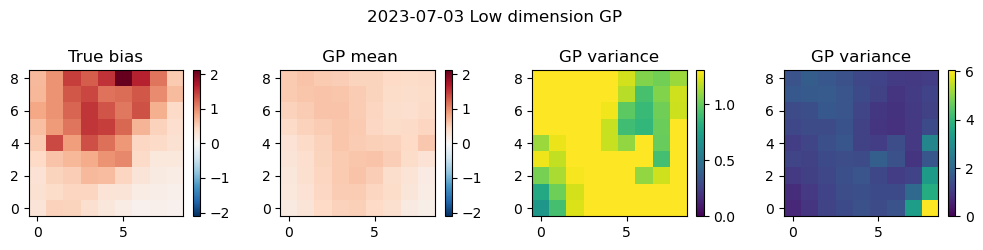

In [217]:
def region_vis(day = dt.datetime(2024, 4, 1), var_vmax = None, bias_vmax=4):
    meangrid = np.full((9,9), np.nan)
    vargrid = np.full((9,9), np.nan)
    truegrid = np.full((9,9), np.nan)
    for loc, (x,y) in coord_dict.items():
        truegrid[y,x] = x116y156_highdimy[x116y156_highdimy.Time == day][f'bias012_{loc}'].values
        meangrid[y, x] = x116y156_lowdim_predmean2[x116y156_lowdim_predmean2.Time == day][loc]
        vargrid[y, x] = x116y156_lowdim_predvar2[x116y156_lowdim_predvar2.Time ==day][loc].values

    # Plot heatmap
    fig, ax = plt.subplots(1, 4, figsize = (10,2.5)) 

    # Plot the True bias
    if bias_vmax != None:
        vmax = bias_vmax
    else:
        vmax = np.max(np.abs(truegrid))
    im = ax[0].imshow(truegrid, cmap='RdBu_r', aspect='auto', origin='lower',
                vmax =vmax, vmin = -vmax)
    # Add colorbar
    cbar = plt.colorbar(im, ax=ax[0])
    ax[0].set_title(f'True bias')

    # Plot the GP predicted mean
    # vmax = np.max(np.abs(meangrid))
    im = ax[1].imshow(meangrid, cmap='RdBu_r', aspect='auto', origin='lower',
                vmax =vmax, vmin = -vmax)
    # Add colorbar
    cbar = plt.colorbar(im, ax=ax[1])
    ax[1].set_title(f' GP mean')

    # Plot the GP variance
    if var_vmax != None:
        vmax = var_vmax
    else:
        vmax = np.max(np.abs(vargrid))
    im = ax[2].imshow(vargrid, cmap='viridis', aspect='auto', origin='lower',
                vmax =vmax, vmin = 0)
    # Add colorbar
    cbar = plt.colorbar(im, ax=ax[2], )
    ax[2].set_title('GP variance')

    im = ax[3].imshow(vargrid, cmap='viridis', aspect='auto', origin='lower',
                vmax =np.max(np.abs(vargrid)), vmin = 0)
    # Add colorbar
    cbar = plt.colorbar(im, ax=ax[3], )
    ax[3].set_title('GP variance')
    fig.suptitle(f'{day.strftime("%Y-%m-%d")} Low dimension GP')
    plt.tight_layout()

region_vis(day = dt.datetime(2023, 7, 3), var_vmax=1.3, bias_vmax=None)

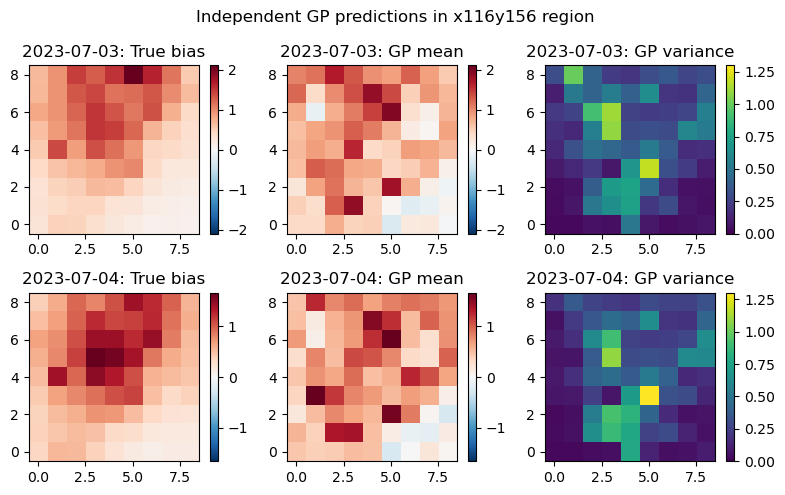

In [214]:
# x116y156_indep_results
# x116y256_resultsdict
days = [dt.datetime(2023, 7, 3) + dt.timedelta(days=int(x)) for x in np.arange(2)]
preds_vis(days, results_dict = x116y156_indep_results, var_vmax = 1.3, bias_vmax=None,
title = 'Independent GP predictions in x116y156 region')

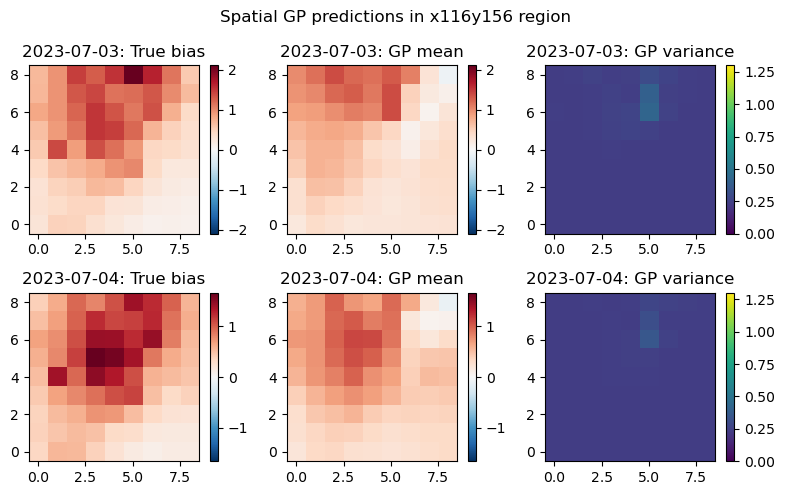

In [213]:
days = [dt.datetime(2023, 7, 3) + dt.timedelta(days=int(x)) for x in np.arange(2)]
preds_vis(days, results_dict = x116y156_resultsdict, bias_vmax = None, var_vmax = 1.3,
title = 'Spatial GP predictions in x116y156 region')

## Comparing parameter estimates

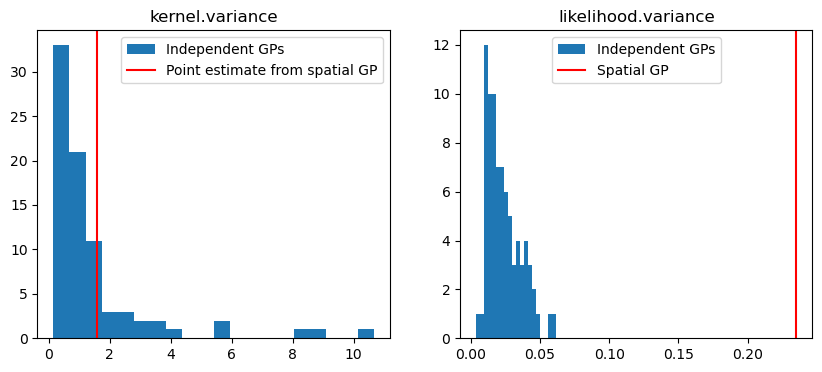

In [ ]:
x116y156_indep_params_df = pd.concat(x116y156_indep_params)
parameters_to_show = x116y156_indep_params_df.columns[0:2]
fig, ax = plt.subplots(1, len(parameters_to_show), figsize = (5* len(parameters_to_show), 4) )
for i, param in enumerate(parameters_to_show):
    # print(i, param)
    ax[i].hist(x116y156_indep_params_df[param], bins = 20, label = 'Independent GPs')
    ax[i].set_title(x116y156_indep_params_df.columns[i])

ax[1].axvline(hyperparams[hyperparams.hyperparameter == 'noise_variance']['x116y156'].values, 
              lagibel = 'Spatial GP', color = 'red')
ax[1].legend()
ax[0].axvline(hyperparams[hyperparams.hyperparameter == 'k2variance']['x116y156'].values,
               label = 'Point estimate from spatial GP', color = 'red')
ax[0].legend()